# THE LOOPER 
# Part I: Fe abundances and stellar parameters

version: 27.06.24

### This Notebook:

 1) Measures EWs for given FeI and FeII lines using pyEW package (v.1.0.0.) developed by 
Monika Adamow (https://github.com/madamow/pyEW) .

2) Generates plots displaying Gaussian, Multigaussian, and Voigt fits for individual lines.

3) Measures iron abundances with MOOG using q<sup>2</sup> Python package ([Ramirez et al. 2014, A&A, 572, A48](https://www.aanda.org/articles/aa/full_html/2014/12/aa24244-14/aa24244-14.html))

4) Creates diagnostic plots A(Fe) vs $\chi$, A(Fe) vs log(EW/$\lambda$), and A(Fe) vs $\lambda$ 

5) Applies NLTE corrections by quering [Inspect](http://www.inspect-stars.com/) and/or [MPIA](https://nlte.mpia.de/gui-siuAC_secE.php) database(s) based on scripts developed by Anya Dovgal (https://github.com/anyadovgal/NLTE-correction.git)

6) Optimizes logg value based on ionization equilibrium between A(FeI)_NLTE and A(FeII)

7) Runs MC simulation for Fe abundances within 1 sigma of stellar parametrs



In [2]:
pwd

'/Users/dariazaremba/Desktop/PY_LOOPER'

In [4]:
home_dir = '/Users/dariazaremba/Desktop/PY_LOOPER'
pyEW_dir = f'{home_dir}/pyEW_modified'
moog_dir = f'{home_dir}/moog_q2'

# 1. Run pyEW to get EWs

## General idea behind pyEW:

### I) Finding lines

pyEW uses derivative spectroscopy to accurately isolate weak signals from background noise, as well as blended lines. 

The width of peaks becomes narrower with higher-order derivatives. This means that extreme values
that might be obscured by overlapping components become more pronounced in higher-order derivative
spectra (Butler 1979).

The general calculation of a derivative involves dividing the difference between the original spectrum $f(\lambda)$ and the same spectrum displaced by a finite wavelength $f(\lambda + \Delta\lambda)$
 by that finite wavelength $\Delta\lambda$, which is associated with the midpoint of the finite wavelength, resulting in $\frac{df}{d\lambda}(\lambda + \frac{1}{2} \Delta\lambda)$ and the higher derivatives are obtained by repeating this procedure the desired number of times (Butler 1979).

I found this paper pretty useful for understanding derivative spectroscopy: https://arxiv.org/pdf/2404.03866v1

Which lines are considered strong enough for fitting is defined by the user by setting the threshold for the peaks of third derivative (`r_lvl` parameter in the configuration file explained below).

### II) Measuring EWs

The continuum can be locally normalized within a specified wavelength range of ± offset, where the offset is user-defined. During the renormalization process, any hot pixels are eliminated, a polinomial of selected order is employed and the local noise is estimated as the standard deviation of the residuals.

After identifying strong lines within the specified wavelength range around the line from linelist, pyEW fits each of them using multigaussian profiles, and fits the line from the linelist using single Gaussian and Voigt profiles. This way, the user can see:

* Possible blends, if Multigaussian provides better fit than single Gaussian.
* Possibly very strong lines, if Voigt profile provides better fit than Gaussian.

Better fit is determined by evaluating the residuals.

The limits on weak and strong lines in terms of EW can also be set in the config file, as explained below. Too weak/strong lines will not be used for moog input (abundances calculation). 

In [11]:
pip install scikit-learn

DEPRECATION: Loading egg at /Users/dariazaremba/anaconda3/lib/python3.11/site-packages/pyEW-1.0.0-py3.11.egg is deprecated. pip 23.3 will enforce this behaviour change. A possible replacement is to use pip for package installation..
  Obtaining dependency information for scikit-learn from https://files.pythonhosted.org/packages/ff/91/609961972f694cb9520c4c3d201e377a26583e1eb83bc5a334c893729214/scikit_learn-1.5.2-cp311-cp311-macosx_10_9_x86_64.whl.metadata
  Obtaining dependency information for threadpoolctl>=3.1.0 from https://files.pythonhosted.org/packages/4b/2c/ffbf7a134b9ab11a67b0cf0726453cedd9c5043a4fe7a35d1cefa9a1bcfb/threadpoolctl-3.5.0-py3-none-any.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.1/12.1 MB 19.2 MB/s eta 0:00:0000:0100:01
Note: you may need to restart the kernel to use updated packages.


In [13]:
import os
import shutil
import sys
import matplotlib.pyplot as plt
package_directory = os.path.join(pyEW_dir, 'pyew')
sys.path.append(package_directory)
import pyew

In [15]:
sys.path.append("%s/lib/" % package_directory)

from IO_functions import *
from Prepare_spectrum import *
from Line_analysis import *
from Plotting import *
import getEW

In [17]:
star_id = 'HD222925'

In [19]:
Teff = 5636
logg = 2.54
feh = -1.47
vt = 2.2

### Generate a configuration file for running pyEW. Below are descriptions of the parameters.

<span style="color:red;">Make sure you put your spectrum and linelist in `pyEW_modified/PYEW_INPUT` directory.</span> 

<span style="color:blue;">*Input files section*: </span>
- `files_list` - full path to file that includes a list of spectra for analysis.
There might be more than one spectrum listed on this list. 
- `line_list_file` - full path to a file that includes a list of lines for analysis.
 

<span style="color:blue;">*Spectrum section*: </span>
- `off` - defines the range of spectrum around chosen line that will be analyzed. 
The range will be defined as: [x0-off, x0+off], where x0 is a center of line to be measured. 
- `s_factor` - a parameter for smoothing. This number should be lower if in defined range the number of points 
is low.
- `rejt_auto` - the value should be True or False. If True, signal to noise (SN) 
will be calculated based on ranges provided in the next setion of the config file.
The SN is required for local continuum fitting. If rejt_auto is set to False,
value specified by user will be used.
- `local_cont` - True or False - fit local continuum.
- `rejt` - parameter for local continuum fitting if rejt_auto = False. 
It is defined as 1 - 1/SN (see ARES paper for the definition od rejt:
 http://www.astro.up.pt/~sousasag/ares/2007_AA_Sousa.pdf )
- `t_sig` - threshold for hot pixels (t_sig * standard deviation of flux values) 

<span style="color:blue;">*Lines  section*: </span>
- `r_lvl` - minimum level for finding strong lines. This is applied to third derivative 
as r_lvl * standard deviation(3rd derivative)
and presented as two red,vertical lines on lower panel of the plot. 
The purpose of this is to control the number of lines introduced to multi gaussian fit.
- `w_factor` - area around center of line: x0 +/- fwhm * w_factor. Defines green-shaded region around 
line center 
- `l_eqw` - minimum value of equivalent width (EW) (in mA) to consider.
 This parameter is set to eliminate lines too week to be included in this analysis.
- `h_eqw` - maximum value of EW in mA. This parameter is  to eliminate lines too strong 
and possibly saturated that should not be included in the analysis.
- `det_level` - maximum difference (in A) between x0 and line position in spectrum.
- `v_lvl` - minimum reduced eqw that should be used for considering if Voigt profile
should be considered in analysis.If rEW>v_lvl, check Voigt profile. <span style="color:red;">Tip: use 0 to disable fitting Voigt profile.</span>
- `plot_flag` - True or False - should I do plot for ALL lines?
- `show_lines` - show plot for some lines, 0 if no lines should be plotted, 
or  line1 line2 ... otherwise.

In [57]:
# input_file = f"{pyEW_dir}/PYEW_INPUT/{star_id}_normrv.xyz"
# output_file = f"{pyEW_dir}/PYEW_INPUT/{star_id}_normrv.xy"
# xyz_to_xy(input_file, output_file)

### Renormalize(scale) spectrum to adjust continuum level:

In [24]:
spectrum_path = f"{pyEW_dir}/PYEW_INPUT/{star_id}_normrv.xy"
divisor = 0.95
scaled_spectrum_path = f"{pyEW_dir}/PYEW_INPUT/{star_id}_normrv_scaled_{divisor}.xy"

renormalize_spectrum(spectrum_path, scaled_spectrum_path, divisor)

percentage_change = ((1 - 1 / divisor) / 1) * 100

if divisor > 1:
    print("The continuum level will be raised by approximately {:.2f}%".format(abs(percentage_change)))
else:
    print("The continuum level will be lowered by approximately {:.2f}%".format(abs(percentage_change)))

Renormalized spectrum saved to /Users/dariazaremba/Desktop/PY_LOOPER/pyEW_modified/PYEW_INPUT/HD222925_normrv_scaled_0.95.xy
The continuum level will be lowered by approximately 5.26%


### Adjust parameters for EW mesurements:

In [31]:
### INPUT_FILES
#spectrum_path = f"{pyEW_dir}/PYEW_INPUT/{star_id}_normrv.xy" #YOUR SPECTRUM NAME
spectrum_path = scaled_spectrum_path
#line_list_file = f'{pyEW_dir}/PYEW_INPUT/Fe_linemake_v2.linelist' #YOUR LINELIST NAME
line_list_file = f'{pyEW_dir}/PYEW_INPUT/Fe_good_lines_{star_id}.linelist' #filtered_line_list_file 

files_list = f'{pyEW_dir}/PYEW_INPUT/spectra.list'
with open(files_list, 'w') as file:
    file.write(spectrum_path)

### SPECTRUM
off = 3.0 # in lambda units, defines range of spectra: line +- offset
s_factor = 1.0 # smoothing
rejt_auto = True # Do you want to calculate S/N automatically?  True or False.
local_cont = False # Do you want to fit continuum locally? True or False.
order = 2 # order of polynomial fit to the local continuum

cont_sec = {#will be ignored if rejt_auto=False
    'sec1': '5764.0 5766.0',
    'sec2': '6047.0 6052.0',
    'sec3': '6068.0 6076.0'
}
rejt =  0.995 #parameter for continuum fiting, if rejt_auto=True, it will be ignored
t_sig = 3.0 #threshold for hot pixels

### LINES
r_lvl = 0.5 #0.5 #minimum level for finding strong lines.
w_factor = 1.0 #area around center of line: line+/-fwhm*w_factor
l_eqw = 20.0 #min eqw
h_eqw = 140.0 #max eqw
det_level = 0.07 #max difference in A between line's lab and stellar position
v_lvl = 0 #-5.5 #reduced eqw - if rEW>v_lvl, check Voigt profile
plot_flag = True #True or False - should I do plot for ALL lines?
show_lines = 0 #show plot for some lines, 0 if no lines should be plotted, or  line1 line2 ... otherwise
perform_multi_gauss = False # Do you want to fit all the lines identified as strong lines in the range with a Gaussian? Multigauss is good for deblending but can be time-consuming

### Plots
plot_3derivative = False # Do you want to include a lower panel on the plots, displaying the third derivative of flux?


input_files = {
    'files_list': files_list,
    'line_list_file': line_list_file
}

spectrum = {
    'off': off,
    's_factor': s_factor ,
    'rejt_auto': rejt_auto,
    'local_cont': local_cont,
    'rejt': rejt,
    't_sig': t_sig
}

lines = {
    'r_lvl': r_lvl,
    'w_factor': w_factor,
    'l_eqw': l_eqw,
    'h_eqw': h_eqw,
    'det_level': det_level,
    'v_lvl': v_lvl,
    'plot_flag': plot_flag,
    'show_lines': show_lines
}

config_file_path = f'{pyEW_dir}/PYEW_INPUT/{star_id}.config'
pyew_output_dir = f'{pyEW_dir}/PYEW_OUTPUT'

# Write the configuration data to the file
write_config_file(config_file_path, input_files, spectrum, cont_sec, lines)

#### Save distinct log (which record the process details) and output (which contain the results) files for each continuum renormalization:

In [37]:
# log_name = f'{os.path.splitext(os.path.basename(spectrum_path))[0]}.log'
# output_name = f'moog_{line_list_file.split("/")[-1]}_{os.path.splitext(os.path.basename(spectrum_path))[0]}.out'

In [33]:
base_name = os.path.splitext(os.path.basename(spectrum_path))[0]
if local_cont:
    suffix = '_loc_cont'
else:
    suffix = ''

log_name = f'{base_name}{suffix}.log'
output_name = f'moog_{line_list_file.split("/")[-1]}_{base_name}{suffix}.out'

In [35]:
# If you run this cell after executing q2 package later in the notebook, it is recommended to restart the kernel. Otherwise, the plots may look funny. 
def run_pyew(config, line_list, flist):
    for fname in flist:
        if fname == 'end_iter':
            return
        getEW.get_equvalent_widths(line_list, fname, order, config, pyew_output_dir, log_name, output_name, plot_3derivative, perform_multi_gauss)
        return  # If you want to stop after processing one file, remove this line

# Read config file
config = read_config_file(config_file_path)

# Get line list and file list
line_list = get_lab_data(config)
flist = get_flist(config)

/Users/dariazaremba/Desktop/PY_LOOPER/pyEW_modified/PYEW_INPUT/Fe_good_lines_HD222925.linelist


/Users/dariazaremba/Desktop/PY_LOOPER/pyEW_modified/pyew/lib/IO_functions.py:63: VisibleDeprecationWarning: Reading unicode strings without specifying the encoding argument is deprecated. Set the encoding, use None for the system default.
  flist = np.genfromtxt(cfile.get('Input files', 'files_list'), dtype=None)


rejt parameter was found automatically
rejt parameter: 0.999
signal to noise:  745

#####
 3742.617 26.0
I see this line at 3742.617 , but it is weak
I see 15 line(s) in this range
          Gauss : EW = 81.34 fq = 0.000001 o-c: 0.006052
using an EW from Gauss


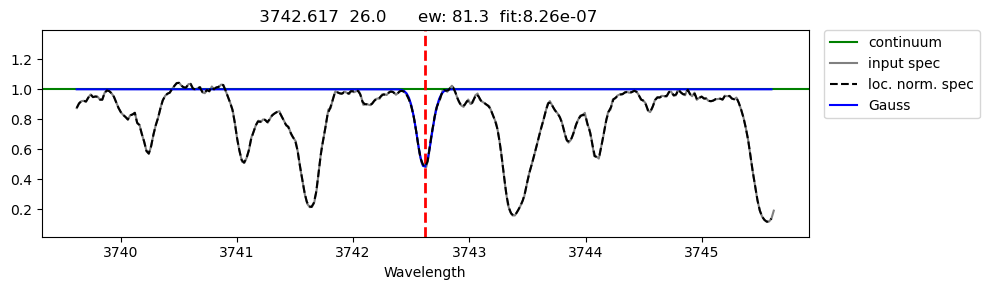

########################################
Writing to output file...

Moog entry:
   3742.617      26.0     2.938     -0.81                         81.34 8.261e-07 


#####
 3787.88 26.0
line 3787.88  was detected and it was classified as a strong line
I see 22 line(s) in this range
          Gauss : EW = 170.81 fq = 0.000006 o-c: 0.021305
using an EW from Gauss
Line is too strong or too weak


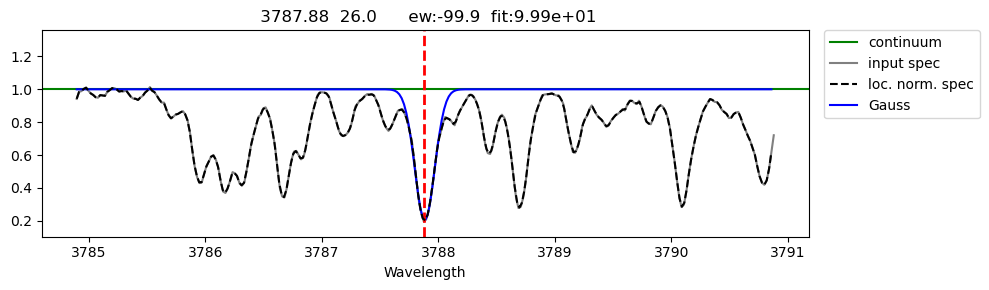

########################################
Writing to output file...

Moog entry:
    3787.88      26.0     1.011    -0.859                        -99.90 9.990e+01 


#####
 3808.729 26.0
line 3808.729  was detected and it was classified as a strong line
I see 32 line(s) in this range
          Gauss : EW = 80.84 fq = 0.000000 o-c: 0.013907
using an EW from Gauss


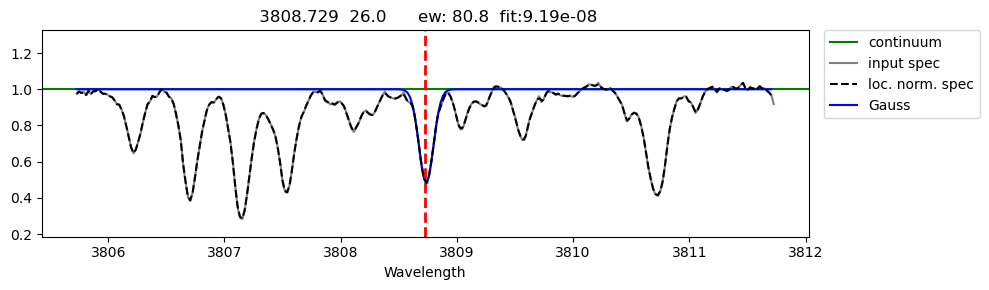

########################################
Writing to output file...

Moog entry:
   3808.729      26.0     2.557     -1.16                         80.84 9.194e-08 


#####
 3949.953 26.0
line 3949.953  was detected and it was classified as a strong line
I see 19 line(s) in this range
          Gauss : EW = 89.69 fq = 0.000000 o-c: 0.010786
using an EW from Gauss


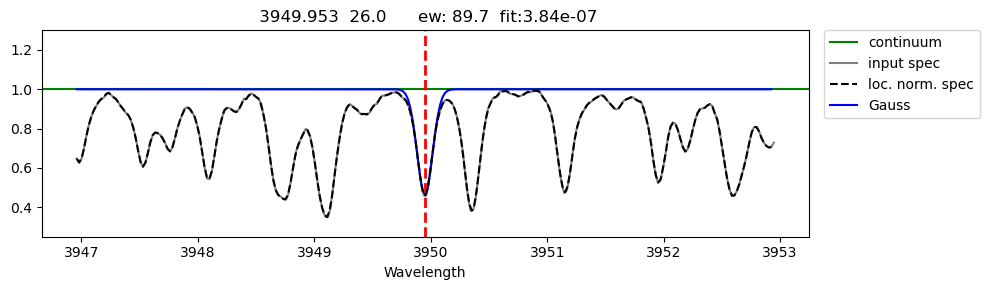

########################################
Writing to output file...

Moog entry:
   3949.953      26.0     2.174     -1.25                         89.69 3.838e-07 


#####
 3977.741 26.0
line 3977.741  was detected and it was classified as a strong line
I see 9 line(s) in this range
          Gauss : EW = 107.94 fq = 0.000001 o-c: 0.010065
using an EW from Gauss


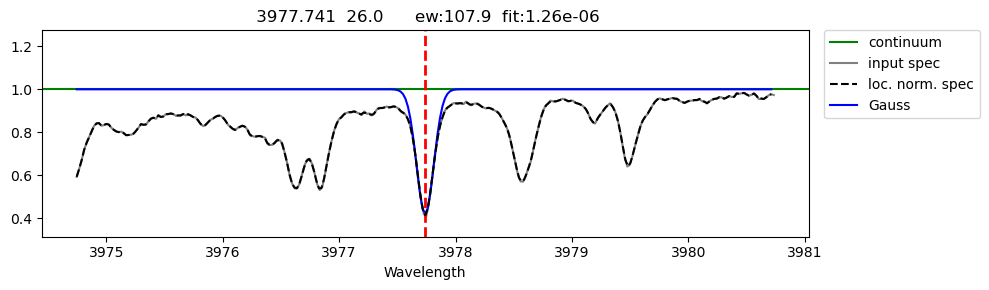

########################################
Writing to output file...

Moog entry:
   3977.741      26.0     2.196     -1.12                        107.94 1.262e-06 


#####
 4058.217 26.0
line 4058.217  was detected and it was classified as a strong line
I see 19 line(s) in this range
          Gauss : EW = 37.21 fq = 0.000000 o-c: 0.006063
using an EW from Gauss


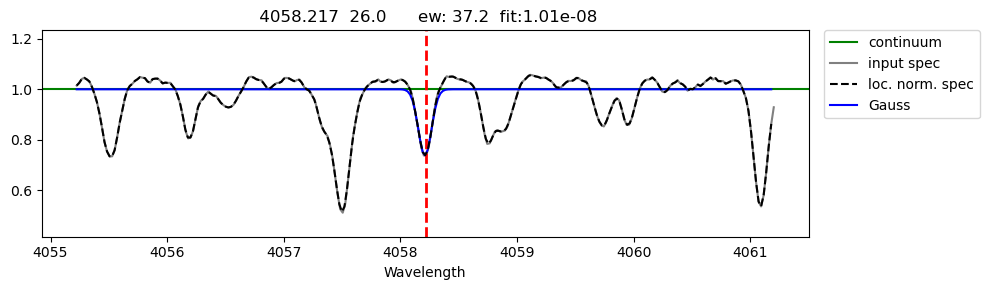

########################################
Writing to output file...

Moog entry:
   4058.217      26.0     3.209     -1.18                         37.21 1.006e-08 


#####
 4062.441 26.0
line 4062.441  was detected and it was classified as a strong line
I see 18 line(s) in this range
          Gauss : EW = 69.95 fq = 0.000017 o-c: 0.017346
using an EW from Gauss


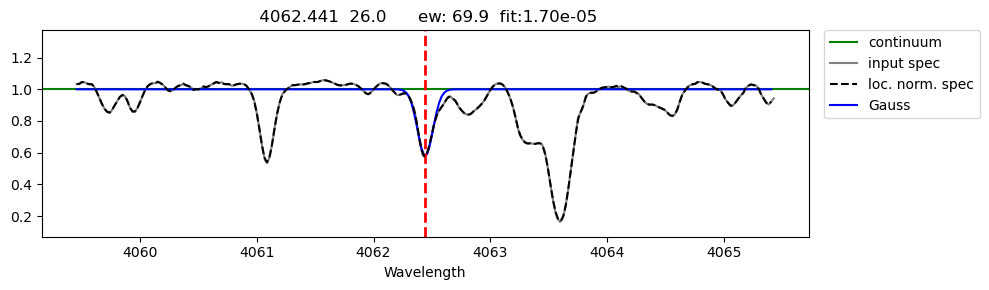

########################################
Writing to output file...

Moog entry:
   4062.441      26.0     2.845    -0.862                         69.95 1.696e-05 


#####
 4067.978 26.0
line 4067.978  was detected and it was classified as a strong line
I see 18 line(s) in this range
          Gauss : EW = 65.32 fq = 0.000000 o-c: 0.002344
using an EW from Gauss


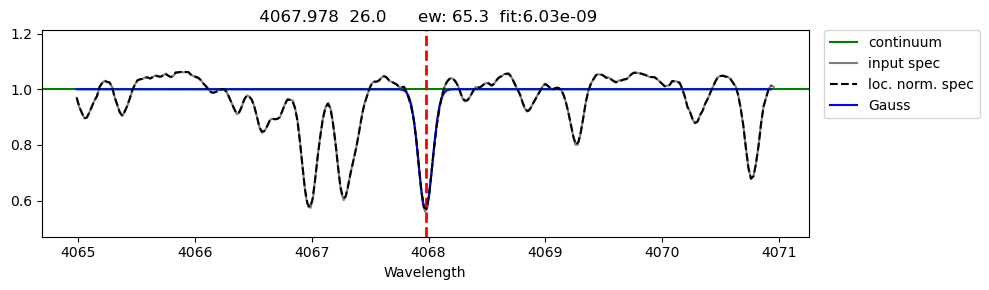

########################################
Writing to output file...

Moog entry:
   4067.978      26.0     3.209     -0.53                         65.32 6.028e-09 


#####
 4070.771 26.0
line 4070.771  was detected and it was classified as a strong line
I see 8 line(s) in this range
          Gauss : EW = 45.67 fq = 0.000000 o-c: 0.009598
using an EW from Gauss


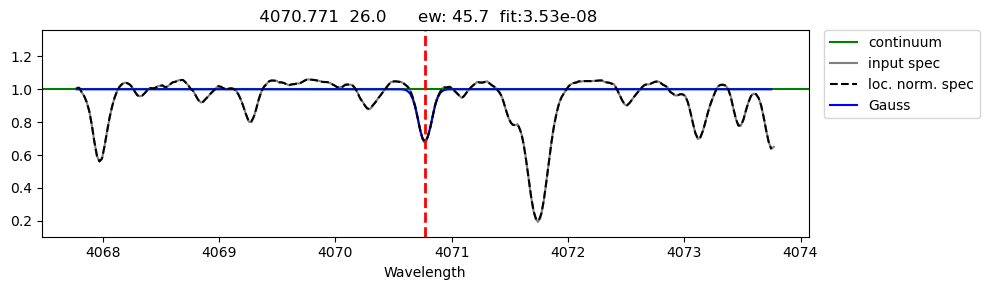

########################################
Writing to output file...

Moog entry:
   4070.771      26.0     3.239     -0.87                         45.67 3.531e-08 


#####
 4076.629 26.0
line 4076.629  was detected and it was classified as a strong line
I see 19 line(s) in this range
          Gauss : EW = 109.58 fq = 0.001544 o-c: 0.022660
using an EW from Gauss


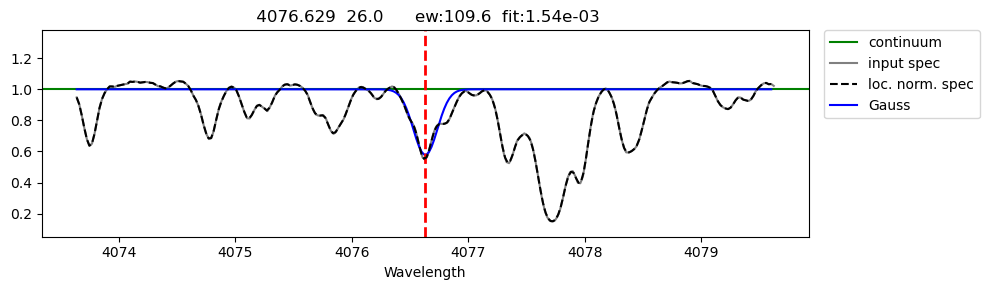

########################################
Writing to output file...

Moog entry:
   4076.629      26.0     3.211    -0.529                        109.58 1.544e-03 


#####
 4107.488 26.0
line 4107.488  was detected and it was classified as a strong line
I see 11 line(s) in this range
          Gauss : EW = 105.41 fq = 0.000003 o-c: 0.005676
using an EW from Gauss


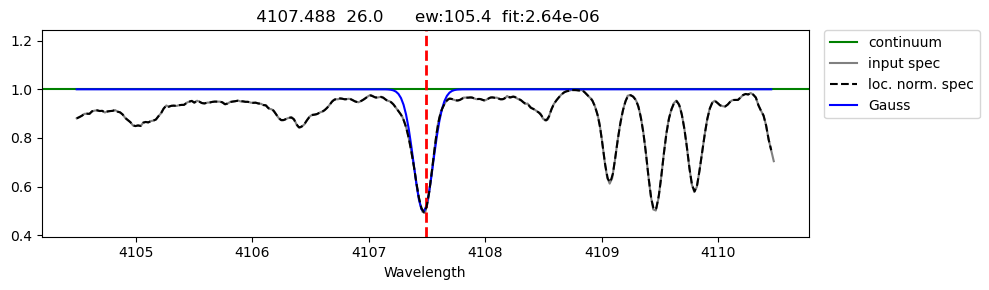

########################################
Writing to output file...

Moog entry:
   4107.488      26.0     2.832    -0.879                        105.41 2.640e-06 


#####
 4114.445 26.0
line 4114.445  was detected and it was classified as a strong line
I see 13 line(s) in this range
          Gauss : EW = 43.80 fq = 0.000000 o-c: 0.000304
using an EW from Gauss


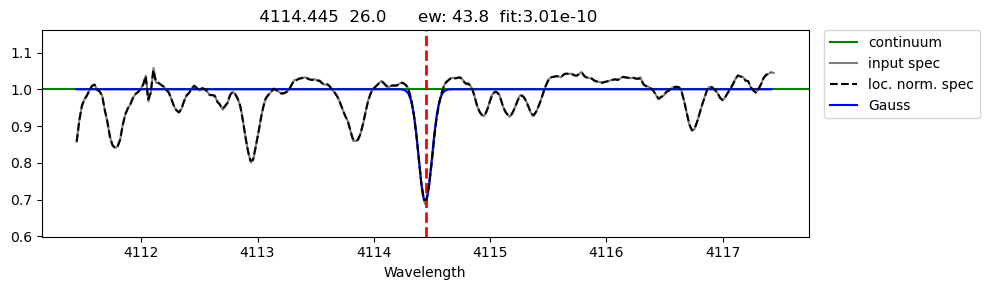

########################################
Writing to output file...

Moog entry:
   4114.445      26.0     2.832    -1.303                         43.80 3.010e-10 


#####
 4132.899 26.0
line 4132.899  was detected and it was classified as a strong line
I see 15 line(s) in this range
          Gauss : EW = 60.28 fq = 0.000000 o-c: 0.004758
using an EW from Gauss


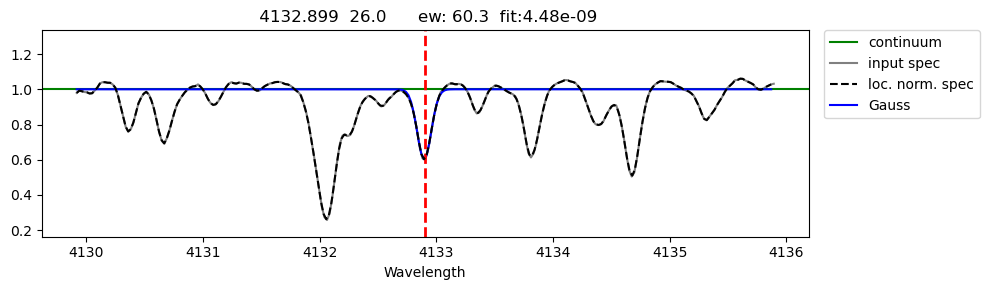

########################################
Writing to output file...

Moog entry:
   4132.899      26.0     2.845    -1.006                         60.28 4.483e-09 


#####
 4134.677 26.0
line 4134.677  was detected and it was classified as a strong line
I see 13 line(s) in this range
          Gauss : EW = 80.30 fq = 0.000002 o-c: 0.020202
using an EW from Gauss


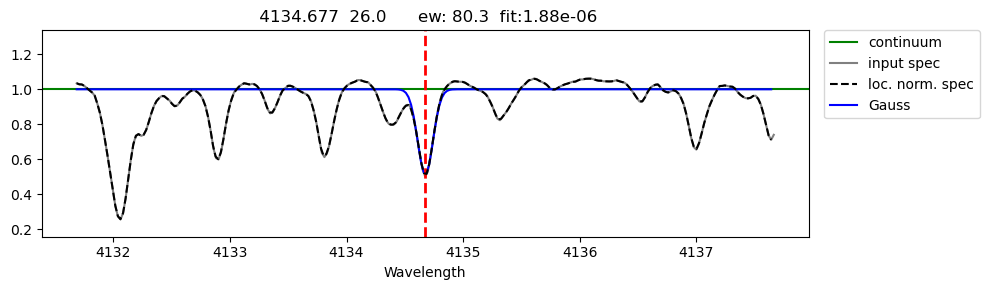

########################################
Writing to output file...

Moog entry:
   4134.677      26.0     2.832    -0.649                         80.30 1.884e-06 


#####
 4136.998 26.0
line 4136.998  was detected and it was classified as a strong line
I see 14 line(s) in this range
          Gauss : EW = 54.82 fq = 0.000000 o-c: 0.003711
using an EW from Gauss


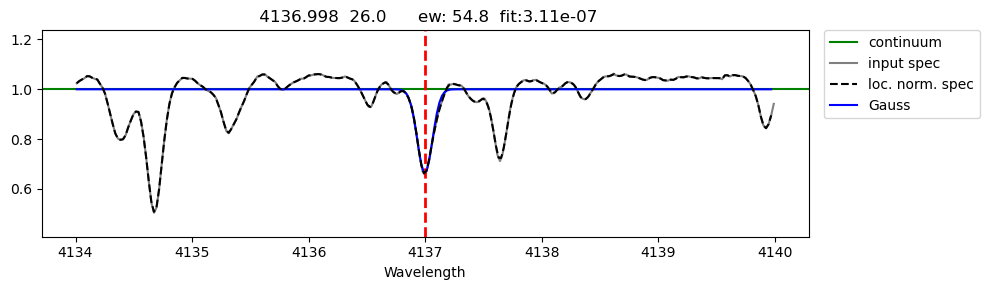

########################################
Writing to output file...

Moog entry:
   4136.998      26.0     3.415    -0.453                         54.82 3.110e-07 


#####
 4147.668 26.0
line 4147.668  was detected and it was classified as a strong line
I see 13 line(s) in this range
          Gauss : EW = 79.21 fq = 0.000000 o-c: 0.001632
using an EW from Gauss


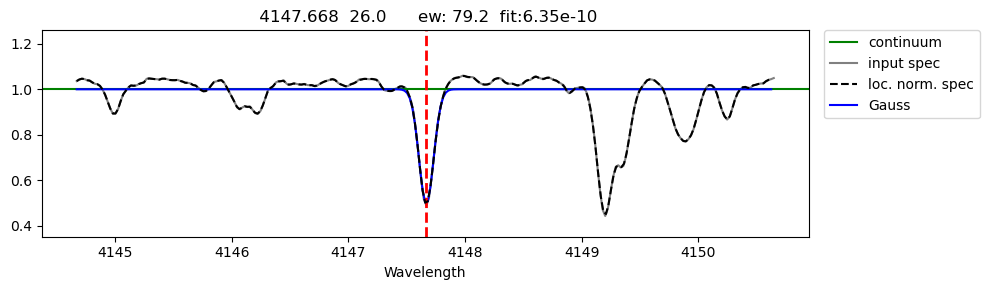

########################################
Writing to output file...

Moog entry:
   4147.668      26.0     1.485    -2.104                         79.21 6.353e-10 


#####
 4150.249 26.0
line 4150.249  was detected and it was classified as a strong line
I see 11 line(s) in this range
          Gauss : EW = 16.09 fq = 0.000000 o-c: 0.006950
using an EW from Gauss
Line is too strong or too weak


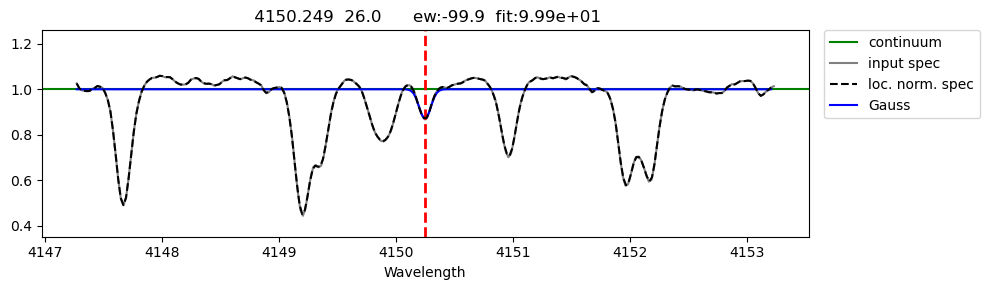

########################################
Writing to output file...

Moog entry:
   4150.249      26.0     3.428     -1.19                        -99.90 9.990e+01 


#####
 4153.899 26.0
line 4153.899  was detected and it was classified as a strong line
I see 13 line(s) in this range
          Gauss : EW = 72.06 fq = 0.000001 o-c: 0.014184
using an EW from Gauss


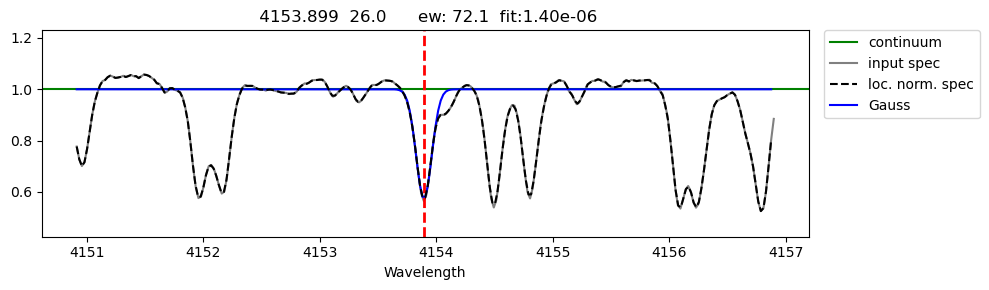

########################################
Writing to output file...

Moog entry:
   4153.899      26.0     3.397    -0.321                         72.06 1.402e-06 


#####
 4154.499 26.0
line 4154.499  was detected and it was classified as a strong line
I see 14 line(s) in this range
          Gauss : EW = 71.66 fq = 0.000000 o-c: 0.006442
using an EW from Gauss


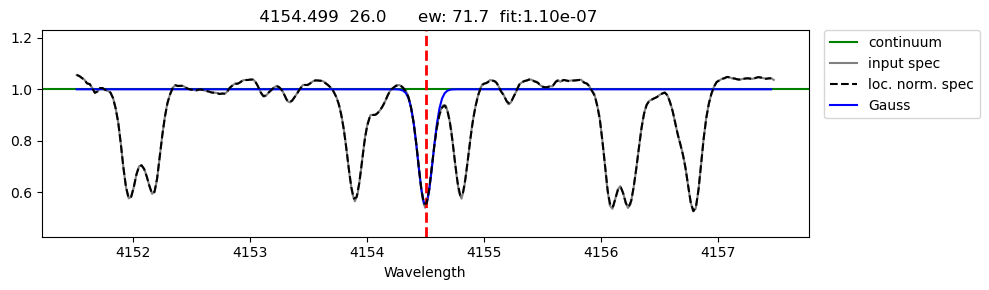

########################################
Writing to output file...

Moog entry:
   4154.499      26.0     2.832    -0.688                         71.66 1.096e-07 


#####
 4154.805 26.0
line 4154.805  was detected and it was classified as a strong line
I see 8 line(s) in this range
          Gauss : EW = 64.89 fq = 0.000000 o-c: 0.014755
using an EW from Gauss


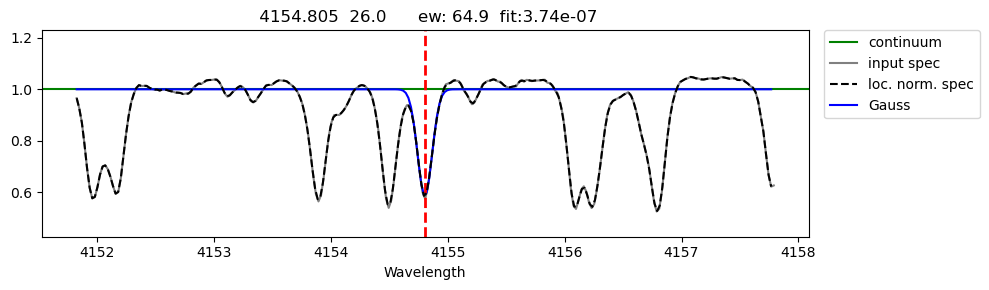

########################################
Writing to output file...

Moog entry:
   4154.805      26.0     3.368      -0.4                         64.89 3.744e-07 


#####
 4157.78 26.0
line 4157.78  was detected and it was classified as a strong line
I see 7 line(s) in this range
          Gauss : EW = 57.43 fq = 0.000000 o-c: 0.003787
using an EW from Gauss


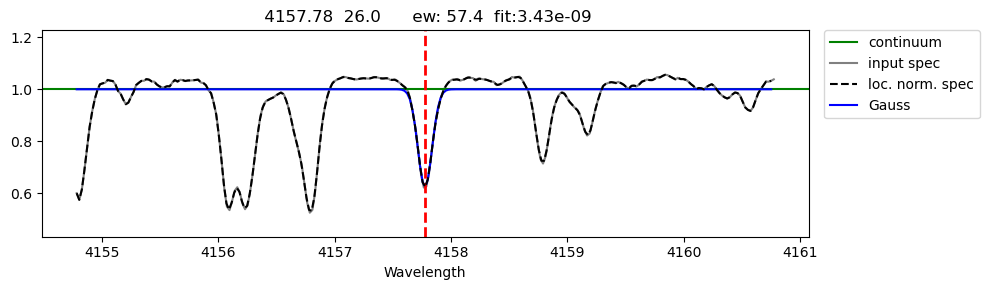

########################################
Writing to output file...

Moog entry:
    4157.78      26.0     3.417    -0.403                         57.43 3.426e-09 


#####
 4158.792 26.0
line 4158.792  was detected and it was classified as a strong line
I see 12 line(s) in this range
          Gauss : EW = 39.56 fq = 0.000000 o-c: 0.008284
using an EW from Gauss


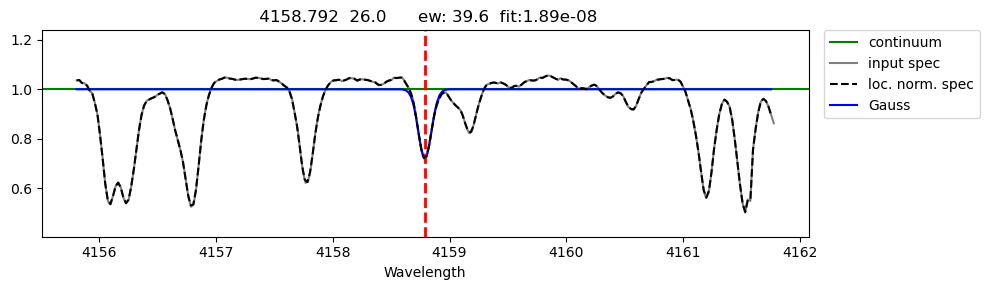

########################################
Writing to output file...

Moog entry:
   4158.792      26.0     3.428      -0.7                         39.56 1.886e-08 


#####
 4174.913 26.0
line 4174.913  was detected and it was classified as a strong line
I see 9 line(s) in this range
          Gauss : EW = 66.51 fq = 0.000000 o-c: 0.006623
using an EW from Gauss


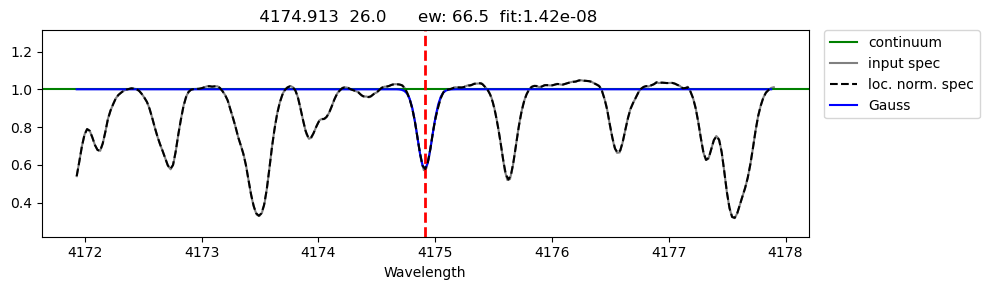

########################################
Writing to output file...

Moog entry:
   4174.913      26.0     0.915    -2.969                         66.51 1.417e-08 


#####
 4175.636 26.0
line 4175.636  was detected and it was classified as a strong line
I see 11 line(s) in this range
          Gauss : EW = 79.24 fq = 0.000000 o-c: 0.004240
using an EW from Gauss


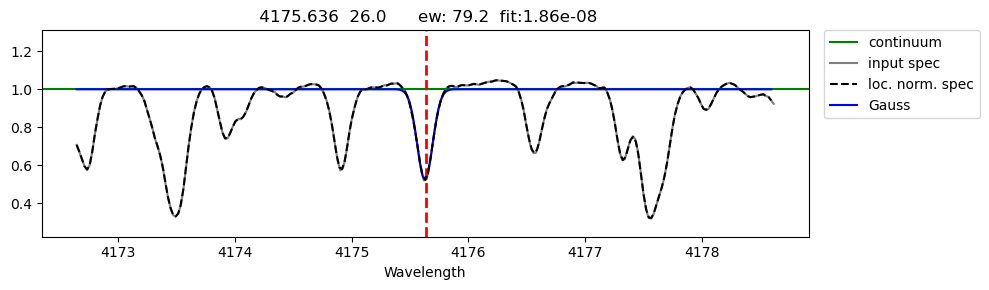

########################################
Writing to output file...

Moog entry:
   4175.636      26.0     2.845    -0.827                         79.24 1.855e-08 


#####
 4176.566 26.0
line 4176.566  was detected and it was classified as a strong line
I see 11 line(s) in this range
          Gauss : EW = 55.63 fq = 0.000000 o-c: 0.011714
using an EW from Gauss


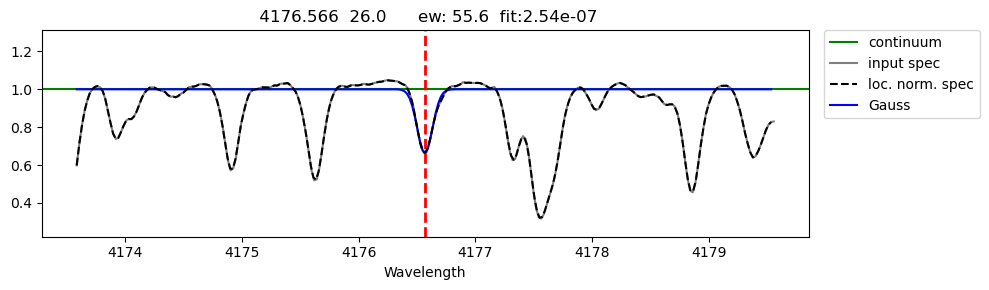

########################################
Writing to output file...

Moog entry:
   4176.566      26.0     3.368    -0.805                         55.63 2.541e-07 


#####
 4181.754 26.0
line 4181.754  was detected and it was classified as a strong line
I see 14 line(s) in this range
          Gauss : EW = 95.28 fq = 0.000001 o-c: 0.008217
using an EW from Gauss


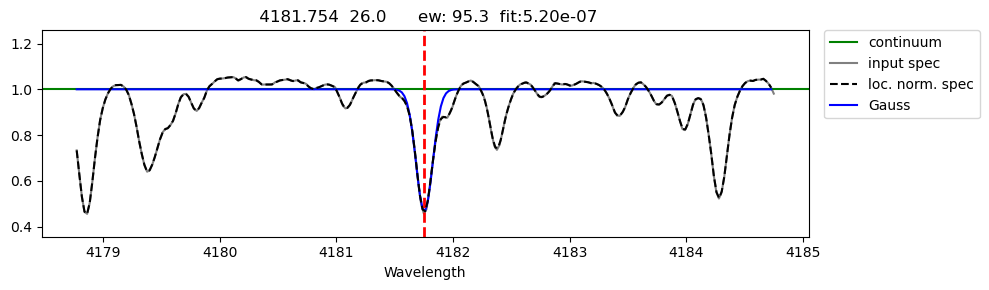

########################################
Writing to output file...

Moog entry:
   4181.754      26.0     2.832    -0.371                         95.28 5.204e-07 


#####
 4182.382 26.0
line 4182.382  was detected and it was classified as a strong line
I see 12 line(s) in this range
          Gauss : EW = 38.58 fq = 0.000000 o-c: 0.003854
using an EW from Gauss


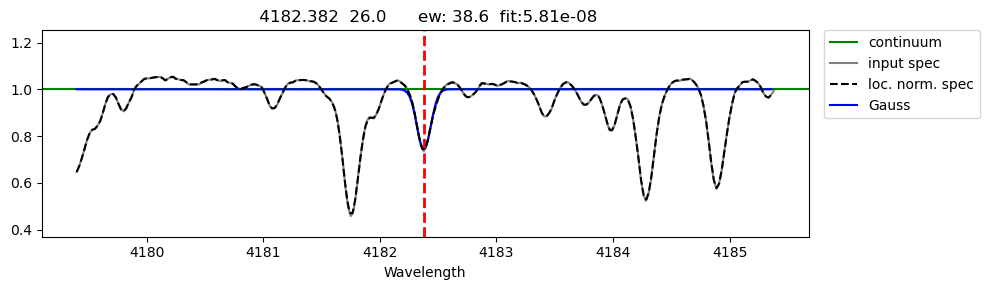

########################################
Writing to output file...

Moog entry:
   4182.382      26.0     3.017     -1.18                         38.58 5.814e-08 


#####
 4184.892 26.0
line 4184.892  was detected and it was classified as a strong line
I see 11 line(s) in this range
          Gauss : EW = 68.50 fq = 0.000000 o-c: 0.006026
using an EW from Gauss


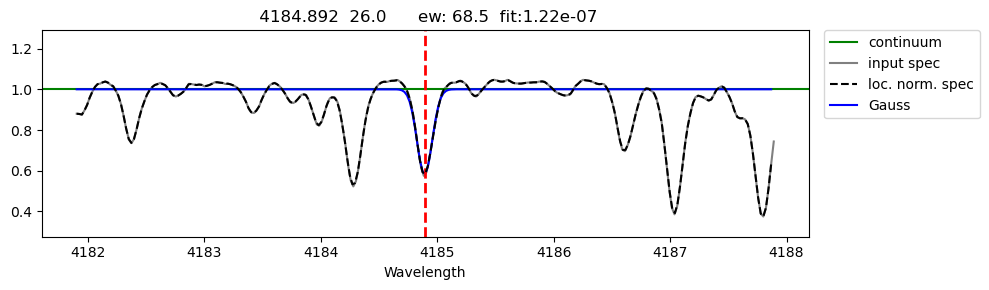

########################################
Writing to output file...

Moog entry:
   4184.892      26.0     2.832    -0.869                         68.50 1.225e-07 


#####
 4187.039 26.0
line 4187.039  was detected and it was classified as a strong line
I see 15 line(s) in this range
          Gauss : EW = 105.68 fq = 0.000000 o-c: 0.006402
using an EW from Gauss


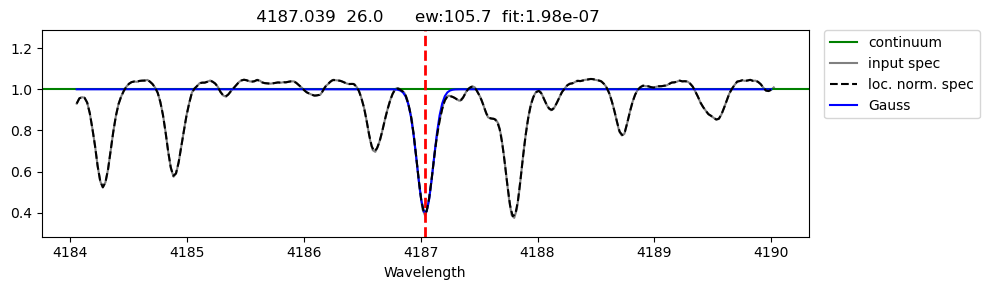

########################################
Writing to output file...

Moog entry:
   4187.039      26.0      2.45    -0.548                        105.68 1.984e-07 


#####
 4187.795 26.0
line 4187.795  was detected and it was classified as a strong line
I see 14 line(s) in this range
          Gauss : EW = 113.42 fq = 0.000007 o-c: 0.025215
using an EW from Gauss


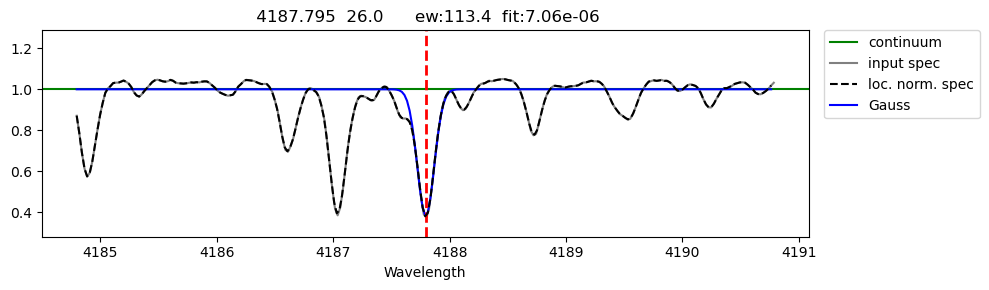

########################################
Writing to output file...

Moog entry:
   4187.795      26.0     2.425    -0.554                        113.42 7.060e-06 


#####
 4191.43 26.0
line 4191.43  was detected and it was classified as a strong line
I see 21 line(s) in this range
          Gauss : EW = 104.63 fq = 0.000000 o-c: 0.002993
using an EW from Gauss


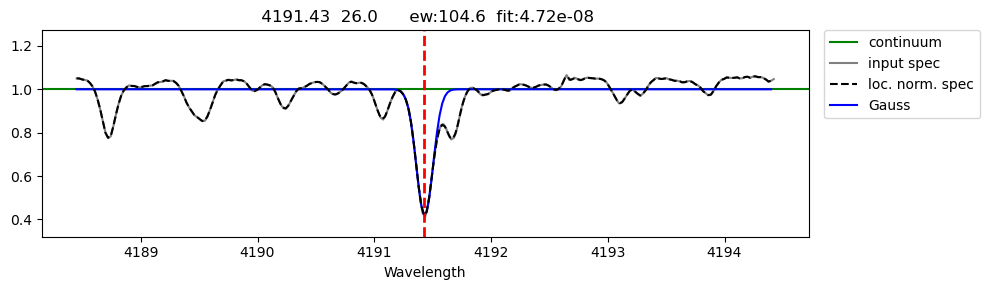

########################################
Writing to output file...

Moog entry:
    4191.43      26.0     2.469    -0.666                        104.63 4.718e-08 


#####
 4195.329 26.0
line 4195.329  was detected and it was classified as a strong line
I see 4 line(s) in this range
          Gauss : EW = 62.49 fq = 0.000000 o-c: 0.003133
using an EW from Gauss


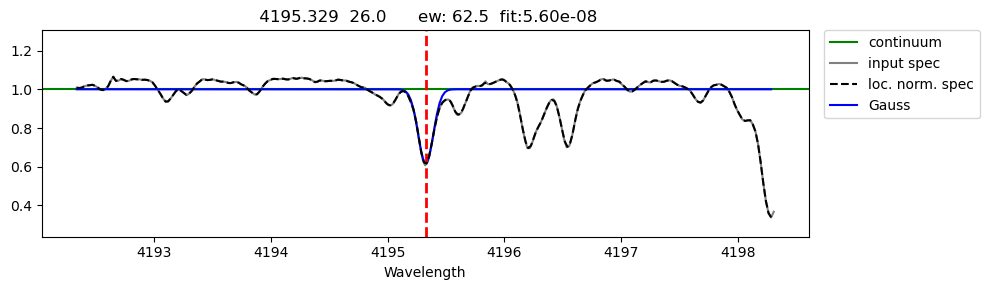

########################################
Writing to output file...

Moog entry:
   4195.329      26.0     3.332    -0.492                         62.49 5.597e-08 


#####
 4213.647 26.0
line 4213.647  was detected and it was classified as a strong line
I see 12 line(s) in this range
          Gauss : EW = 35.90 fq = 0.000000 o-c: 0.012476
using an EW from Gauss


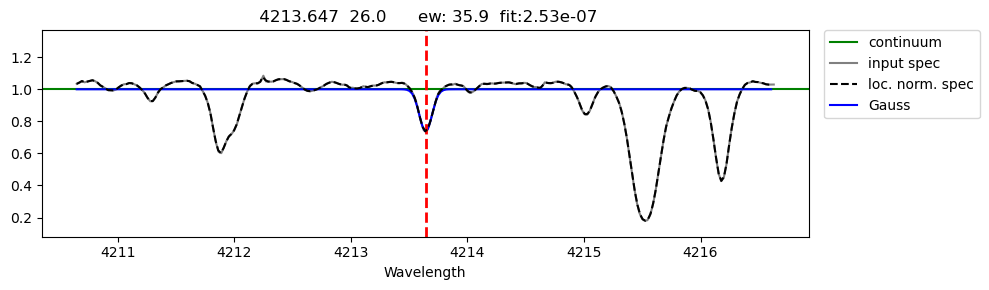

########################################
Writing to output file...

Moog entry:
   4213.647      26.0     2.845     -1.29                         35.90 2.530e-07 


#####
 4216.184 26.0
line 4216.184  was detected and it was classified as a strong line
I see 13 line(s) in this range
          Gauss : EW = 92.86 fq = 0.000000 o-c: 0.004026
using an EW from Gauss


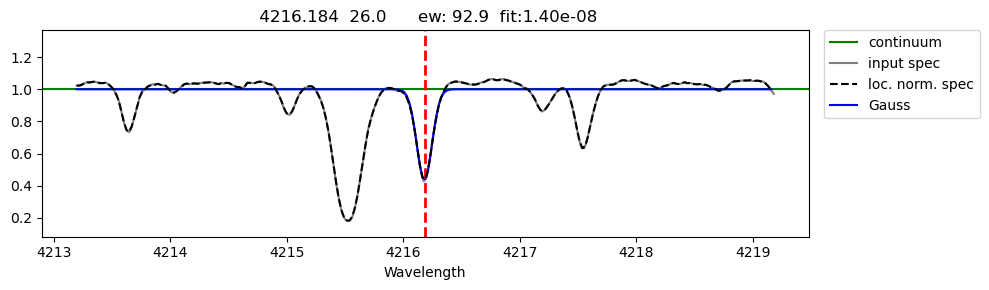

########################################
Writing to output file...

Moog entry:
   4216.184      26.0       0.0    -3.356                         92.86 1.401e-08 


#####
 4217.545 26.0
line 4217.545  was detected and it was classified as a strong line
I see 14 line(s) in this range
          Gauss : EW = 56.39 fq = 0.000000 o-c: 0.005584
using an EW from Gauss


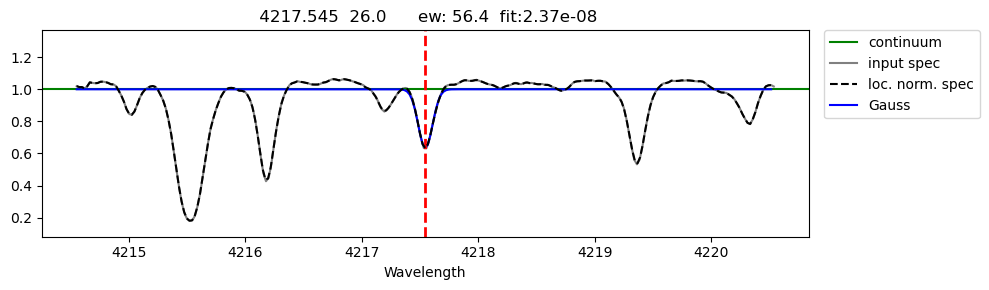

########################################
Writing to output file...

Moog entry:
   4217.545      26.0      3.43    -0.484                         56.39 2.367e-08 


#####
 4222.213 26.0
line 4222.213  was detected and it was classified as a strong line
I see 10 line(s) in this range
          Gauss : EW = 83.21 fq = 0.000000 o-c: 0.001179
using an EW from Gauss


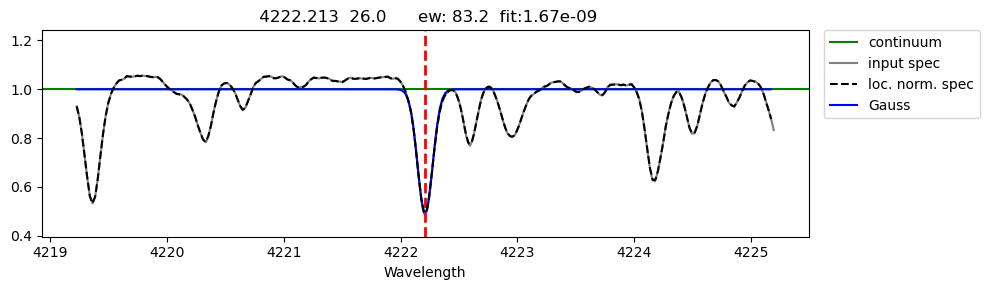

########################################
Writing to output file...

Moog entry:
   4222.213      26.0      2.45    -0.967                         83.21 1.675e-09 


#####
 4227.426 26.0
line 4227.426  was detected and it was classified as a strong line
I see 17 line(s) in this range
          Gauss : EW = 135.77 fq = 0.000008 o-c: 0.010671
using an EW from Gauss


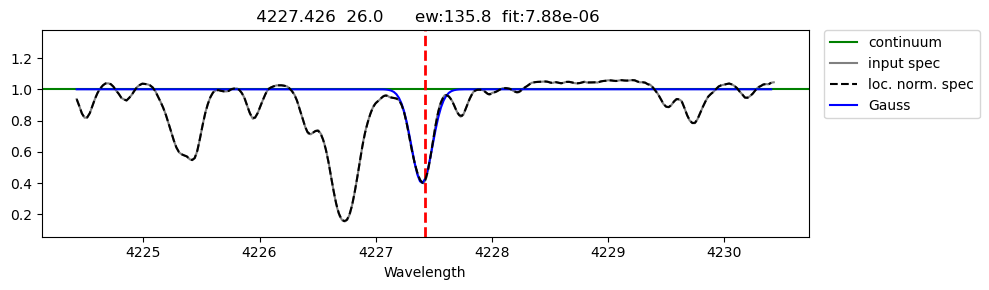

########################################
Writing to output file...

Moog entry:
   4227.426      26.0     3.332     0.266                        135.77 7.876e-06 


#####
 4233.603 26.0
line 4233.603  was detected and it was classified as a strong line
I see 9 line(s) in this range
          Gauss : EW = 99.68 fq = 0.000000 o-c: 0.001081
using an EW from Gauss


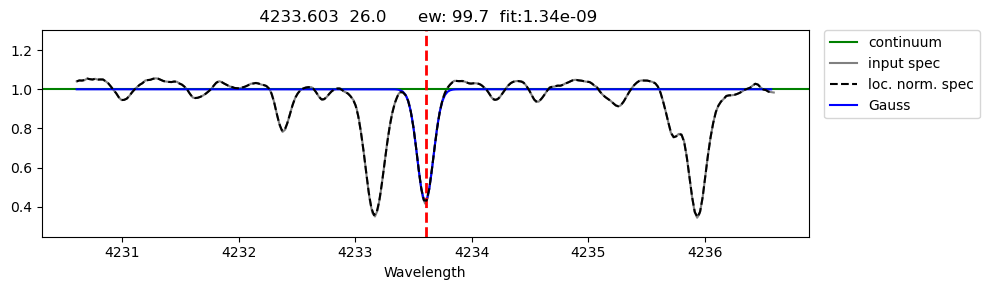

########################################
Writing to output file...

Moog entry:
   4233.603      26.0     2.482    -0.604                         99.68 1.342e-09 


#####
 4238.81 26.0
line 4238.81  was detected and it was classified as a strong line
I see 10 line(s) in this range
          Gauss : EW = 71.03 fq = 0.000000 o-c: 0.002448
using an EW from Gauss


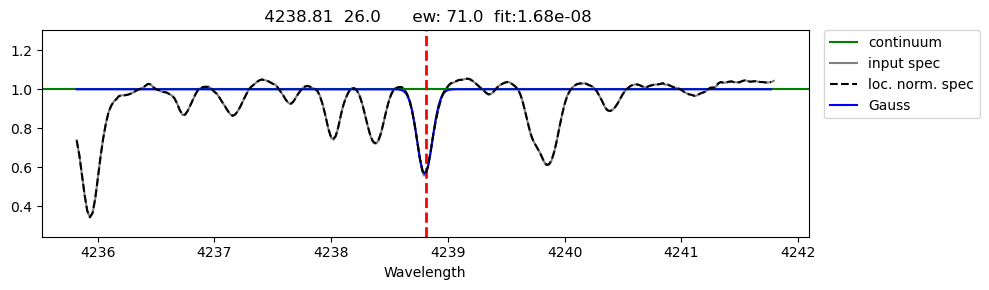

########################################
Writing to output file...

Moog entry:
    4238.81      26.0     3.397    -0.233                         71.03 1.678e-08 


#####
 4250.119 26.0
line 4250.119  was detected and it was classified as a strong line
I see 17 line(s) in this range
          Gauss : EW = 114.71 fq = 0.000000 o-c: 0.004566
using an EW from Gauss


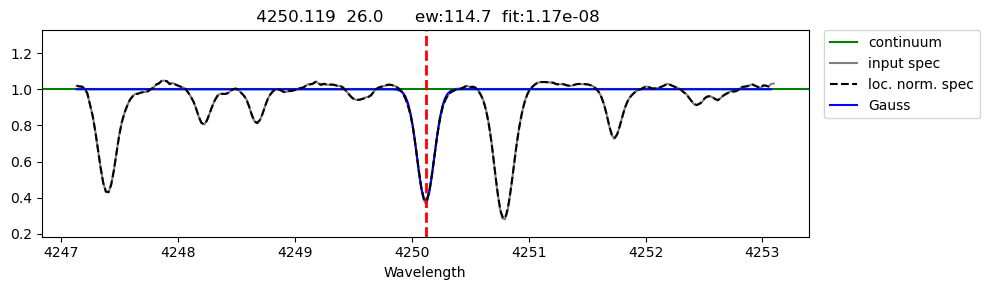

########################################
Writing to output file...

Moog entry:
   4250.119      26.0     2.469    -0.405                        114.71 1.174e-08 


#####
 4271.153 26.0
line 4271.153  was detected and it was classified as a strong line
I see 13 line(s) in this range
          Gauss : EW = 118.90 fq = 0.000000 o-c: 0.005095
using an EW from Gauss


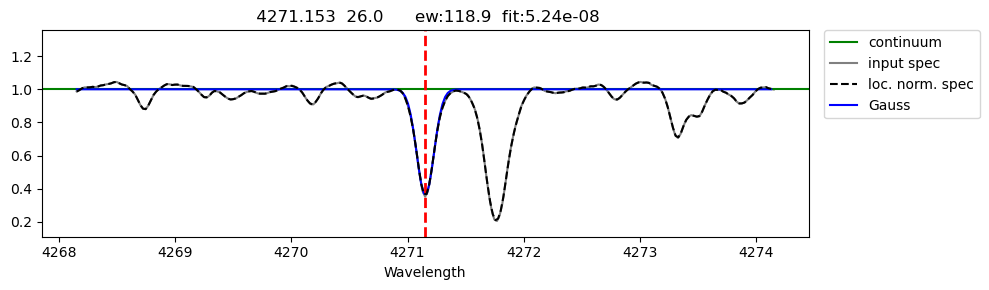

########################################
Writing to output file...

Moog entry:
   4271.153      26.0      2.45    -0.349                        118.90 5.240e-08 


#####
 4282.403 26.0
line 4282.403  was detected and it was classified as a strong line
I see 10 line(s) in this range
          Gauss : EW = 112.16 fq = 0.000000 o-c: 0.004970
using an EW from Gauss


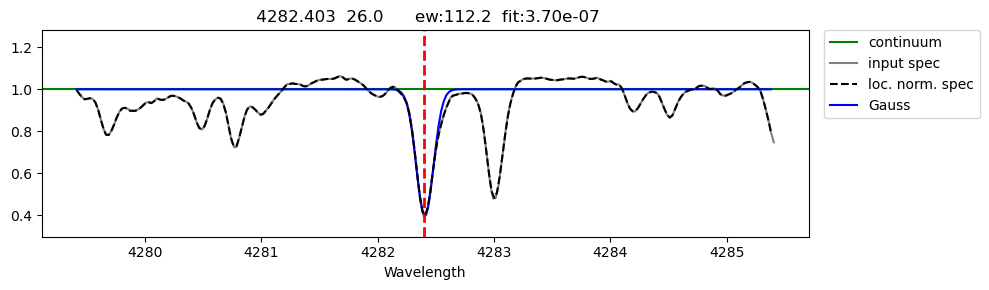

########################################
Writing to output file...

Moog entry:
   4282.403      26.0     2.176    -0.779                        112.16 3.701e-07 


#####
 4337.045 26.0
line 4337.045  was detected and it was classified as a strong line
I see 5 line(s) in this range
          Gauss : EW = 112.36 fq = 0.000002 o-c: 0.010264
using an EW from Gauss


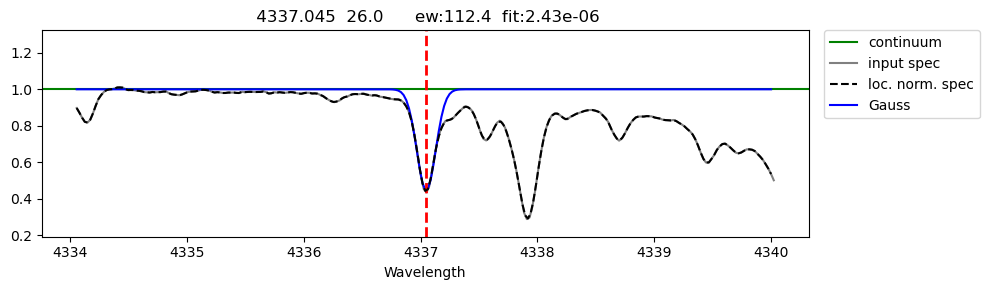

########################################
Writing to output file...

Moog entry:
   4337.045      26.0     1.557    -1.695                        112.36 2.433e-06 


#####
 4352.735 26.0
line 4352.735  was detected and it was classified as a strong line
I see 15 line(s) in this range
          Gauss : EW = 83.04 fq = 0.000000 o-c: 0.004192
using an EW from Gauss


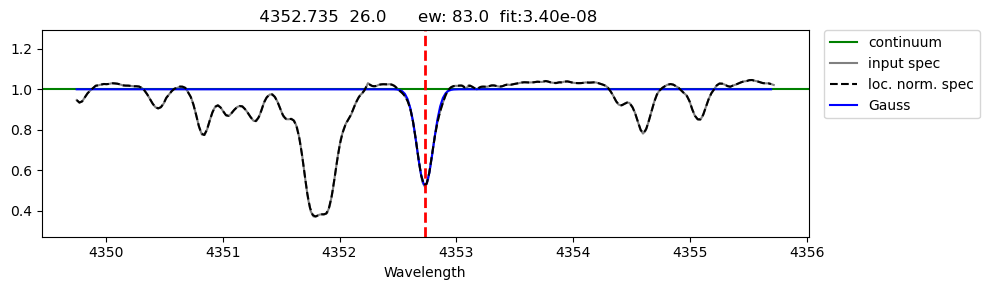

########################################
Writing to output file...

Moog entry:
   4352.735      26.0     2.223    -1.287                         83.04 3.402e-08 


#####
 4375.93 26.0
line 4375.93  was detected and it was classified as a strong line
I see 12 line(s) in this range
          Gauss : EW = 108.16 fq = 0.000000 o-c: 0.005116
using an EW from Gauss


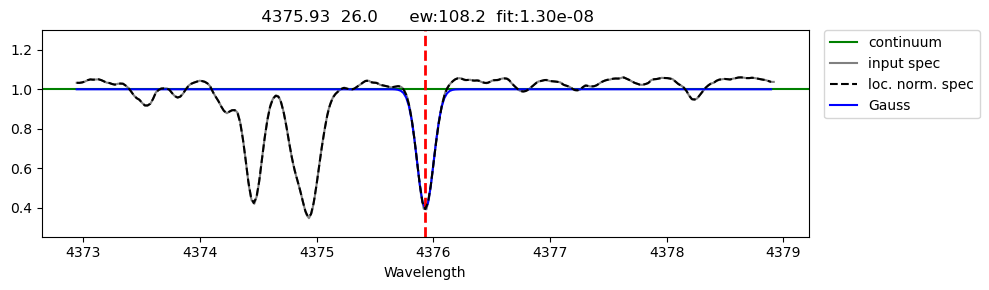

########################################
Writing to output file...

Moog entry:
    4375.93      26.0       0.0    -3.031                        108.16 1.297e-08 


#####
 4388.407 26.0
line 4388.407  was detected and it was classified as a strong line
I see 4 line(s) in this range
          Gauss : EW = 35.50 fq = 0.000000 o-c: 0.004389
using an EW from Gauss


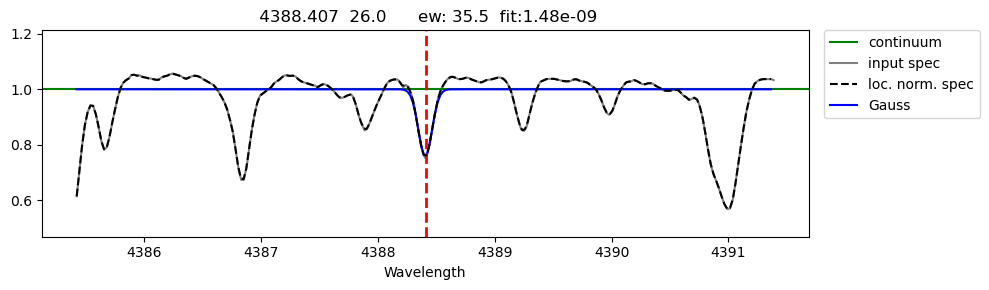

########################################
Writing to output file...

Moog entry:
   4388.407      26.0     3.603    -0.682                         35.50 1.476e-09 


#####
 4427.31 26.0
line 4427.31  was detected and it was classified as a strong line
I see 7 line(s) in this range
          Gauss : EW = 111.29 fq = 0.000001 o-c: 0.013433
using an EW from Gauss


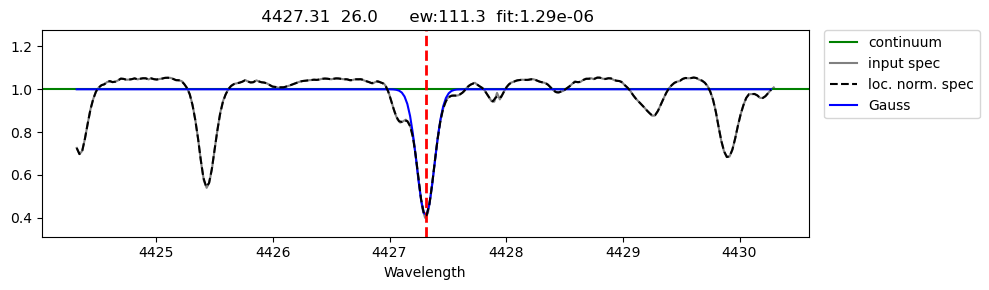

########################################
Writing to output file...

Moog entry:
    4427.31      26.0     0.052    -2.924                        111.29 1.290e-06 


#####
 4430.614 26.0
line 4430.614  was detected and it was classified as a strong line
I see 15 line(s) in this range
          Gauss : EW = 59.36 fq = 0.000000 o-c: 0.000661
using an EW from Gauss


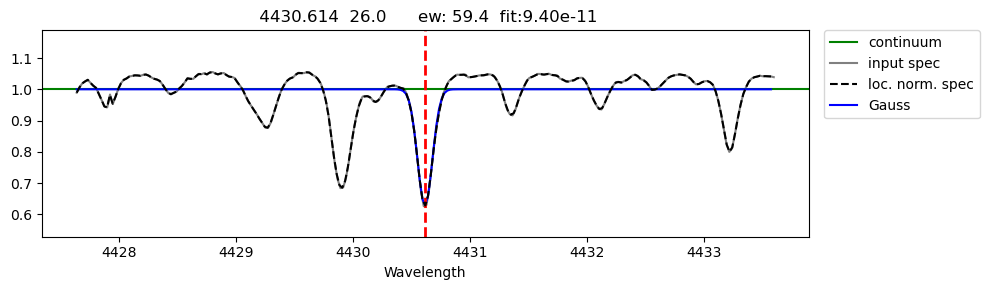

########################################
Writing to output file...

Moog entry:
   4430.614      26.0     2.223    -1.659                         59.36 9.400e-11 


#####
 4442.339 26.0
line 4442.339  was detected and it was classified as a strong line
I see 11 line(s) in this range
          Gauss : EW = 87.08 fq = 0.000001 o-c: 0.009648
using an EW from Gauss


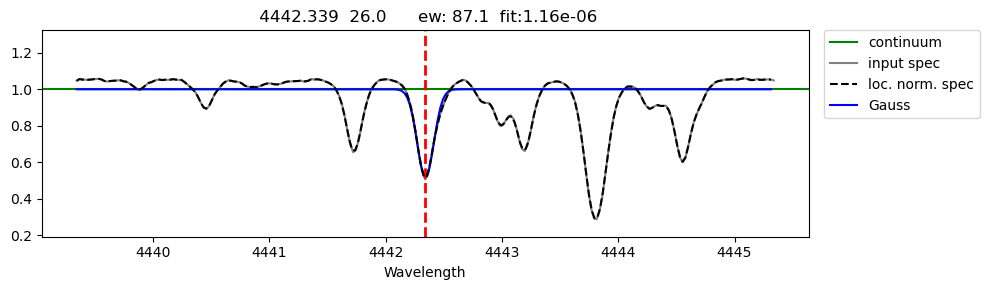

########################################
Writing to output file...

Moog entry:
   4442.339      26.0     2.198    -1.255                         87.08 1.163e-06 


#####
 4443.194 26.0
line 4443.194  was detected and it was classified as a strong line
I see 10 line(s) in this range
          Gauss : EW = 77.90 fq = 0.009534 o-c: 0.027817
using an EW from Gauss


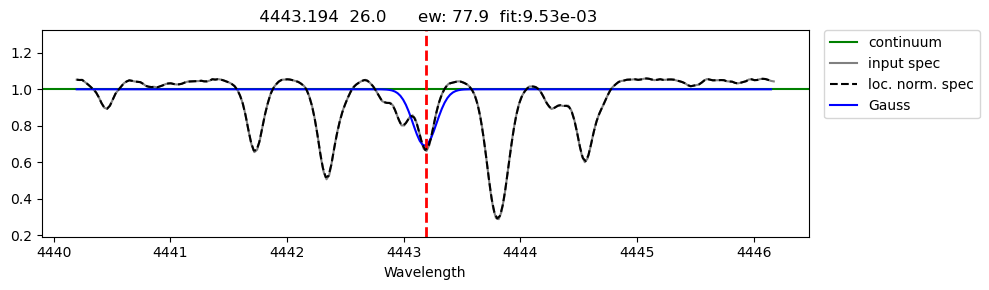

########################################
Writing to output file...

Moog entry:
   4443.194      26.0     2.858    -1.043                         77.90 9.534e-03 


#####
 4447.717 26.0
line 4447.717  was detected and it was classified as a strong line
I see 8 line(s) in this range
          Gauss : EW = 77.70 fq = 0.000000 o-c: 0.005120
using an EW from Gauss


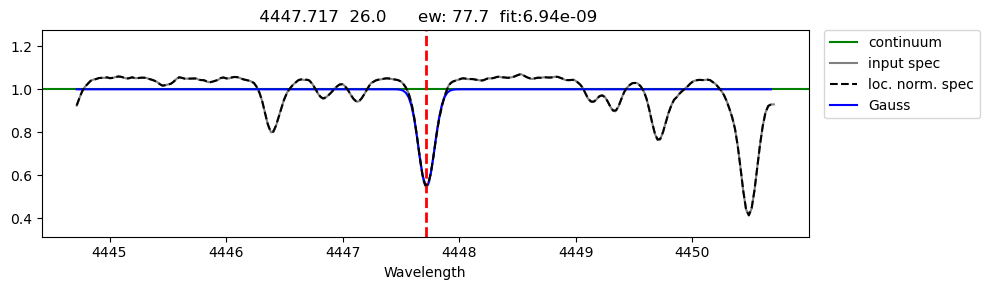

########################################
Writing to output file...

Moog entry:
   4447.717      26.0     2.221    -1.342                         77.70 6.938e-09 


#####
 4459.117 26.0
line 4459.117  was detected and it was classified as a strong line
I see 13 line(s) in this range
          Gauss : EW = 108.24 fq = 0.000000 o-c: 0.002110
using an EW from Gauss


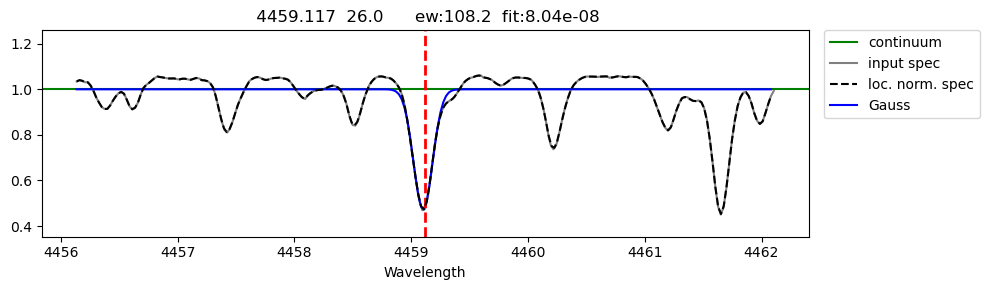

########################################
Writing to output file...

Moog entry:
   4459.117      26.0     2.176    -1.279                        108.24 8.044e-08 


#####
 4461.653 26.0
line 4461.653  was detected and it was classified as a strong line
I see 12 line(s) in this range
          Gauss : EW = 95.66 fq = 0.000000 o-c: 0.005736
using an EW from Gauss


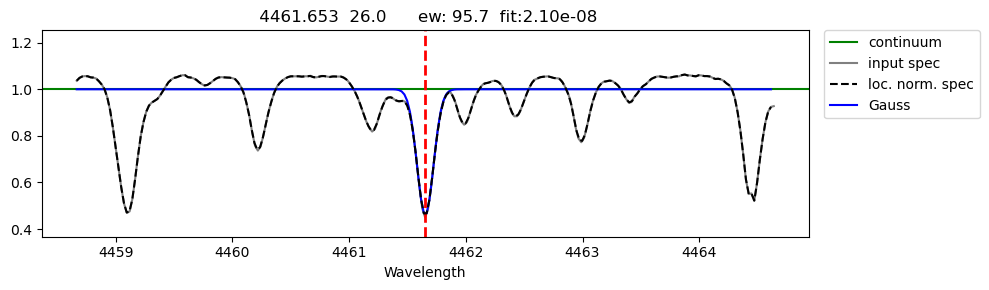

########################################
Writing to output file...

Moog entry:
   4461.653      26.0     0.087     -3.21                         95.66 2.098e-08 


#####
 4466.551 26.0
line 4466.551  was detected and it was classified as a strong line
I see 9 line(s) in this range
          Gauss : EW = 82.41 fq = 0.000000 o-c: 0.004973
using an EW from Gauss


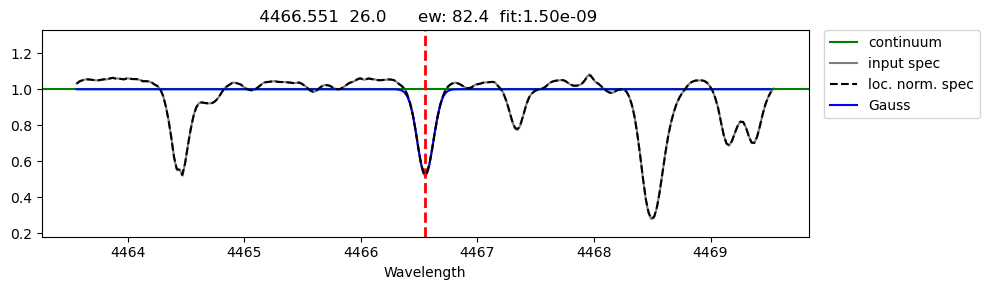

########################################
Writing to output file...

Moog entry:
   4466.551      26.0     2.832      -0.6                         82.41 1.505e-09 


#####
 4484.22 26.0
line 4484.22  was detected and it was classified as a strong line
I see 6 line(s) in this range
          Gauss : EW = 32.36 fq = 0.000000 o-c: 0.003388
using an EW from Gauss


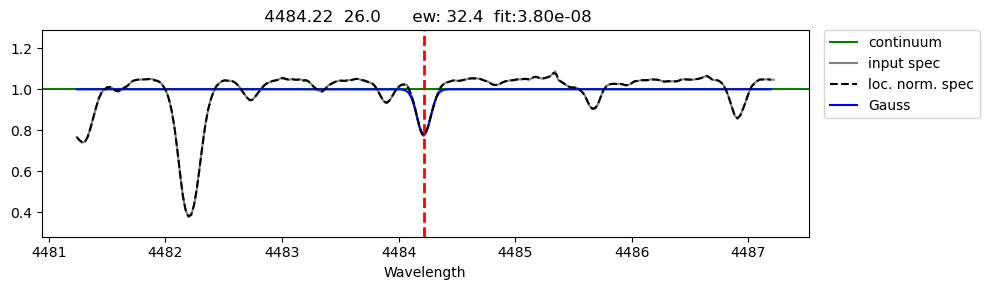

########################################
Writing to output file...

Moog entry:
    4484.22      26.0       3.6     -0.64                         32.36 3.805e-08 


#####
 4489.739 26.0
line 4489.739  was detected and it was classified as a strong line
I see 8 line(s) in this range
          Gauss : EW = 52.76 fq = 0.000000 o-c: 0.001859
using an EW from Gauss


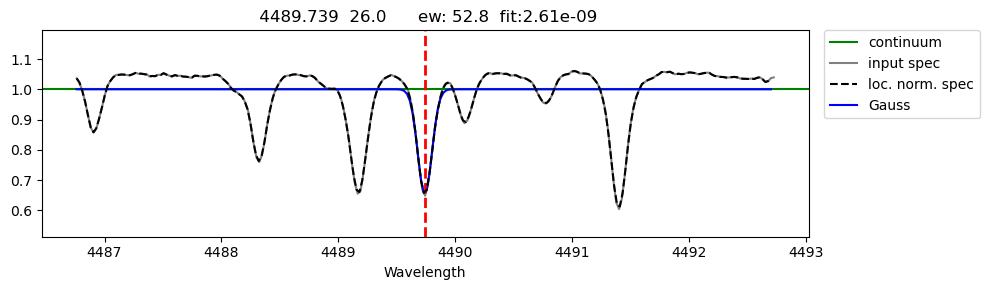

########################################
Writing to output file...

Moog entry:
   4489.739      26.0     0.121    -3.966                         52.76 2.615e-09 


#####
 4494.563 26.0
line 4494.563  was detected and it was classified as a strong line
I see 8 line(s) in this range
          Gauss : EW = 92.12 fq = 0.000000 o-c: 0.005750
using an EW from Gauss


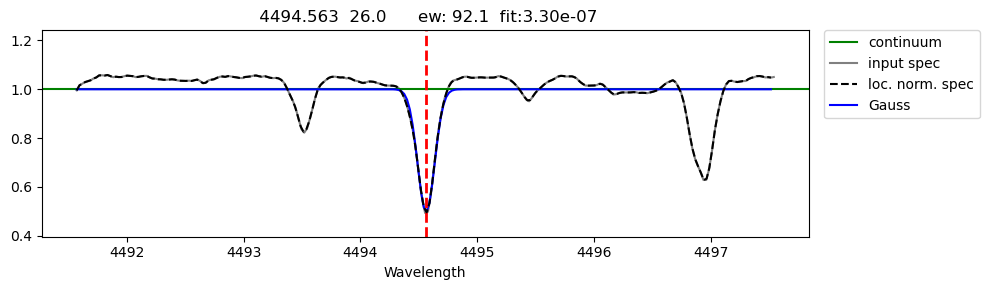

########################################
Writing to output file...

Moog entry:
   4494.563      26.0     2.198    -1.136                         92.12 3.296e-07 


#####
 4531.148 26.0
line 4531.148  was detected and it was classified as a strong line
I see 6 line(s) in this range
          Gauss : EW = 77.37 fq = 0.000000 o-c: 0.011492
using an EW from Gauss


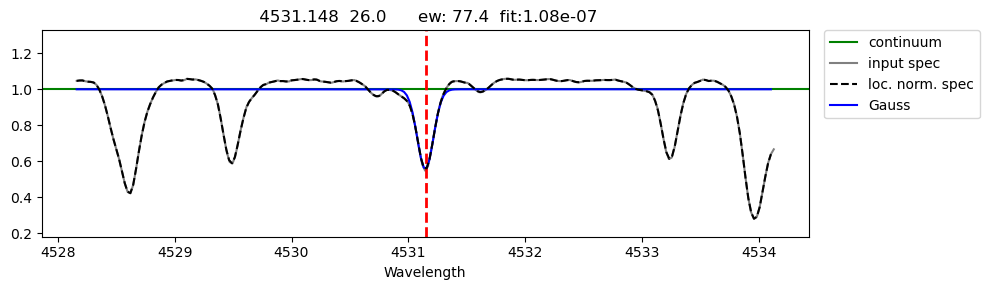

########################################
Writing to output file...

Moog entry:
   4531.148      26.0     1.485    -2.155                         77.37 1.084e-07 


#####
 4547.847 26.0
line 4547.847  was detected and it was classified as a strong line
I see 10 line(s) in this range
          Gauss : EW = 24.17 fq = 0.000002 o-c: 0.012947
using an EW from Gauss


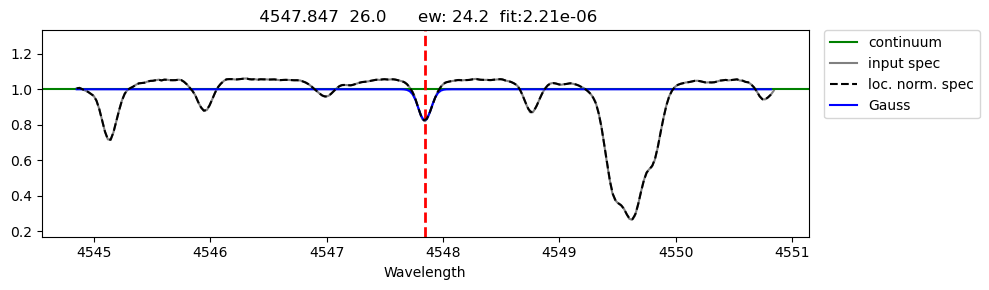

########################################
Writing to output file...

Moog entry:
   4547.847      26.0     3.544     -0.78                         24.17 2.213e-06 


#####
 4592.651 26.0
line 4592.651  was detected and it was classified as a strong line
I see 10 line(s) in this range
          Gauss : EW = 66.15 fq = 0.000006 o-c: 0.006888
using an EW from Gauss


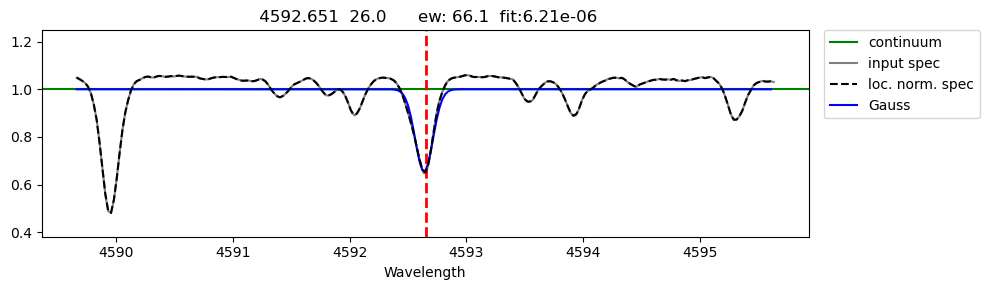

########################################
Writing to output file...

Moog entry:
   4592.651      26.0     1.557    -2.449                         66.15 6.208e-06 


#####
 4595.358 26.0
line 4595.358  was detected and it was classified as a strong line
I see 12 line(s) in this range
          Gauss : EW = 21.10 fq = 0.000000 o-c: 0.001769
using an EW from Gauss


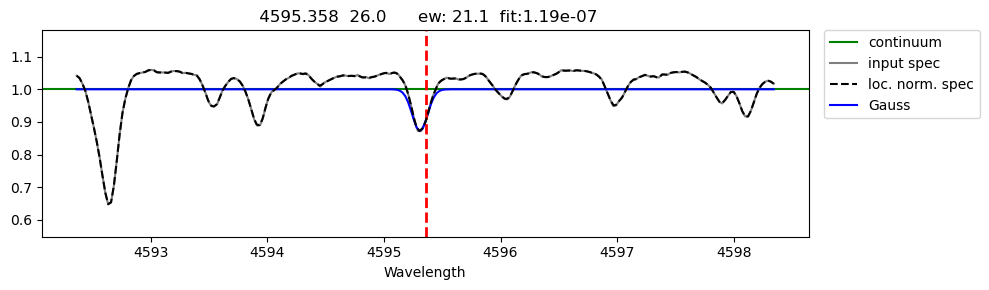

########################################
Writing to output file...

Moog entry:
   4595.358      26.0     3.301    -1.758                         21.10 1.188e-07 


#####
 4602.0 26.0
line 4602.0  was detected and it was classified as a strong line
I see 5 line(s) in this range
          Gauss : EW = 12.26 fq = 0.000000 o-c: 0.003837
using an EW from Gauss
Line is too strong or too weak


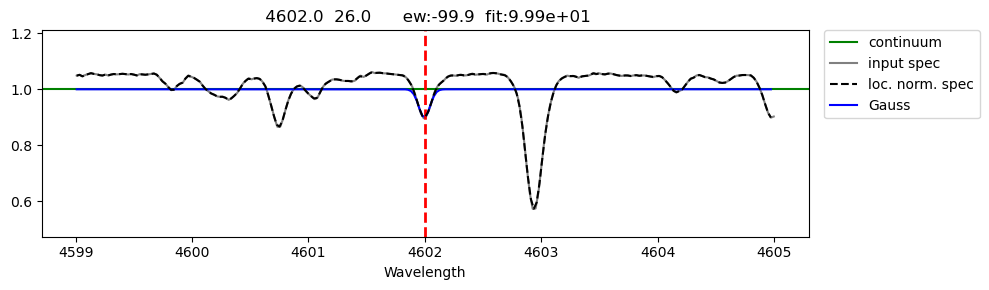

########################################
Writing to output file...

Moog entry:
     4602.0      26.0     1.608    -3.154                        -99.90 9.990e+01 


#####
 4602.941 26.0
line 4602.941  was detected and it was classified as a strong line
I see 9 line(s) in this range
          Gauss : EW = 71.68 fq = 0.000000 o-c: 0.000122
using an EW from Gauss


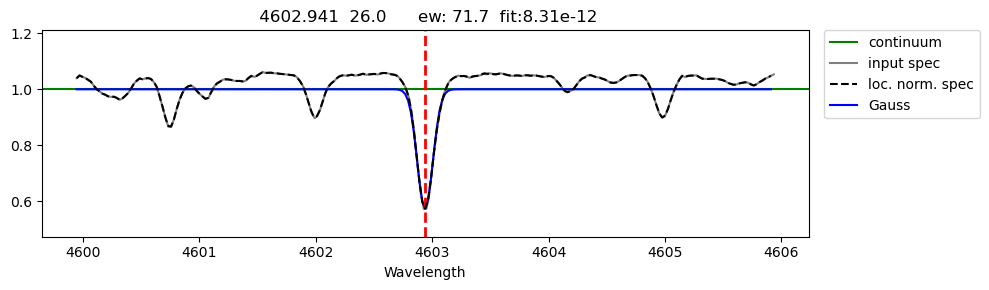

########################################
Writing to output file...

Moog entry:
   4602.941      26.0     1.485    -2.209                         71.68 8.306e-12 


#####
 4607.647 26.0
line 4607.647  was detected and it was classified as a strong line
I see 18 line(s) in this range
          Gauss : EW = 17.19 fq = 0.000000 o-c: 0.000398
using an EW from Gauss
Line is too strong or too weak


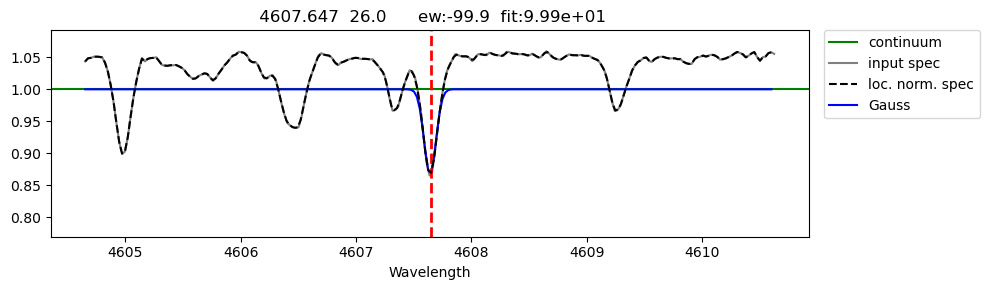

########################################
Writing to output file...

Moog entry:
   4607.647      26.0     3.263     -1.33                        -99.90 9.990e+01 


#####
 4619.288 26.0
line 4619.288  was detected and it was classified as a strong line
I see 12 line(s) in this range
          Gauss : EW = 16.34 fq = 0.000000 o-c: 0.001134
using an EW from Gauss
Line is too strong or too weak


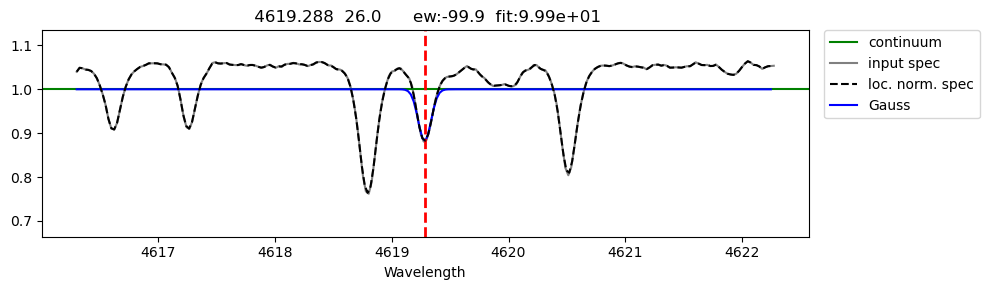

########################################
Writing to output file...

Moog entry:
   4619.288      26.0       3.6     -1.06                        -99.90 9.990e+01 


#####
 4630.12 26.0
line 4630.12  was detected and it was classified as a strong line
I see 6 line(s) in this range
          Gauss : EW = 15.56 fq = 0.000000 o-c: 0.005844
using an EW from Gauss
Line is too strong or too weak


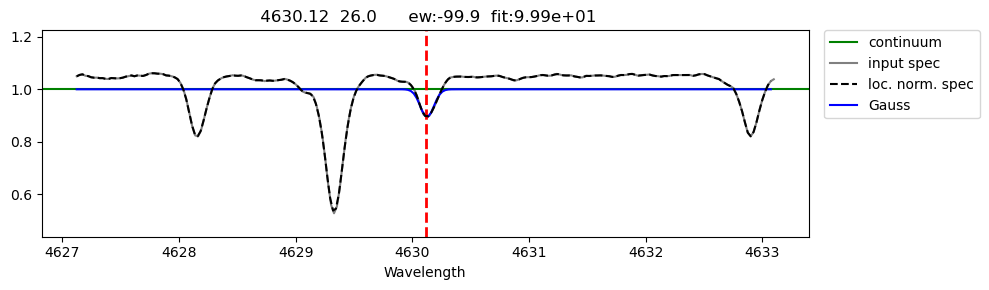

########################################
Writing to output file...

Moog entry:
    4630.12      26.0     2.279    -2.587                        -99.90 9.990e+01 


#####
 4637.503 26.0
line 4637.503  was detected and it was classified as a strong line
I see 8 line(s) in this range
          Gauss : EW = 18.02 fq = 0.000000 o-c: 0.000000
using an EW from Gauss
Line is too strong or too weak


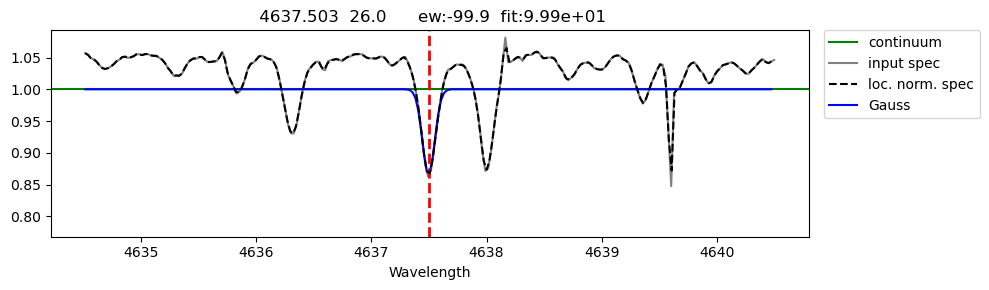

########################################
Writing to output file...

Moog entry:
   4637.503      26.0     3.281     -1.29                        -99.90 9.990e+01 


#####
 4647.434 26.0
line 4647.434  was detected and it was classified as a strong line
I see 16 line(s) in this range
          Gauss : EW = 38.25 fq = 0.000000 o-c: 0.001172
using an EW from Gauss


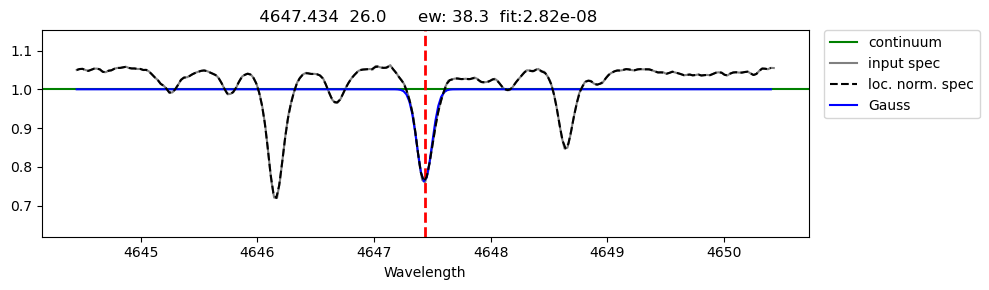

########################################
Writing to output file...

Moog entry:
   4647.434      26.0     2.949    -1.351                         38.25 2.818e-08 


#####
 4668.134 26.0
line 4668.134  was detected and it was classified as a strong line
I see 13 line(s) in this range
          Gauss : EW = 32.78 fq = 0.000000 o-c: 0.000602
using an EW from Gauss


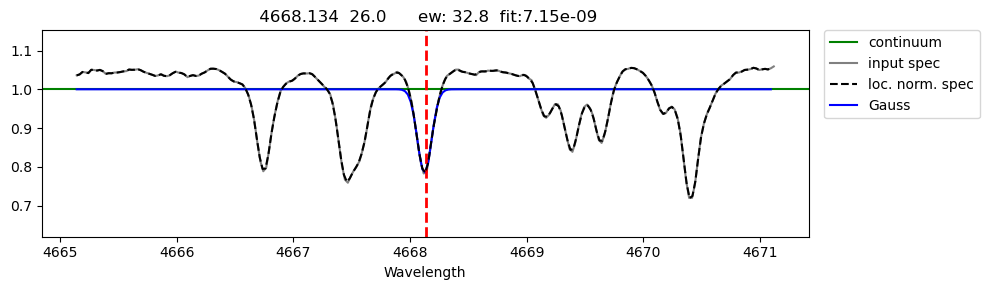

########################################
Writing to output file...

Moog entry:
   4668.134      26.0     3.263     -1.08                         32.78 7.146e-09 


#####
 4733.591 26.0
line 4733.591  was detected and it was classified as a strong line
I see 13 line(s) in this range
          Gauss : EW = 29.00 fq = 0.000000 o-c: 0.000114
using an EW from Gauss


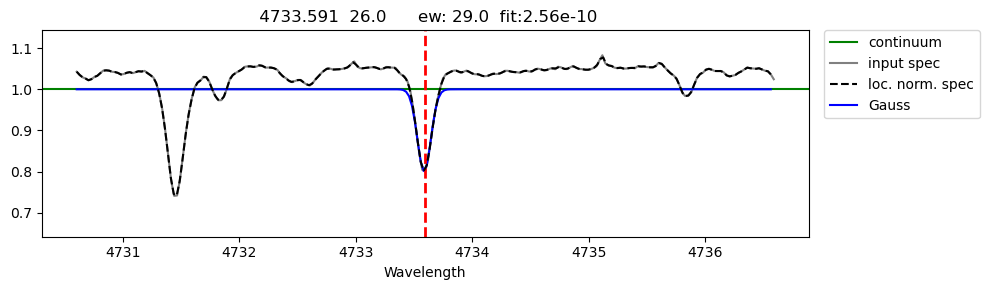

########################################
Writing to output file...

Moog entry:
   4733.591      26.0     1.485    -2.988                         29.00 2.565e-10 


#####
 4736.773 26.0
line 4736.773  was detected and it was classified as a strong line
I see 16 line(s) in this range
          Gauss : EW = 57.22 fq = 0.000000 o-c: 0.000146
using an EW from Gauss


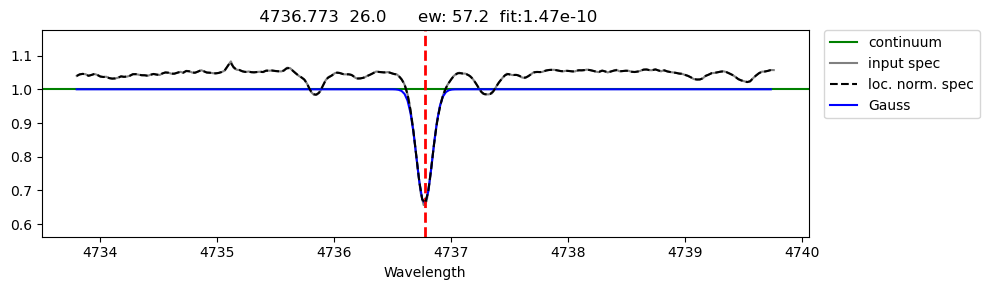

########################################
Writing to output file...

Moog entry:
   4736.773      26.0     3.211    -0.752                         57.22 1.465e-10 


#####
 4786.807 26.0
line 4786.807  was detected and it was classified as a strong line
I see 9 line(s) in this range
          Gauss : EW = 23.22 fq = 0.000000 o-c: 0.000259
using an EW from Gauss


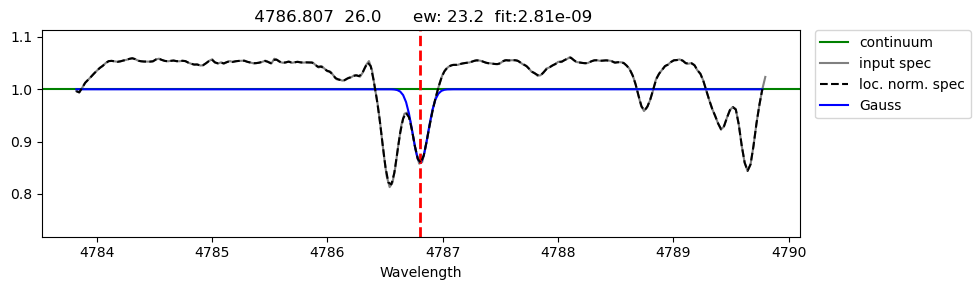

########################################
Writing to output file...

Moog entry:
   4786.807      26.0     3.017    -1.606                         23.22 2.809e-09 


#####
 4789.651 26.0
line 4789.651  was detected and it was classified as a strong line
I see 9 line(s) in this range
          Gauss : EW = 23.79 fq = 0.000000 o-c: 0.000000
using an EW from Gauss


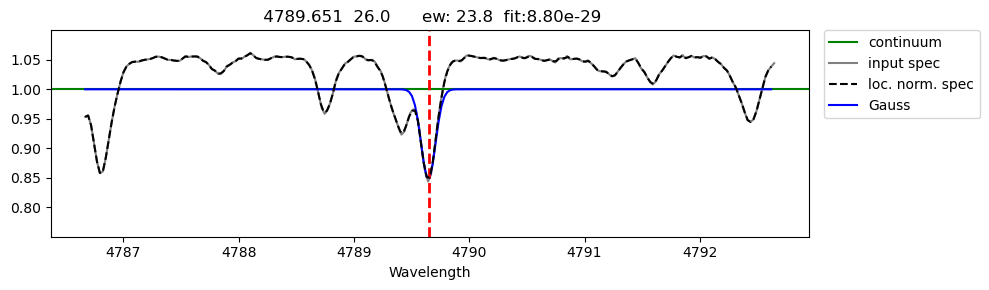

########################################
Writing to output file...

Moog entry:
   4789.651      26.0     3.547    -0.958                         23.79 8.798e-29 


#####
 4871.318 26.0
line 4871.318  was detected and it was classified as a strong line
I see 6 line(s) in this range
          Gauss : EW = 96.85 fq = 0.000000 o-c: 0.000179
using an EW from Gauss


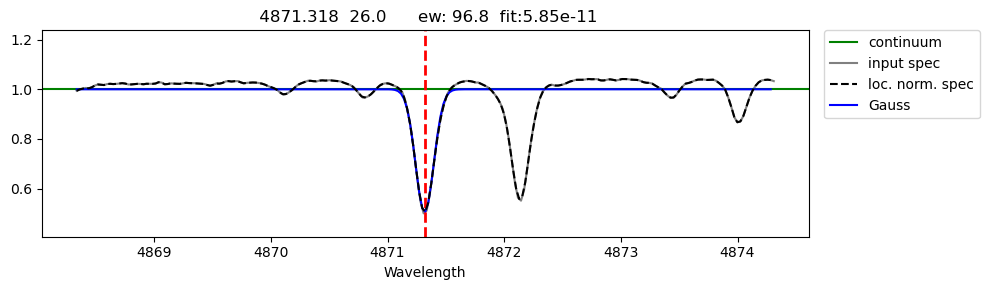

########################################
Writing to output file...

Moog entry:
   4871.318      26.0     2.865     -0.34                         96.85 5.851e-11 


#####
 4872.138 26.0
line 4872.138  was detected and it was classified as a strong line
I see 6 line(s) in this range
          Gauss : EW = 84.88 fq = 0.000000 o-c: 0.003447
using an EW from Gauss


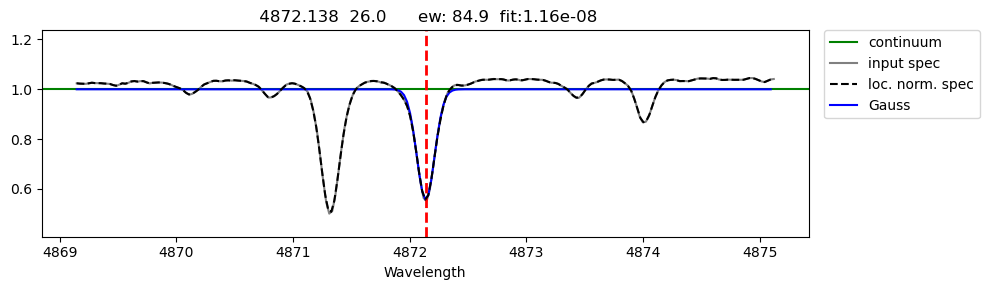

########################################
Writing to output file...

Moog entry:
   4872.138      26.0      2.88      -0.6                         84.88 1.156e-08 


#####
 4890.755 26.0
line 4890.755  was detected and it was classified as a strong line
I see 4 line(s) in this range
          Gauss : EW = 98.53 fq = 0.000000 o-c: 0.002162
using an EW from Gauss


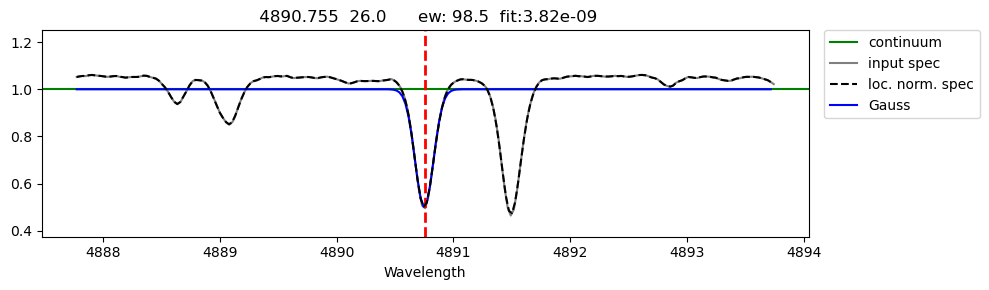

########################################
Writing to output file...

Moog entry:
   4890.755      26.0     2.876     -0.38                         98.53 3.825e-09 


#####
 4891.492 26.0
line 4891.492  was detected and it was classified as a strong line
I see 7 line(s) in this range
          Gauss : EW = 105.54 fq = 0.000000 o-c: 0.001313
using an EW from Gauss


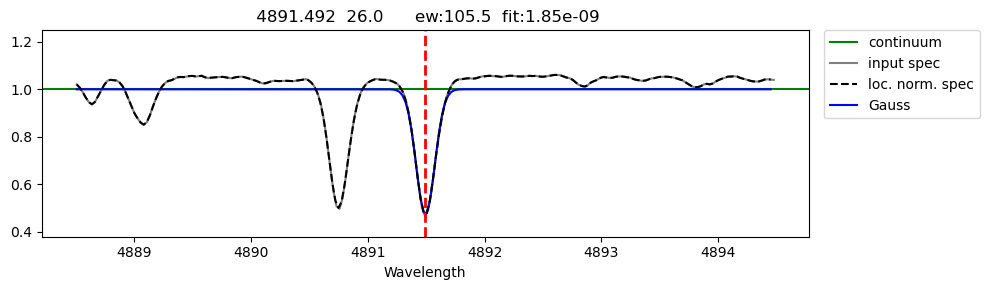

########################################
Writing to output file...

Moog entry:
   4891.492      26.0     2.849     -0.14                        105.54 1.846e-09 


#####
 4903.31 26.0
line 4903.31  was detected and it was classified as a strong line
I see 6 line(s) in this range
          Gauss : EW = 61.90 fq = 0.000000 o-c: 0.000136
using an EW from Gauss


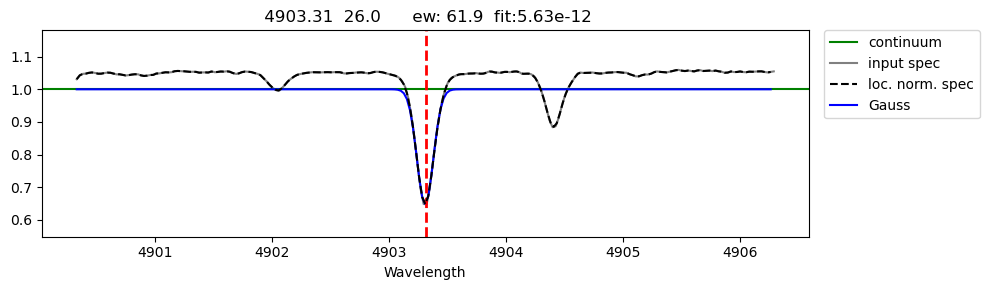

########################################
Writing to output file...

Moog entry:
    4903.31      26.0      2.88     -0.89                         61.90 5.627e-12 


#####
 4918.994 26.0
line 4918.994  was detected and it was classified as a strong line
I see 8 line(s) in this range
          Gauss : EW = 94.90 fq = 0.000000 o-c: 0.000950
using an EW from Gauss


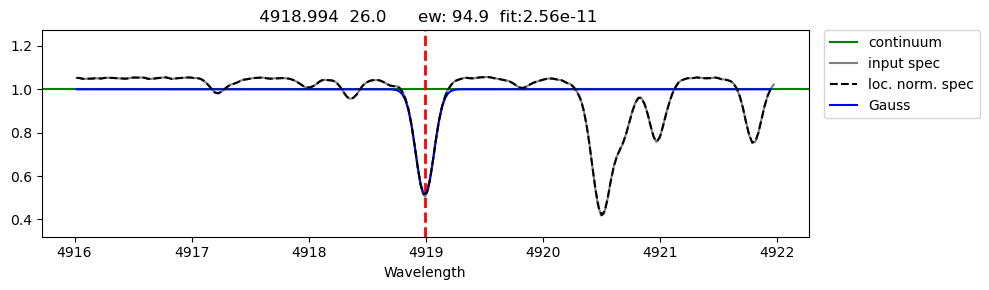

########################################
Writing to output file...

Moog entry:
   4918.994      26.0     2.863     -0.37                         94.90 2.564e-11 


#####
 4920.502 26.0
line 4920.502  was detected and it was classified as a strong line
I see 8 line(s) in this range
          Gauss : EW = 132.72 fq = 0.000019 o-c: 0.009959
using an EW from Gauss


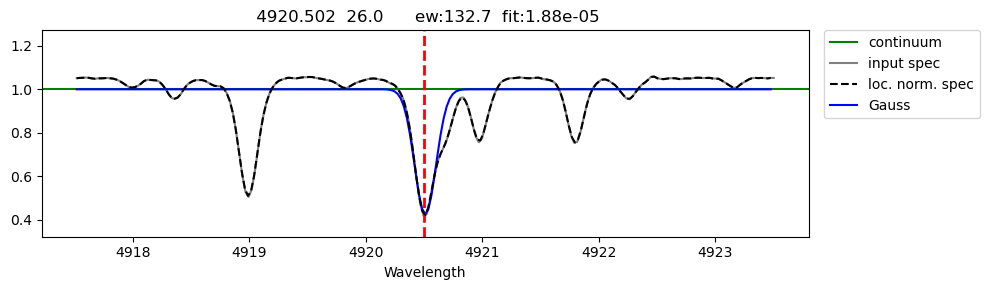

########################################
Writing to output file...

Moog entry:
   4920.502      26.0      2.83      0.06                        132.72 1.880e-05 


#####
 4939.687 26.0
line 4939.687  was detected and it was classified as a strong line
I see 9 line(s) in this range
          Gauss : EW = 45.26 fq = 0.000000 o-c: 0.000801
using an EW from Gauss


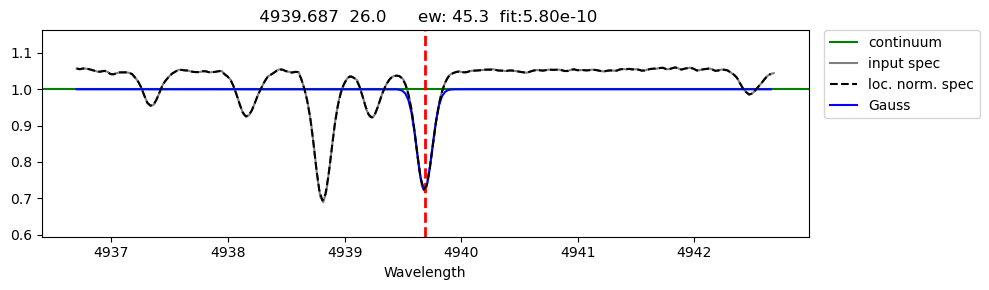

########################################
Writing to output file...

Moog entry:
   4939.687      26.0     0.858     -3.25                         45.26 5.798e-10 


#####
 4946.39 26.0
line 4946.39  was detected and it was classified as a strong line
I see 18 line(s) in this range
          Gauss : EW = 25.04 fq = 0.483441 o-c: 0.013854
using an EW from Gauss


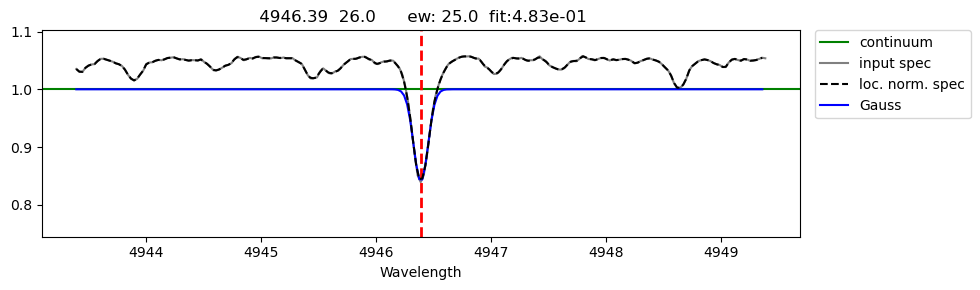

########################################
Writing to output file...

Moog entry:
    4946.39      26.0      3.37     -1.11                         25.04 4.834e-01 


#####
 4966.09 26.0
line 4966.09  was detected and it was classified as a strong line
I see 11 line(s) in this range
          Gauss : EW = 41.05 fq = 0.000000 o-c: 0.000000
using an EW from Gauss


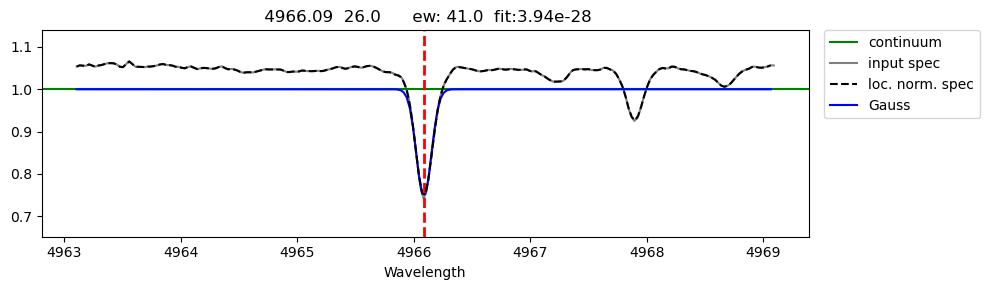

########################################
Writing to output file...

Moog entry:
    4966.09      26.0      3.33     -0.79                         41.05 3.942e-28 


#####
 4994.13 26.0
line 4994.13  was detected and it was classified as a strong line
I see 5 line(s) in this range
          Gauss : EW = 60.39 fq = 0.000000 o-c: 0.000280
using an EW from Gauss


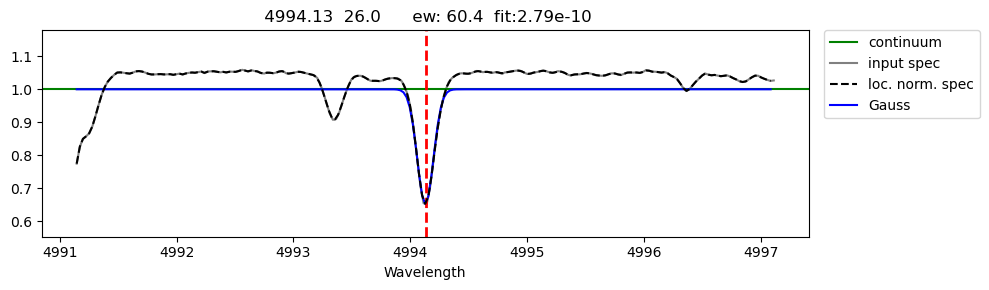

########################################
Writing to output file...

Moog entry:
    4994.13      26.0     0.914     -2.97                         60.39 2.792e-10 


#####
 5001.86 26.0
line 5001.86  was detected and it was classified as a strong line
I see 11 line(s) in this range
          Gauss : EW = 49.57 fq = 0.000000 o-c: 0.000158
using an EW from Gauss


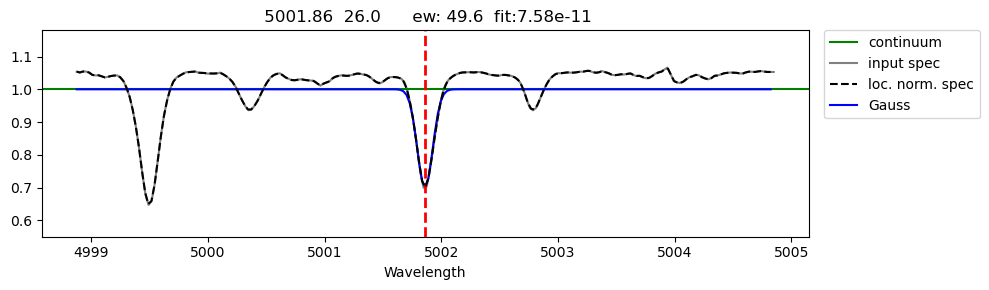

########################################
Writing to output file...

Moog entry:
    5001.86      26.0      3.88     -0.01                         49.57 7.577e-11 


#####
 5005.71 26.0
line 5005.71  was detected and it was classified as a strong line
I see 4 line(s) in this range
          Gauss : EW = 44.13 fq = 0.000000 o-c: 0.001972
using an EW from Gauss


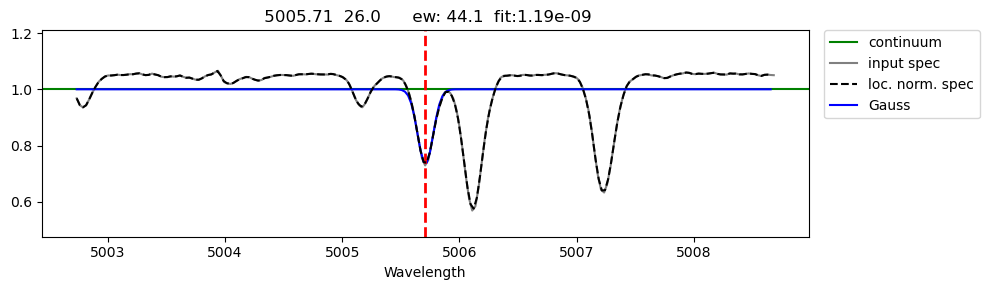

########################################
Writing to output file...

Moog entry:
    5005.71      26.0      3.88     -0.12                         44.13 1.187e-09 


#####
 5006.119 26.0
line 5006.119  was detected and it was classified as a strong line
I see 8 line(s) in this range
          Gauss : EW = 80.53 fq = 0.000000 o-c: 0.000539
using an EW from Gauss


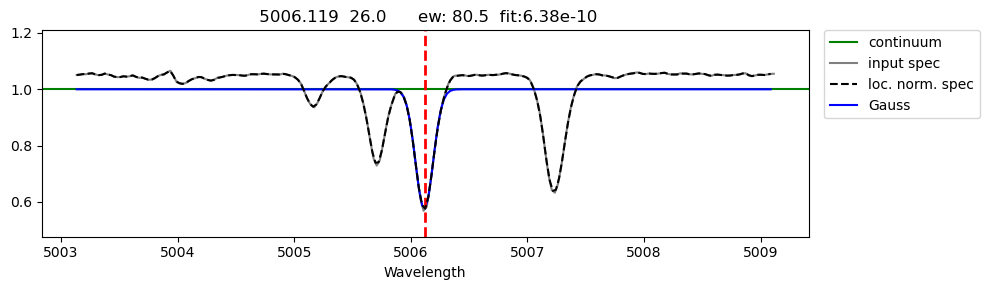

########################################
Writing to output file...

Moog entry:
   5006.119      26.0      2.83     -0.61                         80.53 6.380e-10 


#####
 5012.068 26.0
line 5012.068  was detected and it was classified as a strong line
I see 5 line(s) in this range
          Gauss : EW = 90.07 fq = 0.000000 o-c: 0.001421
using an EW from Gauss


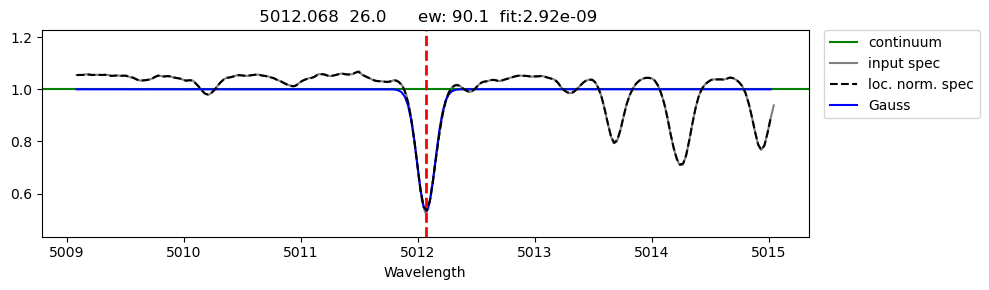

########################################
Writing to output file...

Moog entry:
   5012.068      26.0     0.858      -2.6                         90.07 2.918e-09 


#####
 5014.94 26.0
line 5014.94  was detected and it was classified as a strong line
I see 7 line(s) in this range
          Gauss : EW = 37.69 fq = 0.000000 o-c: 0.002048
using an EW from Gauss


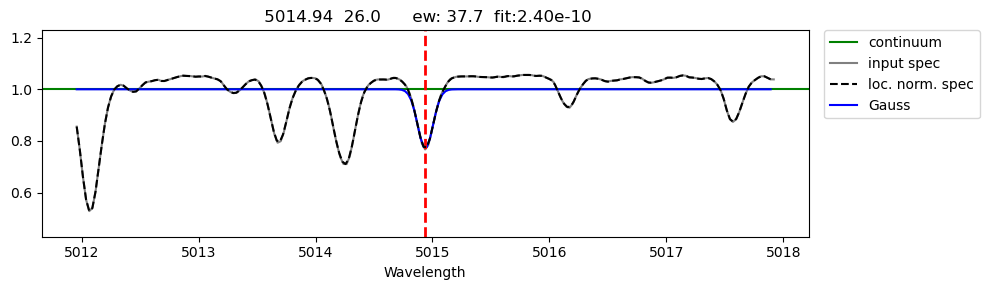

########################################
Writing to output file...

Moog entry:
    5014.94      26.0      3.94     -0.18                         37.69 2.395e-10 


#####
 5022.24 26.0
line 5022.24  was detected and it was classified as a strong line
I see 11 line(s) in this range
          Gauss : EW = 25.02 fq = 0.000000 o-c: 0.000014
using an EW from Gauss


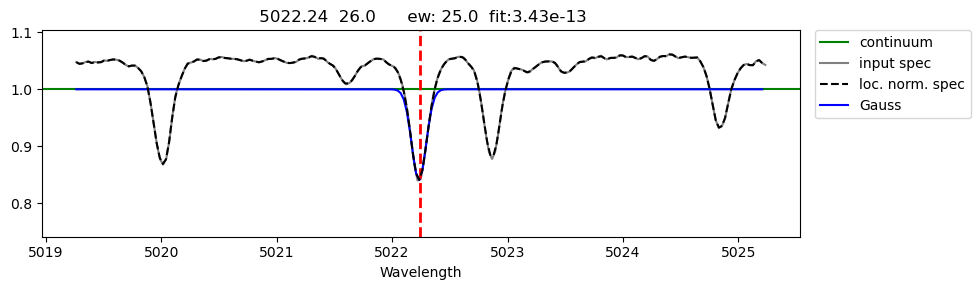

########################################
Writing to output file...

Moog entry:
    5022.24      26.0      3.98     -0.33                         25.02 3.435e-13 


#####
 5028.13 26.0
line 5028.13  was detected and it was classified as a strong line
I see 3 line(s) in this range
          Gauss : EW = 11.57 fq = 0.000000 o-c: 0.001465
using an EW from Gauss
Line is too strong or too weak


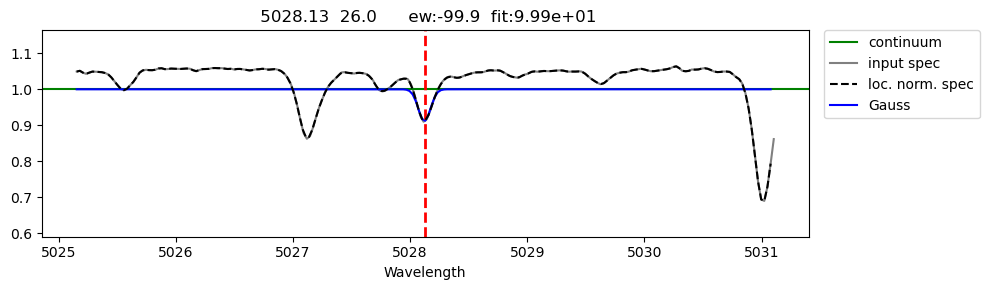

########################################
Writing to output file...

Moog entry:
    5028.13      26.0      3.57     -1.02                        -99.90 9.990e+01 


#####
 5039.25 26.0
line 5039.25  was detected and it was classified as a strong line
I see 10 line(s) in this range
          Gauss : EW = 9.65 fq = 0.000000 o-c: 0.005525
using an EW from Gauss
Line is too strong or too weak


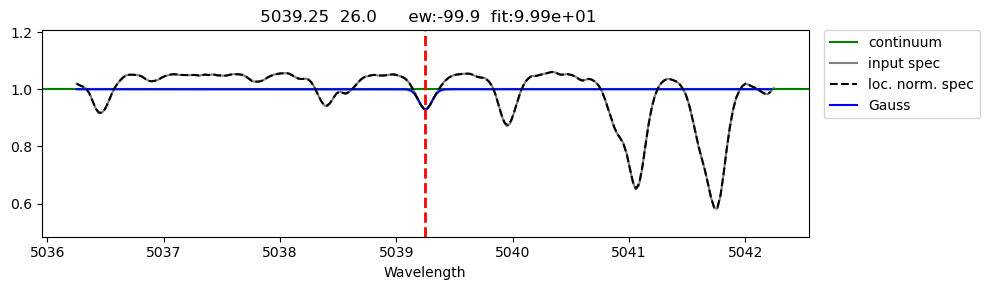

########################################
Writing to output file...

Moog entry:
    5039.25      26.0      3.37     -1.52                        -99.90 9.990e+01 


#####
 5041.756 26.0
line 5041.756  was detected and it was classified as a strong line
I see 9 line(s) in this range
          Gauss : EW = 103.29 fq = 0.000057 o-c: 0.004346
using an EW from Gauss


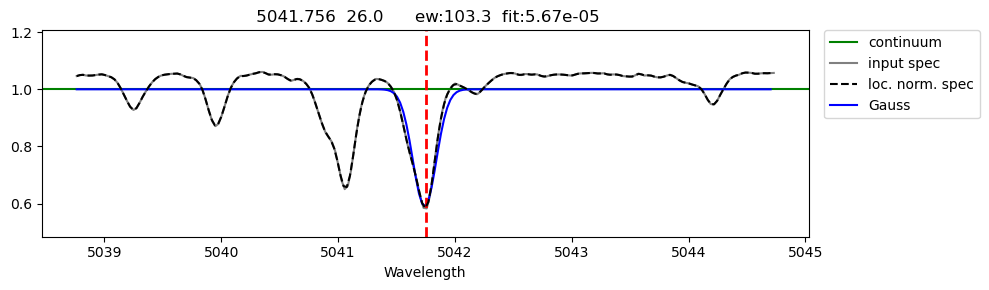

########################################
Writing to output file...

Moog entry:
   5041.756      26.0     1.484      -2.2                        103.29 5.666e-05 


#####
 5049.82 26.0
line 5049.82  was detected and it was classified as a strong line
I see 6 line(s) in this range
          Gauss : EW = 71.13 fq = 0.000000 o-c: 0.000254
using an EW from Gauss


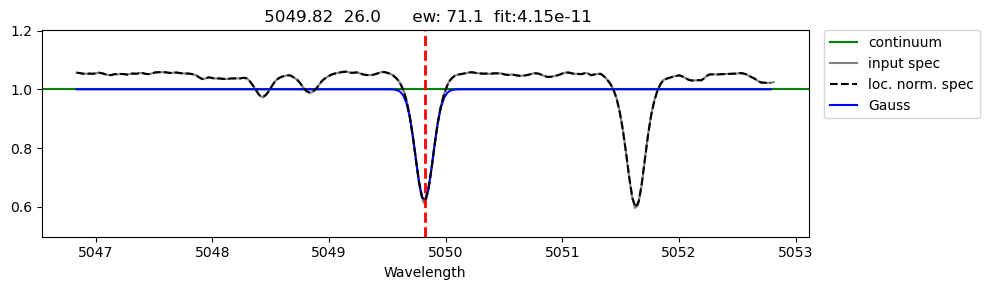

########################################
Writing to output file...

Moog entry:
    5049.82      26.0      2.28     -1.35                         71.13 4.146e-11 


#####
 5051.635 26.0
line 5051.635  was detected and it was classified as a strong line
I see 5 line(s) in this range
          Gauss : EW = 76.14 fq = 0.000000 o-c: 0.000921
using an EW from Gauss


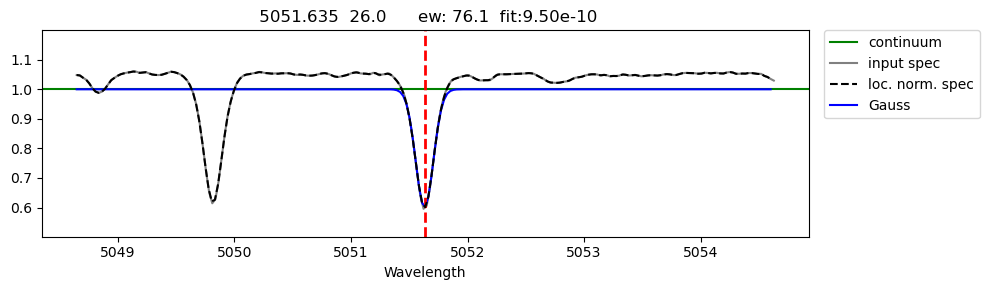

########################################
Writing to output file...

Moog entry:
   5051.635      26.0     0.914     -2.76                         76.14 9.500e-10 


#####
 5079.224 26.0
line 5079.224  was detected and it was classified as a strong line
I see 8 line(s) in this range
          Gauss : EW = 41.05 fq = 0.000000 o-c: 0.000820
using an EW from Gauss


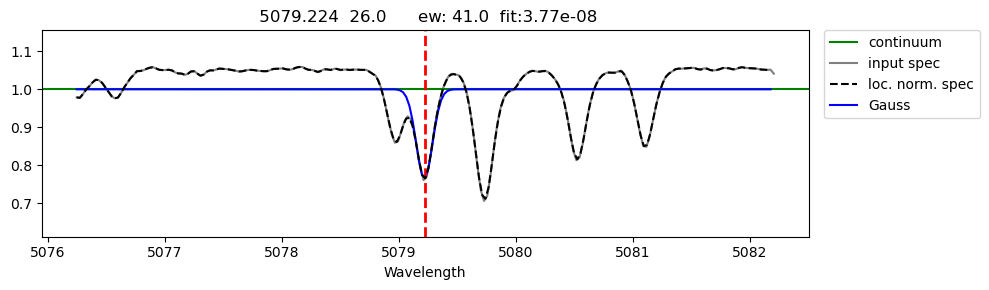

########################################
Writing to output file...

Moog entry:
   5079.224      26.0     2.196      -2.1                         41.05 3.768e-08 


#####
 5083.339 26.0
line 5083.339  was detected and it was classified as a strong line
I see 9 line(s) in this range
          Gauss : EW = 61.19 fq = 0.000000 o-c: 0.000220
using an EW from Gauss


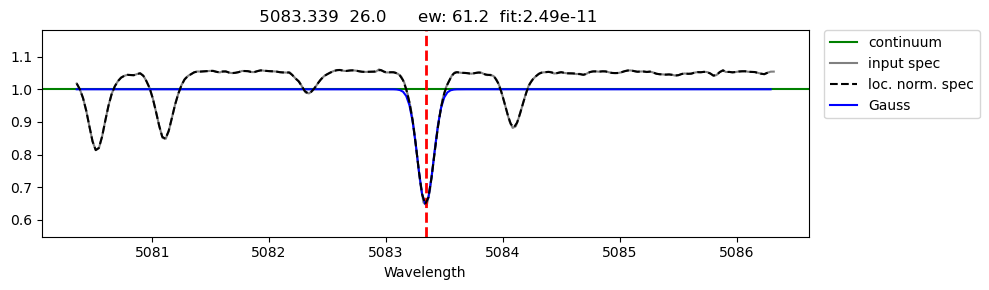

########################################
Writing to output file...

Moog entry:
   5083.339      26.0     0.957     -2.84                         61.19 2.487e-11 


#####
 5110.413 26.0
line 5110.413  was detected and it was classified as a strong line
I see 3 line(s) in this range
          Gauss : EW = 80.76 fq = 0.000000 o-c: 0.000948
using an EW from Gauss


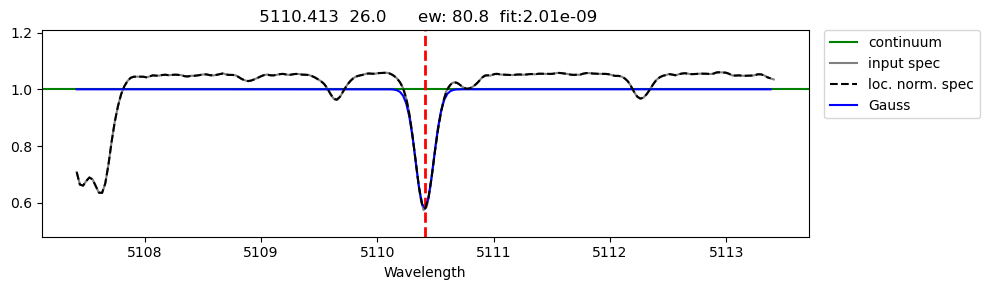

########################################
Writing to output file...

Moog entry:
   5110.413      26.0       0.0     -3.76                         80.76 2.012e-09 


#####
 5123.72 26.0
line 5123.72  was detected and it was classified as a strong line
I see 12 line(s) in this range
          Gauss : EW = 63.33 fq = 0.000000 o-c: 0.001296
using an EW from Gauss


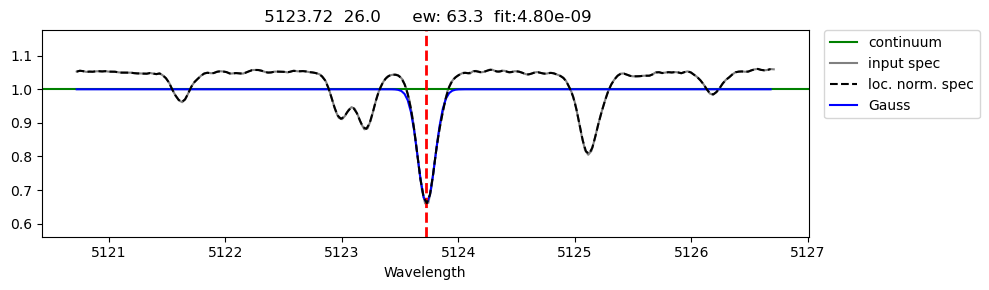

########################################
Writing to output file...

Moog entry:
    5123.72      26.0      1.01     -3.06                         63.33 4.798e-09 


#####
 5127.36 26.0
line 5127.36  was detected and it was classified as a strong line
I see 5 line(s) in this range
          Gauss : EW = 45.75 fq = 0.000000 o-c: 0.000060
using an EW from Gauss


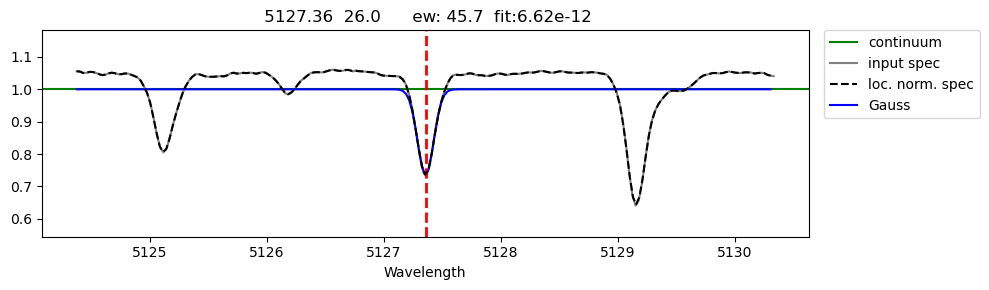

########################################
Writing to output file...

Moog entry:
    5127.36      26.0     0.914     -3.25                         45.75 6.616e-12 


#####
 5133.69 26.0
line 5133.69  was detected and it was classified as a strong line
I see 6 line(s) in this range
          Gauss : EW = 53.75 fq = 0.000000 o-c: 0.000291
using an EW from Gauss


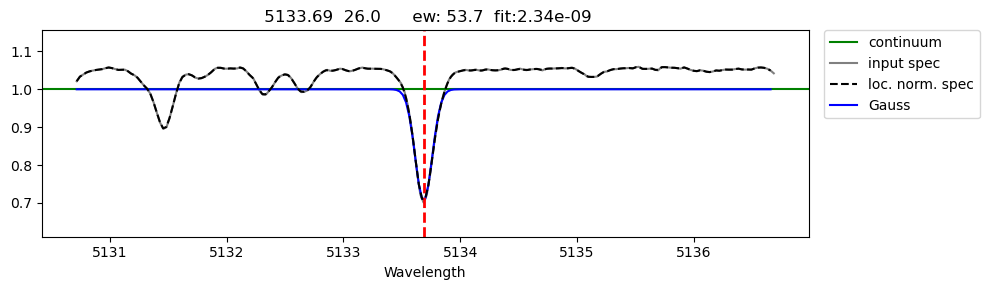

########################################
Writing to output file...

Moog entry:
    5133.69      26.0      4.18      0.36                         53.75 2.343e-09 


#####
 5150.84 26.0
line 5150.84  was detected and it was classified as a strong line
I see 8 line(s) in this range
          Gauss : EW = 49.74 fq = 0.000000 o-c: 0.000143
using an EW from Gauss


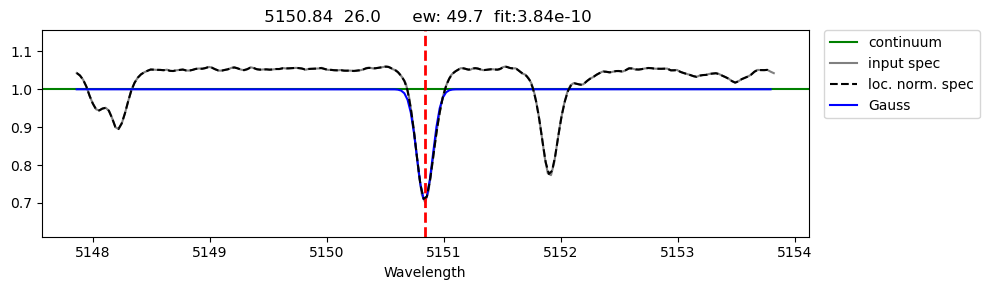

########################################
Writing to output file...

Moog entry:
    5150.84      26.0     0.989     -3.04                         49.74 3.836e-10 


#####
 5166.282 26.0
line 5166.282  was detected and it was classified as a strong line
I see 7 line(s) in this range
          Gauss : EW = 50.11 fq = 0.000000 o-c: 0.007346
using an EW from Gauss


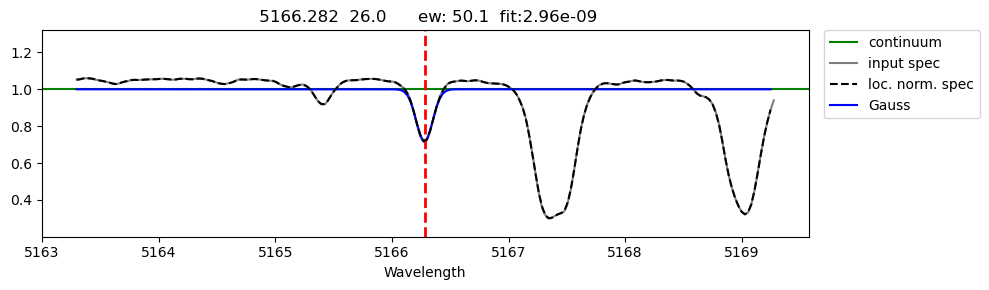

########################################
Writing to output file...

Moog entry:
   5166.282      26.0       0.0     -4.12                         50.11 2.958e-09 


#####
 5171.596 26.0
line 5171.596  was detected and it was classified as a strong line
I see 6 line(s) in this range
          Gauss : EW = 96.47 fq = 0.000000 o-c: 0.006039
using an EW from Gauss


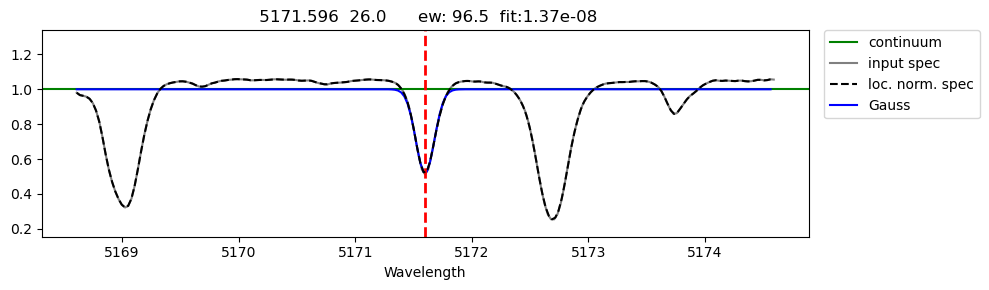

########################################
Writing to output file...

Moog entry:
   5171.596      26.0     1.484     -1.72                         96.47 1.368e-08 


#####
 5191.454 26.0
line 5191.454  was detected and it was classified as a strong line
I see 8 line(s) in this range
          Gauss : EW = 88.59 fq = 0.000004 o-c: 0.005508
using an EW from Gauss


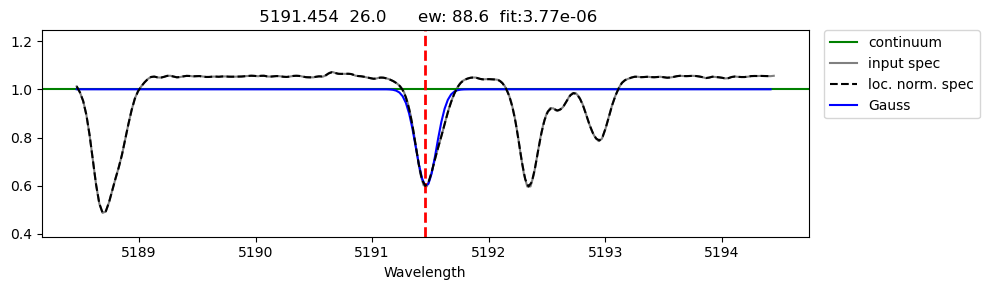

########################################
Writing to output file...

Moog entry:
   5191.454      26.0     3.036     -0.55                         88.59 3.774e-06 


#####
 5192.344 26.0
line 5192.344  was detected and it was classified as a strong line
I see 5 line(s) in this range
          Gauss : EW = 80.81 fq = 0.000000 o-c: 0.002556
using an EW from Gauss


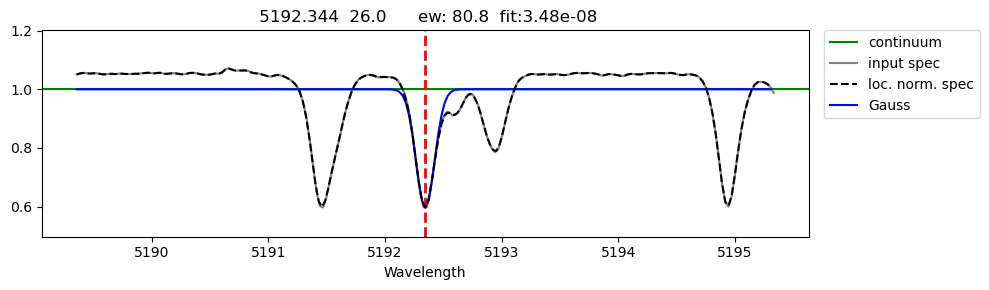

########################################
Writing to output file...

Moog entry:
   5192.344      26.0     2.996     -0.42                         80.81 3.481e-08 


#####
 5194.94 26.0
line 5194.94  was detected and it was classified as a strong line
I see 7 line(s) in this range
          Gauss : EW = 75.97 fq = 0.000000 o-c: 0.002547
using an EW from Gauss


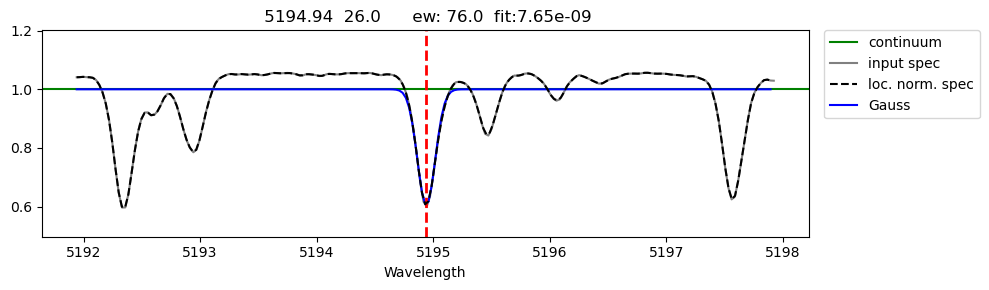

########################################
Writing to output file...

Moog entry:
    5194.94      26.0      1.56     -2.09                         75.97 7.653e-09 


#####
 5198.71 26.0
line 5198.71  was detected and it was classified as a strong line
I see 6 line(s) in this range
          Gauss : EW = 31.68 fq = 0.000000 o-c: 0.000094
using an EW from Gauss


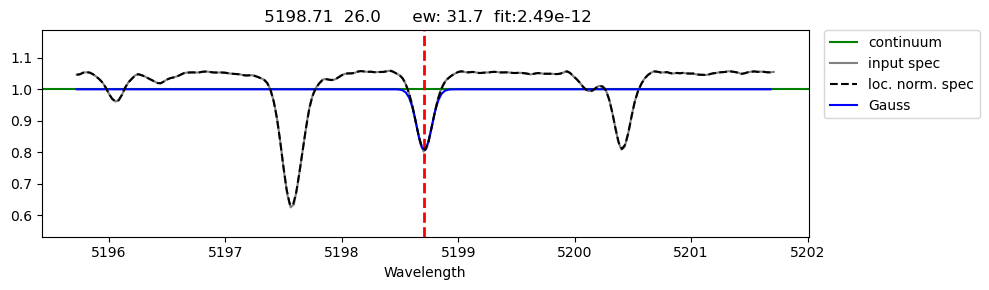

########################################
Writing to output file...

Moog entry:
    5198.71      26.0      2.22     -2.13                         31.68 2.489e-12 


#####
 5202.34 26.0
line 5202.34  was detected and it was classified as a strong line
I see 4 line(s) in this range
          Gauss : EW = 61.40 fq = 0.000000 o-c: 0.000635
using an EW from Gauss


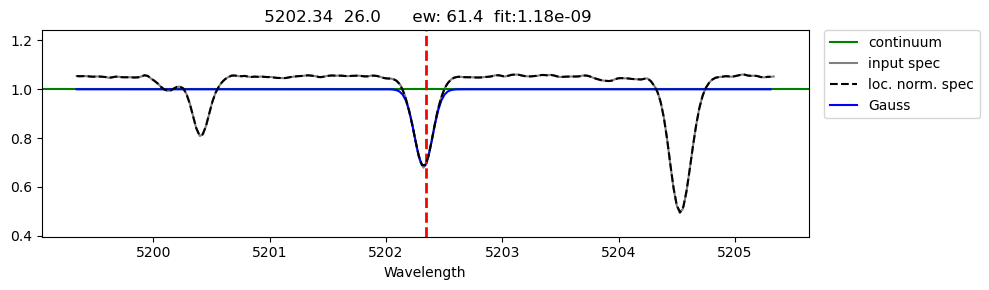

########################################
Writing to output file...

Moog entry:
    5202.34      26.0      2.18     -1.84                         61.40 1.185e-09 


#####
 5215.18 26.0
line 5215.18  was detected and it was classified as a strong line
I see 4 line(s) in this range
          Gauss : EW = 37.24 fq = 0.000000 o-c: 0.001349
using an EW from Gauss


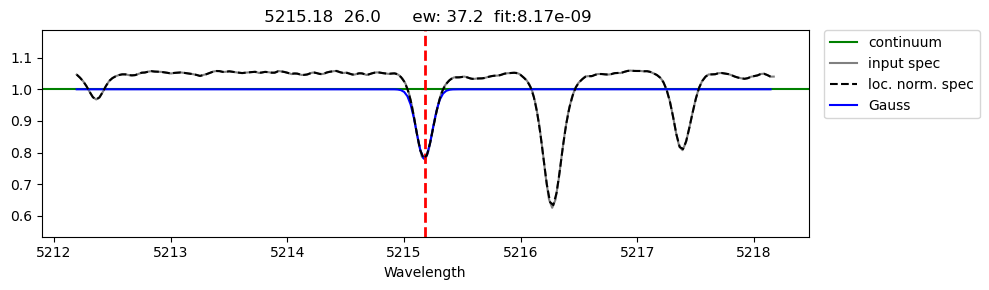

########################################
Writing to output file...

Moog entry:
    5215.18      26.0      3.27     -0.86                         37.24 8.168e-09 


#####
 5216.274 26.0
line 5216.274  was detected and it was classified as a strong line
I see 5 line(s) in this range
          Gauss : EW = 68.34 fq = 0.000000 o-c: 0.000262
using an EW from Gauss


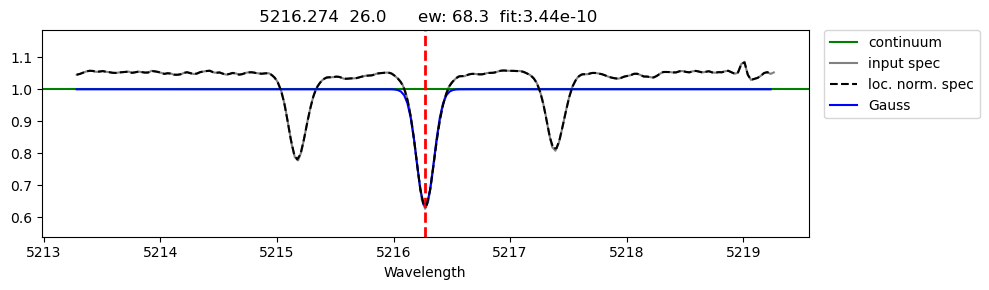

########################################
Writing to output file...

Moog entry:
   5216.274      26.0     1.607     -2.08                         68.34 3.438e-10 


#####
 5217.39 26.0
line 5217.39  was detected and it was classified as a strong line
I see 9 line(s) in this range
          Gauss : EW = 30.11 fq = 0.000000 o-c: 0.001925
using an EW from Gauss


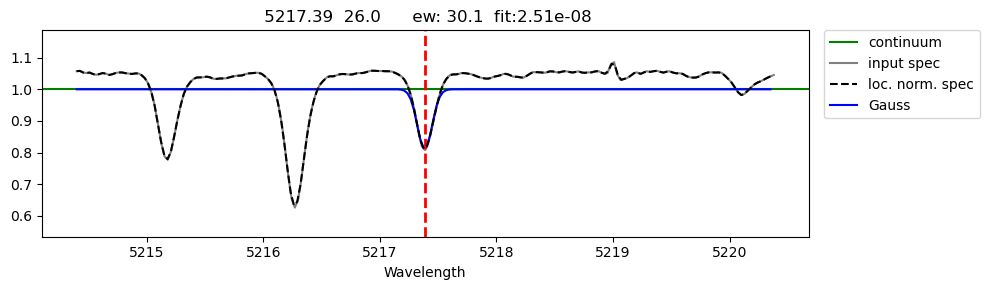

########################################
Writing to output file...

Moog entry:
    5217.39      26.0      3.21     -1.07                         30.11 2.510e-08 


#####
 5232.94 26.0
line 5232.94  was detected and it was classified as a strong line
I see 5 line(s) in this range
          Gauss : EW = 101.01 fq = 0.000000 o-c: 0.000285
using an EW from Gauss


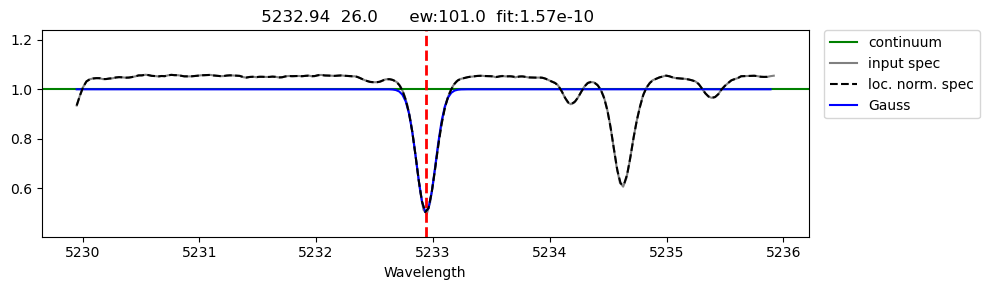

########################################
Writing to output file...

Moog entry:
    5232.94      26.0     2.938     -0.19                        101.01 1.575e-10 


#####
 5242.49 26.0
line 5242.49  was detected and it was classified as a strong line
I see 15 line(s) in this range
          Gauss : EW = 16.69 fq = 0.000000 o-c: 0.000000
using an EW from Gauss
Line is too strong or too weak


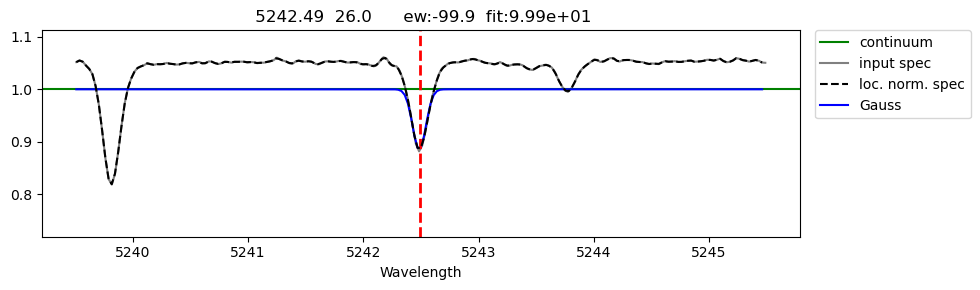

########################################
Writing to output file...

Moog entry:
    5242.49      26.0      3.63     -0.97                        -99.90 9.990e+01 


#####
 5263.31 26.0
line 5263.31  was detected and it was classified as a strong line
I see 10 line(s) in this range
          Gauss : EW = 37.15 fq = 0.000000 o-c: 0.000987
using an EW from Gauss


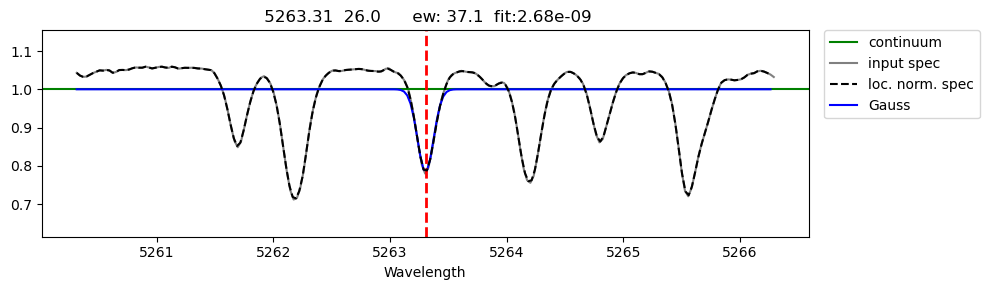

########################################
Writing to output file...

Moog entry:
    5263.31      26.0      3.27     -0.87                         37.15 2.675e-09 


#####
 5266.555 26.0
line 5266.555  was detected and it was classified as a strong line
I see 1 line(s) in this range
          Gauss : EW = 83.07 fq = 0.000000 o-c: 0.002298
using an EW from Gauss


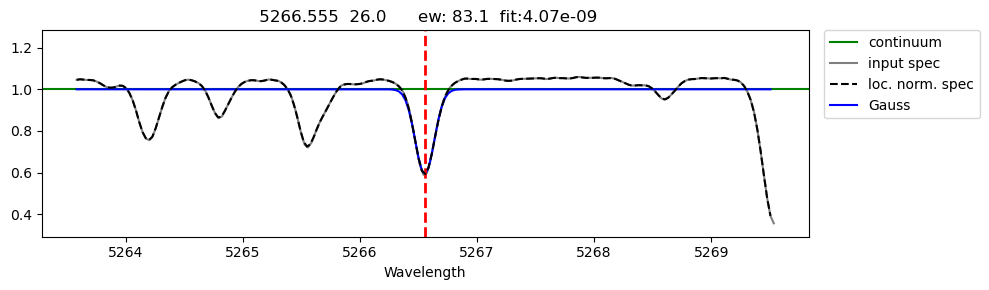

########################################
Writing to output file...

Moog entry:
   5266.555      26.0     2.996     -0.49                         83.07 4.065e-09 


#####
 5283.621 26.0
line 5283.621  was detected and it was classified as a strong line
I see 9 line(s) in this range
          Gauss : EW = 62.63 fq = 0.000000 o-c: 0.000486
using an EW from Gauss


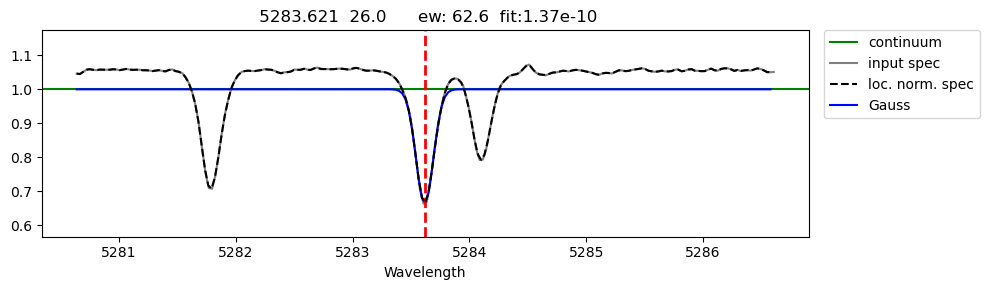

########################################
Writing to output file...

Moog entry:
   5283.621      26.0     3.239     -0.45                         62.63 1.368e-10 


#####
 5307.36 26.0
line 5307.36  was detected and it was classified as a strong line
I see 28 line(s) in this range
          Gauss : EW = 20.51 fq = 2.528420 o-c: 0.015371
using an EW from Gauss


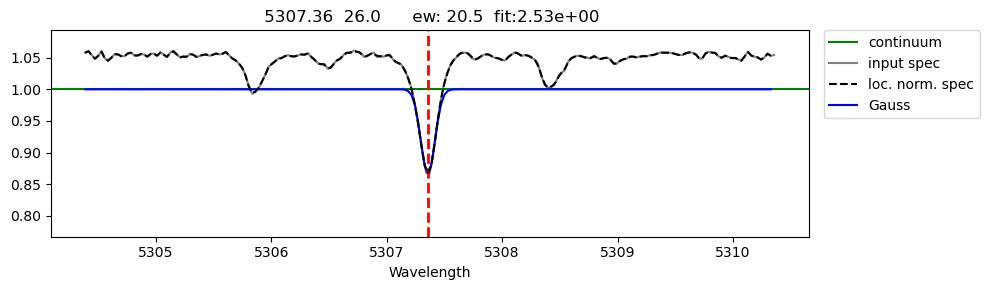

########################################
Writing to output file...

Moog entry:
    5307.36      26.0      1.61     -2.99                         20.51 2.528e+00 


#####
 5324.18 26.0
line 5324.18  was detected and it was classified as a strong line
I see 11 line(s) in this range
          Gauss : EW = 83.64 fq = 0.000000 o-c: 0.000124
using an EW from Gauss


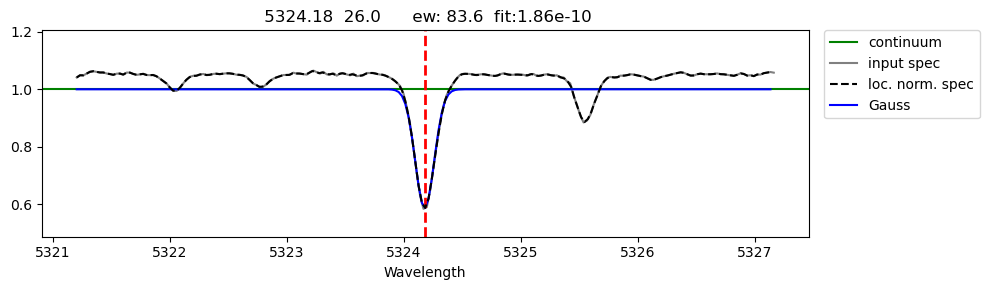

########################################
Writing to output file...

Moog entry:
    5324.18      26.0      3.21     -0.11                         83.64 1.858e-10 


#####
 5332.9 26.0
line 5332.9  was detected and it was classified as a strong line
I see 21 line(s) in this range
          Gauss : EW = 28.37 fq = 0.376200 o-c: 0.015212
using an EW from Gauss


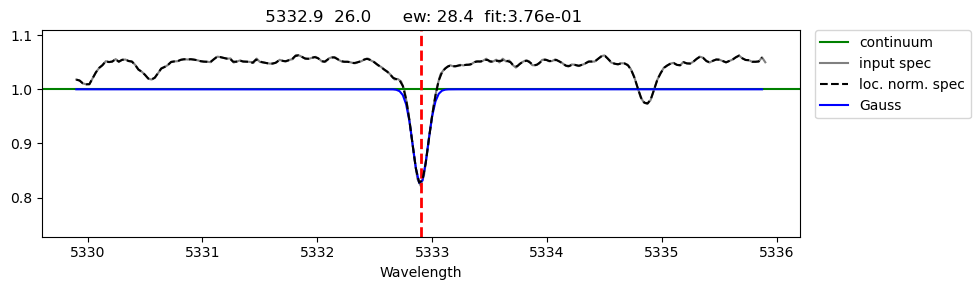

########################################
Writing to output file...

Moog entry:
     5332.9      26.0      1.56     -2.78                         28.37 3.762e-01 


#####
 5339.93 26.0
line 5339.93  was detected and it was classified as a strong line
I see 4 line(s) in this range
          Gauss : EW = 50.46 fq = 0.000000 o-c: 0.001148
using an EW from Gauss


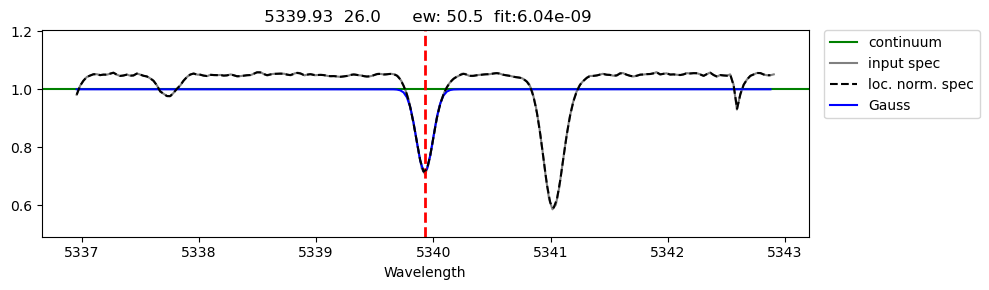

########################################
Writing to output file...

Moog entry:
    5339.93      26.0      3.27     -0.63                         50.46 6.044e-09 


#####
 5341.02 26.0
line 5341.02  was detected and it was classified as a strong line
I see 7 line(s) in this range
          Gauss : EW = 82.26 fq = 0.000000 o-c: 0.000894
using an EW from Gauss


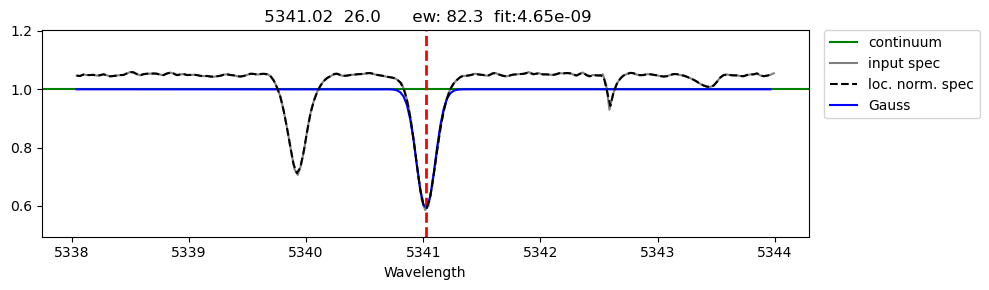

########################################
Writing to output file...

Moog entry:
    5341.02      26.0      1.61     -1.95                         82.26 4.654e-09 


#####
 5383.369 26.0
line 5383.369  was detected and it was classified as a strong line
I see 11 line(s) in this range
          Gauss : EW = 59.52 fq = 0.000000 o-c: 0.000170
using an EW from Gauss


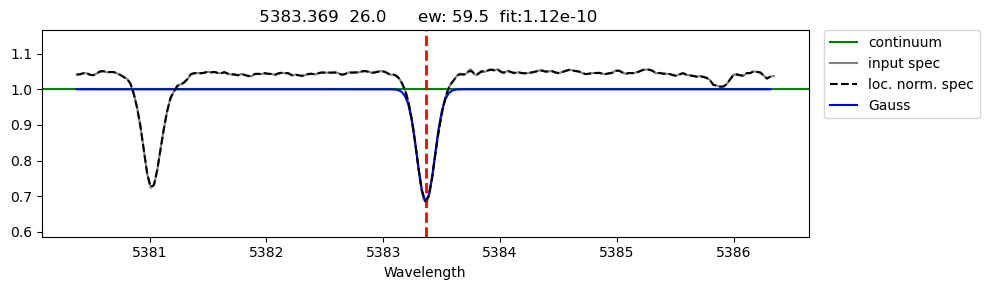

########################################
Writing to output file...

Moog entry:
   5383.369      26.0     4.309       0.5                         59.52 1.125e-10 


#####
 5397.128 26.0
line 5397.128  was detected and it was classified as a strong line
I see 13 line(s) in this range
          Gauss : EW = 118.11 fq = 0.000000 o-c: 0.000466
using an EW from Gauss


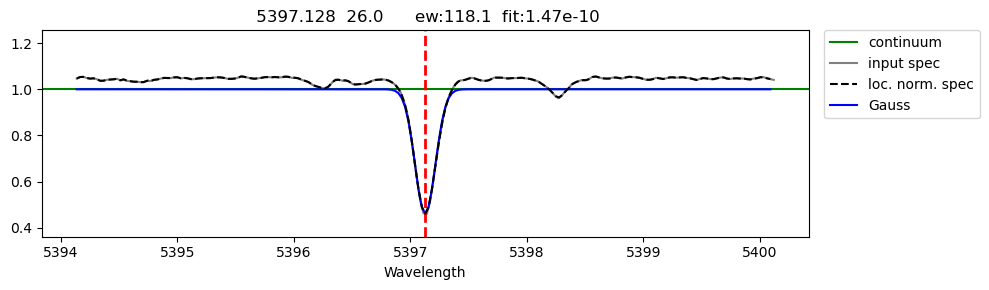

########################################
Writing to output file...

Moog entry:
   5397.128      26.0     0.914     -1.98                        118.11 1.471e-10 


#####
 5405.775 26.0
line 5405.775  was detected and it was classified as a strong line
I see 9 line(s) in this range
          Gauss : EW = 121.54 fq = 0.000000 o-c: 0.000090
using an EW from Gauss


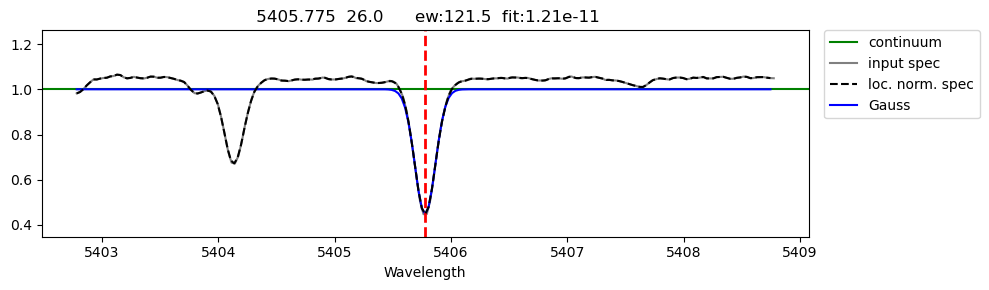

########################################
Writing to output file...

Moog entry:
   5405.775      26.0     0.989     -1.85                        121.54 1.208e-11 


#####
 5424.068 26.0
line 5424.068  was detected and it was classified as a strong line
I see 15 line(s) in this range
          Gauss : EW = 61.76 fq = 0.000000 o-c: 0.000098
using an EW from Gauss


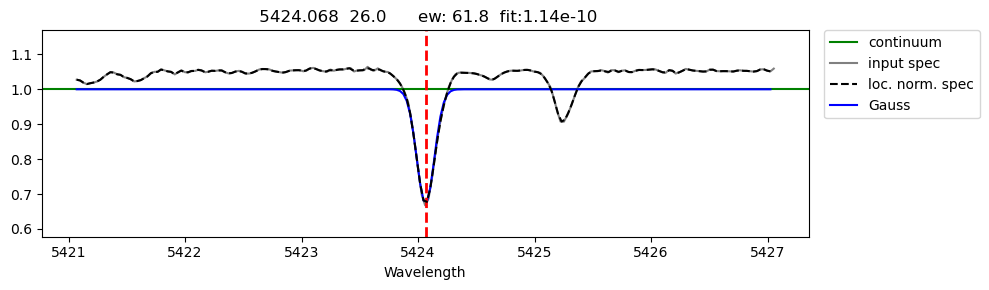

########################################
Writing to output file...

Moog entry:
   5424.068      26.0     4.317      0.52                         61.76 1.136e-10 


#####
 5429.696 26.0
line 5429.696  was detected and it was classified as a strong line
I see 11 line(s) in this range
          Gauss : EW = 125.34 fq = 0.000000 o-c: 0.000659
using an EW from Gauss


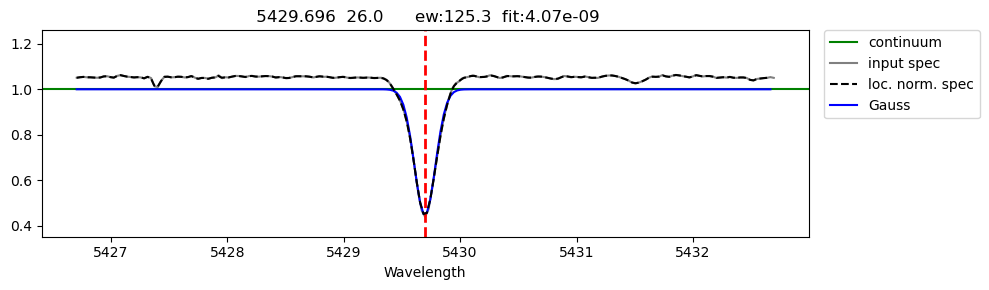

########################################
Writing to output file...

Moog entry:
   5429.696      26.0     0.957     -1.88                        125.34 4.070e-09 


#####
 5434.524 26.0
line 5434.524  was detected and it was classified as a strong line
I see 13 line(s) in this range
          Gauss : EW = 103.30 fq = 0.000000 o-c: 0.000950
using an EW from Gauss


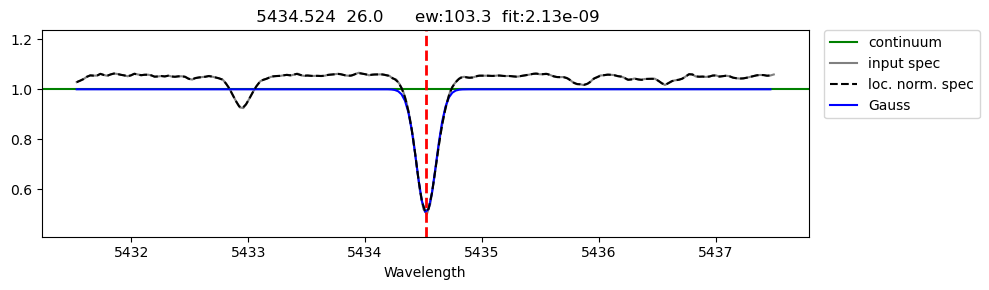

########################################
Writing to output file...

Moog entry:
   5434.524      26.0      1.01     -2.13                        103.30 2.129e-09 


#####
 5497.516 26.0
line 5497.516  was detected and it was classified as a strong line
I see 19 line(s) in this range
          Gauss : EW = 74.24 fq = 0.000000 o-c: 0.000458
using an EW from Gauss


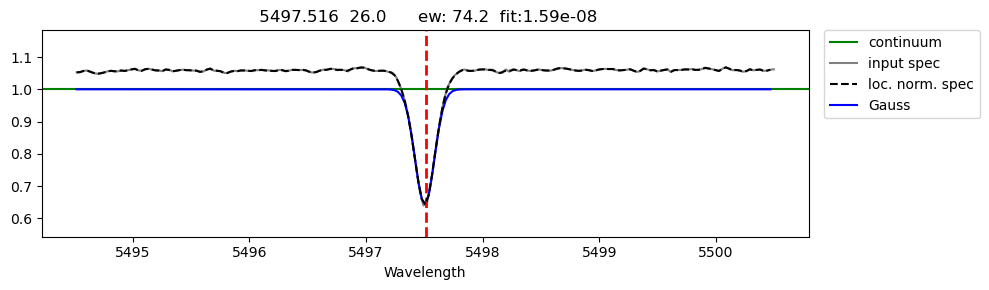

########################################
Writing to output file...

Moog entry:
   5497.516      26.0      1.01     -2.83                         74.24 1.592e-08 


#####
 5501.465 26.0
line 5501.465  was detected and it was classified as a strong line
I see 16 line(s) in this range
          Gauss : EW = 55.77 fq = 0.000000 o-c: 0.000126
using an EW from Gauss


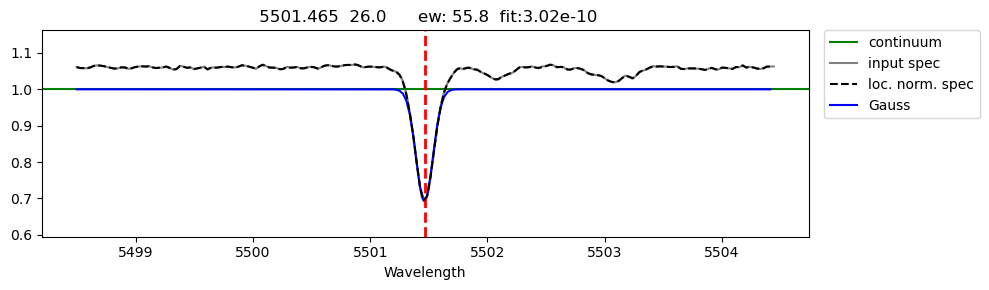

########################################
Writing to output file...

Moog entry:
   5501.465      26.0     0.957     -3.05                         55.77 3.023e-10 


#####
 5506.779 26.0
line 5506.779  was detected and it was classified as a strong line
I see 18 line(s) in this range
          Gauss : EW = 67.50 fq = 0.000000 o-c: 0.000008
using an EW from Gauss


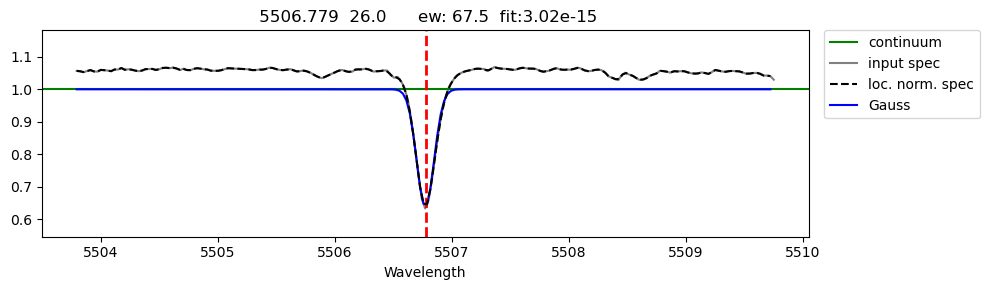

########################################
Writing to output file...

Moog entry:
   5506.779      26.0     0.989     -2.79                         67.50 3.018e-15 


#####
 5554.9 26.0
line 5554.9  was detected and it was classified as a strong line
I see 29 line(s) in this range
          Gauss : EW = 11.41 fq = 89364282560144460377593652896071680.000000 o-c: 0.009324
using an EW from Gauss
Line is too strong or too weak


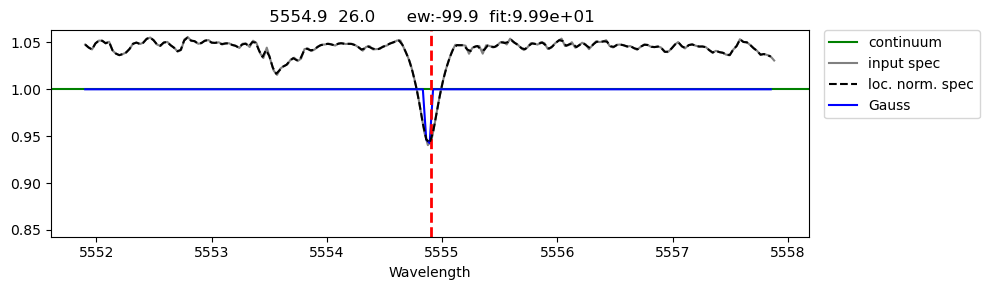

########################################
Writing to output file...

Moog entry:
     5554.9      26.0      4.55     -0.27                        -99.90 9.990e+01 


#####
 5569.62 26.0
line 5569.62  was detected and it was classified as a strong line
I see 19 line(s) in this range
          Gauss : EW = 49.59 fq = 0.000000 o-c: 0.000049
using an EW from Gauss


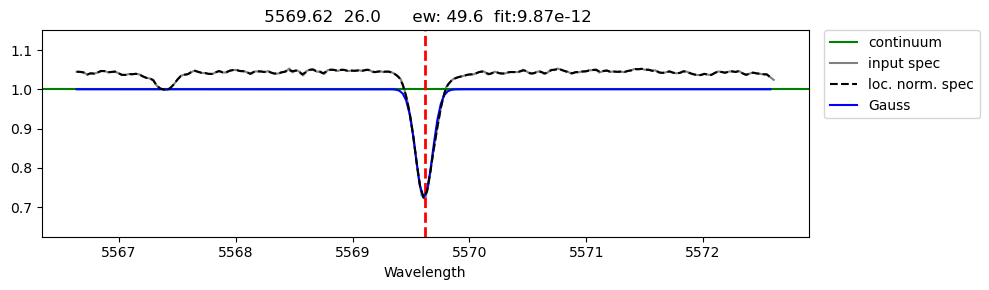

########################################
Writing to output file...

Moog entry:
    5569.62      26.0      3.42     -0.52                         49.59 9.873e-12 


#####
 5586.76 26.0
line 5586.76  was detected and it was classified as a strong line
I see 11 line(s) in this range
          Gauss : EW = 76.16 fq = 0.000000 o-c: 0.000151
using an EW from Gauss


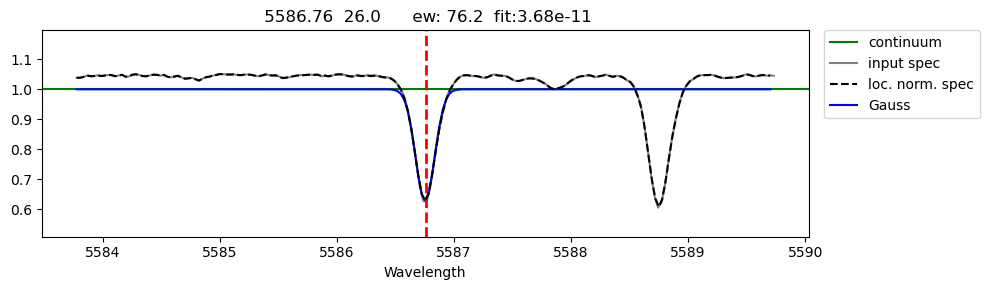

########################################
Writing to output file...

Moog entry:
    5586.76      26.0      3.37     -0.11                         76.16 3.676e-11 


#####
 5624.542 26.0
line 5624.542  was detected and it was classified as a strong line
I see 22 line(s) in this range
          Gauss : EW = 35.73 fq = 0.186165 o-c: 0.012208
using an EW from Gauss


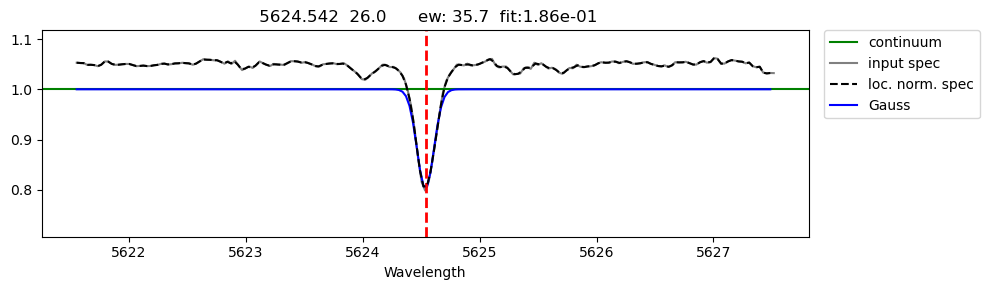

########################################
Writing to output file...

Moog entry:
   5624.542      26.0     3.414     -0.76                         35.73 1.862e-01 


#####
 5662.516 26.0
line 5662.516  was detected and it was classified as a strong line
I see 24 line(s) in this range
          Gauss : EW = 11.69 fq = 0.000000 o-c: 0.000000
using an EW from Gauss
Line is too strong or too weak


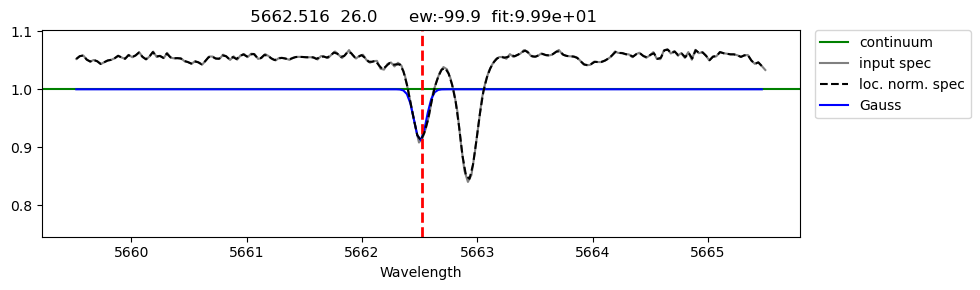

########################################
Writing to output file...

Moog entry:
   5662.516      26.0     4.175     -0.41                        -99.90 9.990e+01 


#####
 5753.12 26.0
line 5753.12  was detected and it was classified as a strong line
I see 25 line(s) in this range
          Gauss : EW = 4.69 fq = 1234.237044 o-c: 0.014139
using an EW from Gauss
Line is too strong or too weak


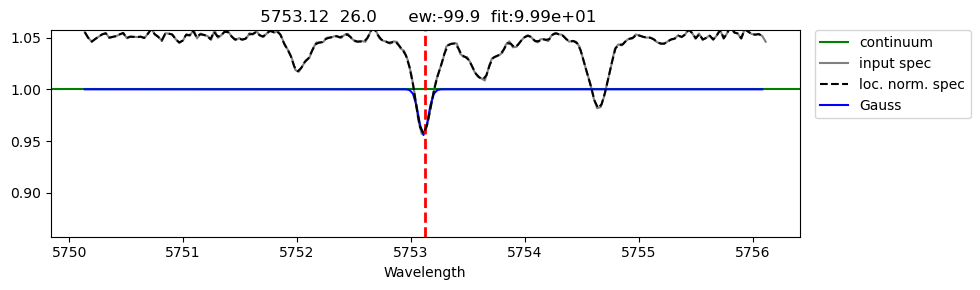

########################################
Writing to output file...

Moog entry:
    5753.12      26.0      4.26     -0.62                        -99.90 9.990e+01 


#####
 5762.992 26.0
line 5762.992  was detected and it was classified as a strong line
I see 22 line(s) in this range
          Gauss : EW = 20.42 fq = 3.598596 o-c: 0.011743
using an EW from Gauss


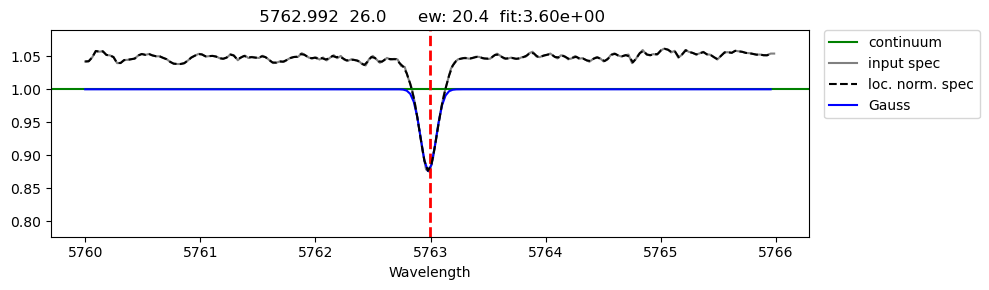

########################################
Writing to output file...

Moog entry:
   5762.992      26.0     4.209     -0.36                         20.42 3.599e+00 


#####
 5775.08 26.0
line 5775.08  was detected and it was classified as a strong line
I see 15 line(s) in this range
Covariance matrix is empty
          Gauss : EW = 1.77 fq = 667867234.148793 o-c: 0.009841
using an EW from Gauss
Line is too strong or too weak


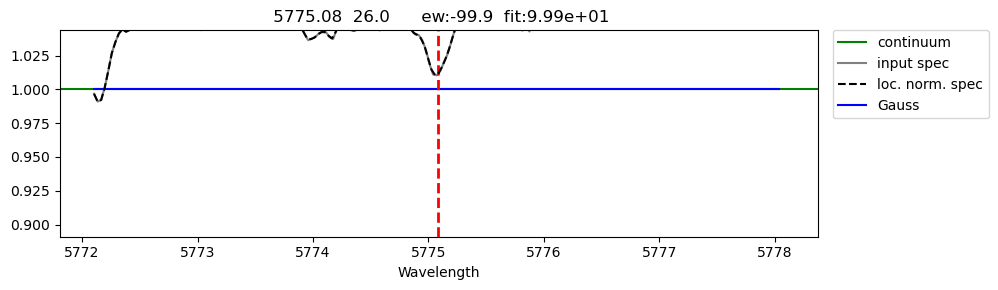

########################################
Writing to output file...

Moog entry:
    5775.08      26.0      4.22     -1.08                        -99.90 9.990e+01 


#####
 6056.0 26.0
line 6056.0  was detected and it was classified as a strong line
I see 26 line(s) in this range
          Gauss : EW = 47.94 fq = 96983729289121526536269842249980029504045015379199052036896363848820326400.000000 o-c: 0.008748
using an EW from Gauss


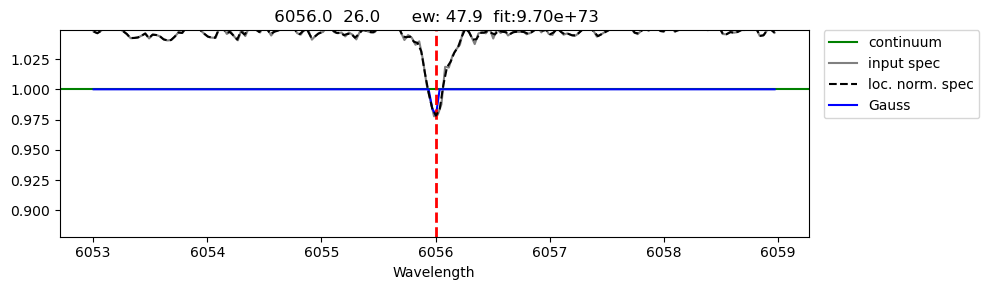

########################################
Writing to output file...

Moog entry:
     6056.0      26.0      4.73     -0.32                         47.94 9.698e+73 


#####
 6065.482 26.0
line 6065.482  was detected and it was classified as a strong line
I see 19 line(s) in this range
          Gauss : EW = 41.69 fq = 0.000000 o-c: 0.000000
using an EW from Gauss


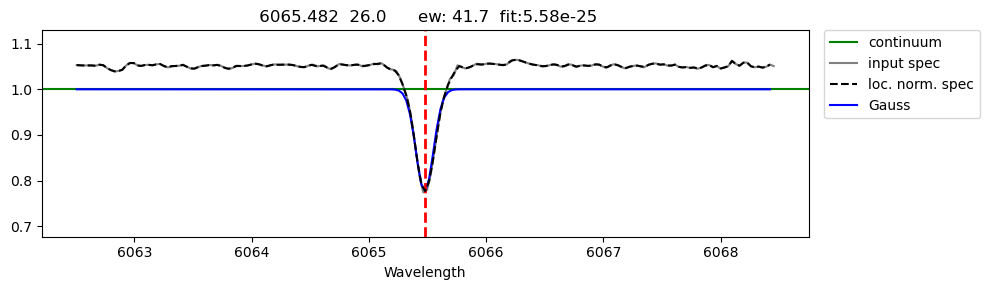

########################################
Writing to output file...

Moog entry:
   6065.482      26.0     2.607     -1.53                         41.69 5.581e-25 


#####
 6191.558 26.0
line 6191.558  was detected and it was classified as a strong line
I see 15 line(s) in this range
          Gauss : EW = 56.40 fq = 0.000000 o-c: 0.000128
using an EW from Gauss


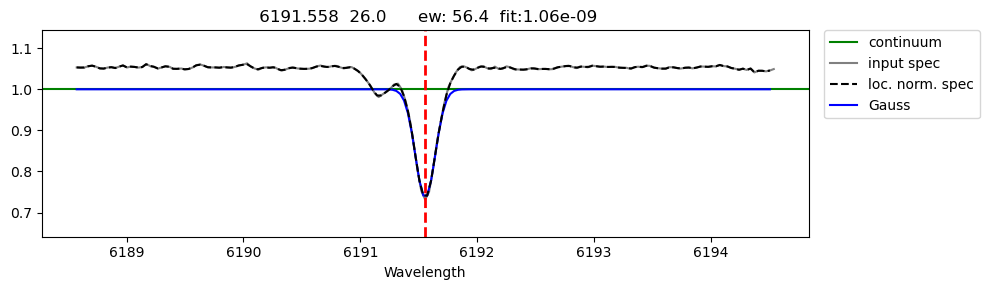

########################################
Writing to output file...

Moog entry:
   6191.558      26.0     2.431      -1.6                         56.40 1.059e-09 


#####
 6219.28 26.0
line 6219.28  was detected and it was classified as a strong line
I see 2 line(s) in this range
          Gauss : EW = 16.65 fq = 16.869968 o-c: 0.015317
using an EW from Gauss
Line is too strong or too weak


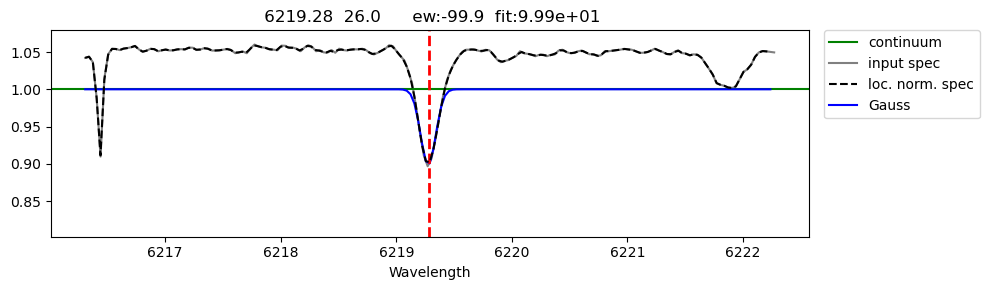

########################################
Writing to output file...

Moog entry:
    6219.28      26.0       2.2     -2.43                        -99.90 9.990e+01 


#####
 6230.722 26.0
line 6230.722  was detected and it was classified as a strong line
I see 8 line(s) in this range
          Gauss : EW = 59.08 fq = 0.000000 o-c: 0.000000
using an EW from Gauss


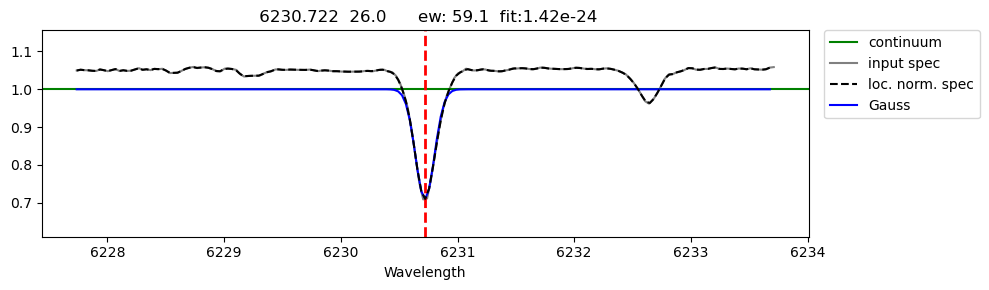

########################################
Writing to output file...

Moog entry:
   6230.722      26.0     2.557     -1.28                         59.08 1.423e-24 


#####
 6246.32 26.0
line 6246.32  was detected and it was classified as a strong line
I see 15 line(s) in this range
          Gauss : EW = 24.04 fq = 0.000000 o-c: 0.000000
using an EW from Gauss


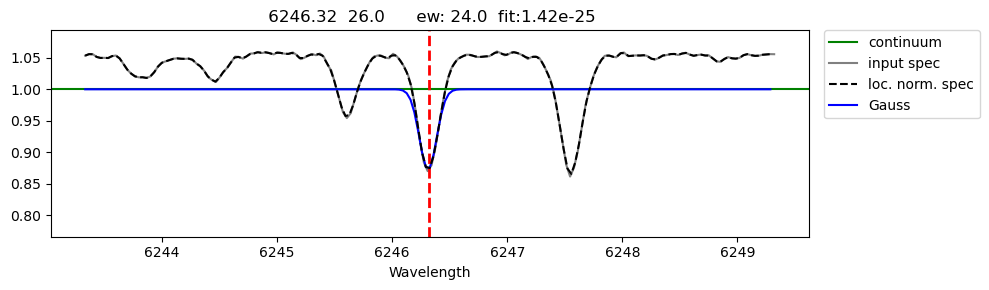

########################################
Writing to output file...

Moog entry:
    6246.32      26.0       3.6     -0.77                         24.04 1.417e-25 


#####
 6252.56 26.0
line 6252.56  was detected and it was classified as a strong line
I see 13 line(s) in this range
          Gauss : EW = 46.17 fq = 0.000000 o-c: 0.000066
using an EW from Gauss


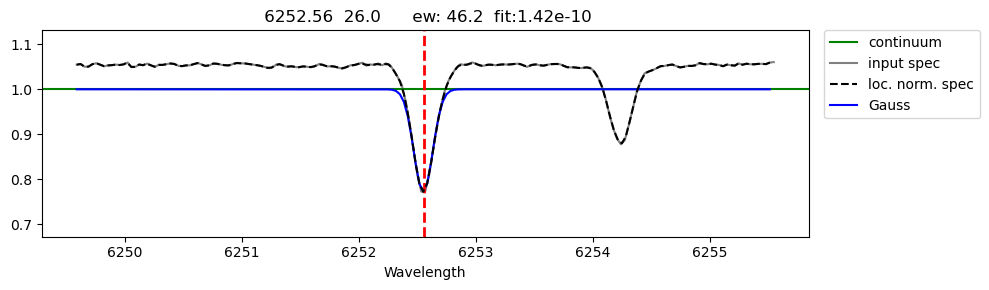

########################################
Writing to output file...

Moog entry:
    6252.56      26.0       2.4     -1.69                         46.17 1.416e-10 


#####
 6265.134 26.0
line 6265.134  was detected and it was classified as a strong line
I see 22 line(s) in this range
          Gauss : EW = 13.03 fq = 31.081590 o-c: 0.012975
using an EW from Gauss
Line is too strong or too weak


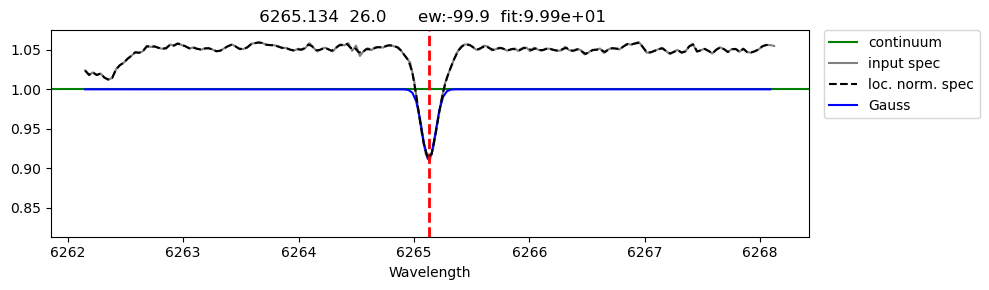

########################################
Writing to output file...

Moog entry:
   6265.134      26.0     2.174     -2.54                        -99.90 9.990e+01 


#####
 6301.5 26.0
line 6301.5  was detected and it was classified as a strong line
I see 5 line(s) in this range
          Gauss : EW = 21.26 fq = 0.000000 o-c: 0.000000
using an EW from Gauss


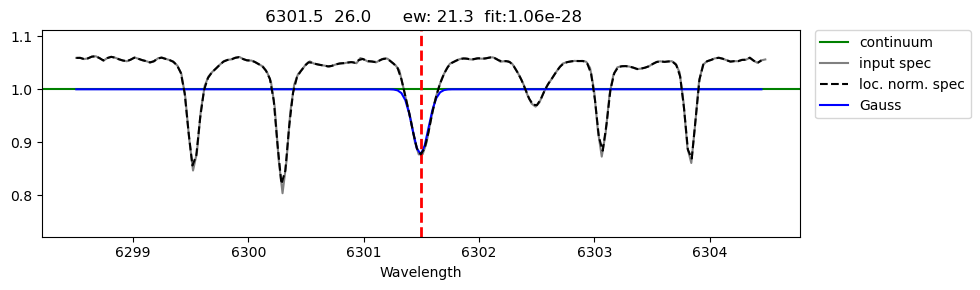

########################################
Writing to output file...

Moog entry:
     6301.5      26.0      3.65     -0.71                         21.26 1.061e-28 


#####
 6336.82 26.0
line 6336.82  was detected and it was classified as a strong line
I see 12 line(s) in this range
          Gauss : EW = 14.81 fq = 111.200896 o-c: 0.018185
using an EW from Gauss
Line is too strong or too weak


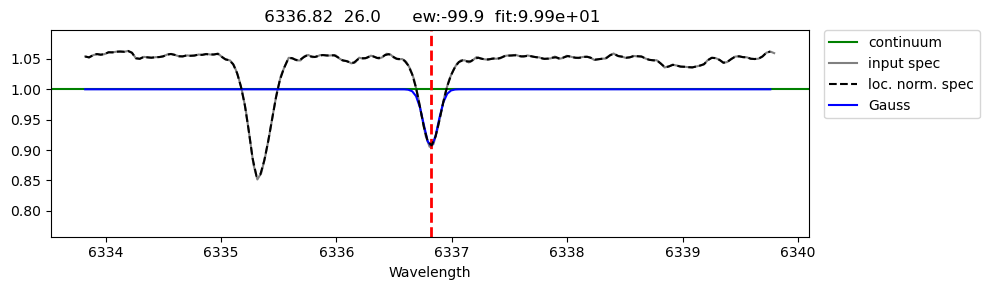

########################################
Writing to output file...

Moog entry:
    6336.82      26.0      3.69     -0.85                        -99.90 9.990e+01 


#####
 6408.02 26.0
line 6408.02  was detected and it was classified as a strong line
I see 22 line(s) in this range
          Gauss : EW = 9.72 fq = 214.503716 o-c: 0.011497
using an EW from Gauss
Line is too strong or too weak


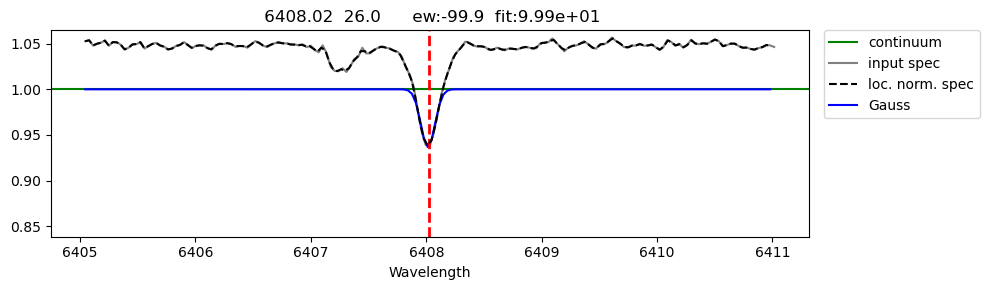

########################################
Writing to output file...

Moog entry:
    6408.02      26.0      3.69     -0.99                        -99.90 9.990e+01 


#####
 6411.65 26.0
line 6411.65  was detected and it was classified as a strong line
I see 14 line(s) in this range
          Gauss : EW = 31.63 fq = 0.000000 o-c: 0.000000
using an EW from Gauss


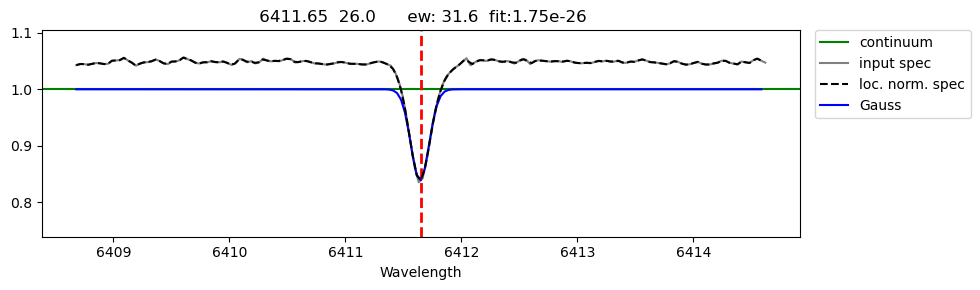

########################################
Writing to output file...

Moog entry:
    6411.65      26.0      3.65     -0.59                         31.63 1.750e-26 


#####
 6421.35 26.0
line 6421.35  was detected and it was classified as a strong line
I see 14 line(s) in this range
          Gauss : EW = 35.30 fq = 0.000000 o-c: 0.000000
using an EW from Gauss


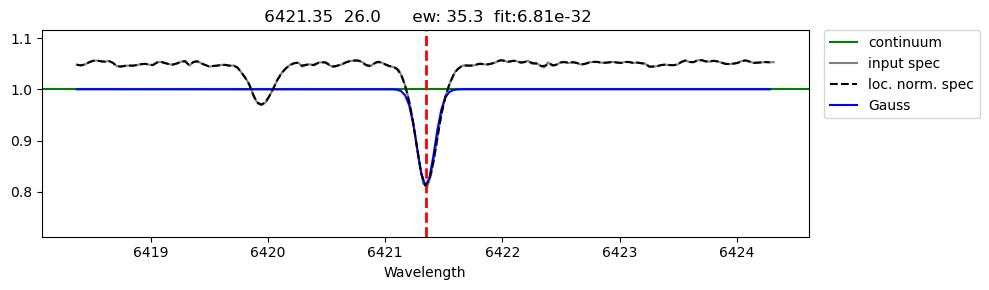

########################################
Writing to output file...

Moog entry:
    6421.35      26.0      2.28     -2.03                         35.30 6.810e-32 


#####
 6430.846 26.0
line 6430.846  was detected and it was classified as a strong line
I see 16 line(s) in this range
          Gauss : EW = 43.15 fq = 0.000000 o-c: 0.000000
using an EW from Gauss


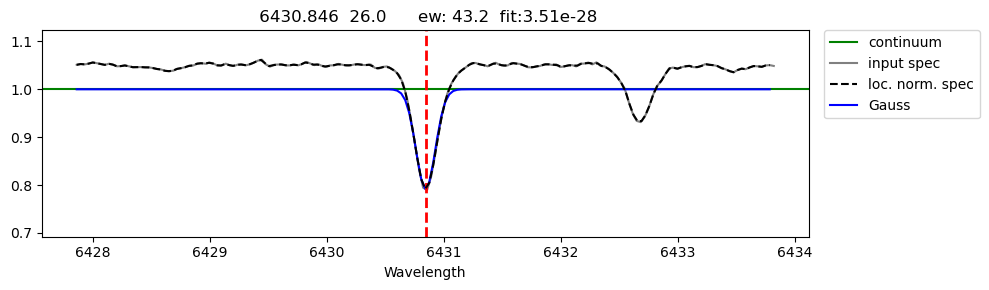

########################################
Writing to output file...

Moog entry:
   6430.846      26.0     2.174     -1.95                         43.15 3.510e-28 


#####
 6494.98 26.0
line 6494.98  was detected and it was classified as a strong line
I see 5 line(s) in this range
          Gauss : EW = 68.82 fq = 0.000000 o-c: 0.002449
using an EW from Gauss


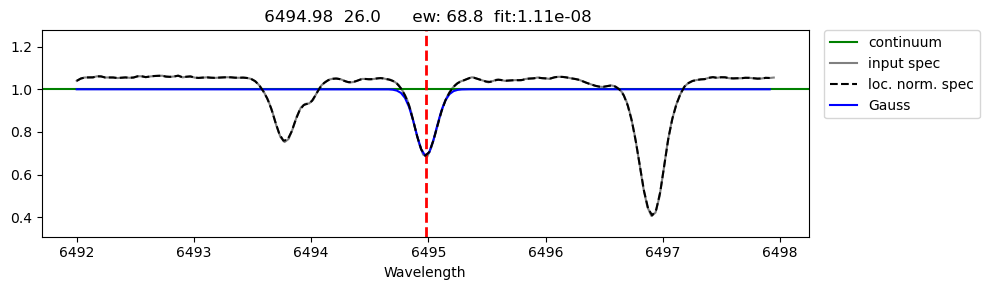

########################################
Writing to output file...

Moog entry:
    6494.98      26.0     2.402     -1.27                         68.82 1.108e-08 


#####
 6677.985 26.0
line 6677.985  was detected and it was classified as a strong line
I see 18 line(s) in this range
          Gauss : EW = 45.61 fq = 0.000000 o-c: 0.000000
using an EW from Gauss


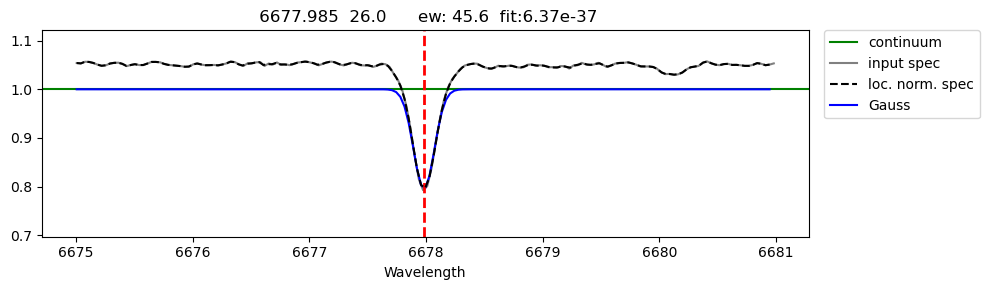

########################################
Writing to output file...

Moog entry:
   6677.985      26.0      2.69     -1.47                         45.61 6.369e-37 


#####
 6750.152 26.0
line 6750.152  was detected and it was classified as a strong line
I see 25 line(s) in this range
          Gauss : EW = 26.12 fq = 12806172319149130799638922761787914588708724234322394054414521503580160.000000 o-c: 0.010291
using an EW from Gauss


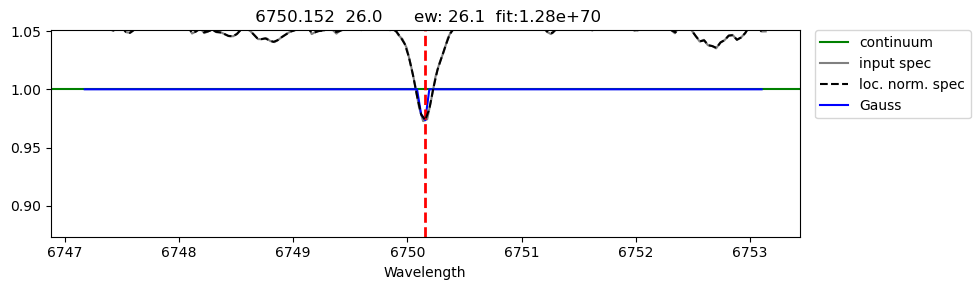

########################################
Writing to output file...

Moog entry:
   6750.152      26.0     2.422     -2.62                         26.12 1.281e+70 


#####
 6843.656 26.0
line 6843.656  was detected and it was classified as a strong line
I see 22 line(s) in this range
          Gauss : EW = 84.46 fq = 4874732303597762995208778504204733065490762709168558565452918966279571817627648.000000 o-c: 0.009440
using an EW from Gauss


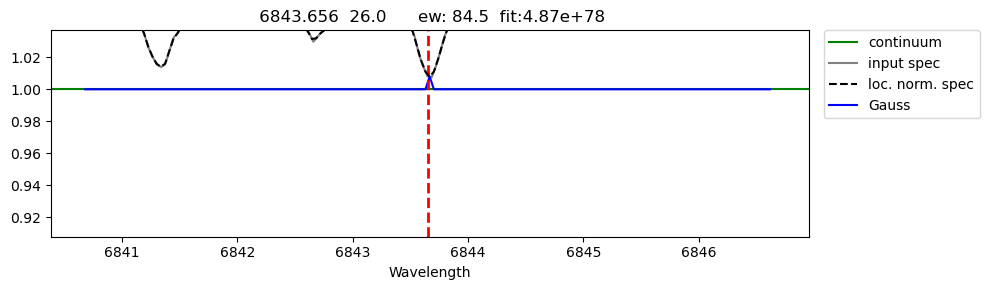

########################################
Writing to output file...

Moog entry:
   6843.656      26.0     4.549     -0.73                         84.46 4.875e+78 


#####
 7495.067 26.0
line 7495.067  was detected and it was classified as a strong line
I see 21 line(s) in this range
          Gauss : EW = 28.40 fq = 5.649424 o-c: 0.012653
using an EW from Gauss


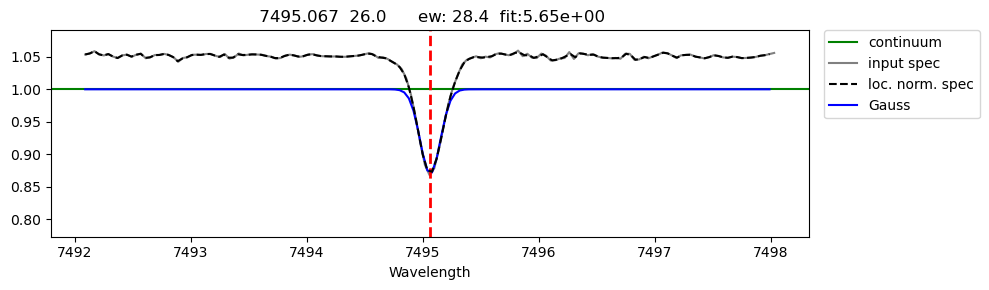

########################################
Writing to output file...

Moog entry:
   7495.067      26.0      4.22      -0.1                         28.40 5.649e+00 


#####
 7511.021 26.0
line 7511.021  was detected and it was classified as a strong line
I see 14 line(s) in this range
          Gauss : EW = 41.26 fq = 0.871324 o-c: 0.013707
using an EW from Gauss


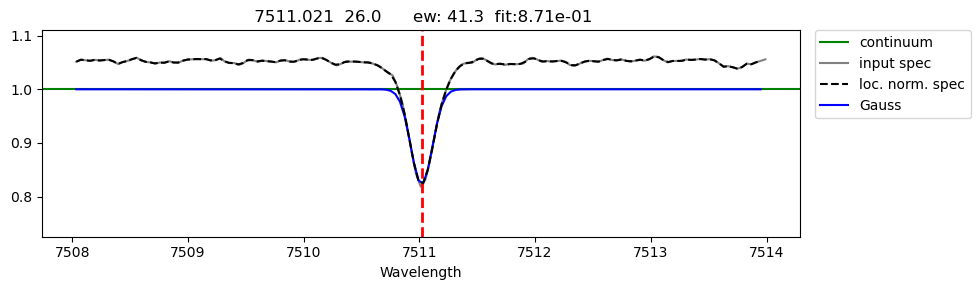

########################################
Writing to output file...

Moog entry:
   7511.021      26.0     4.175      0.12                         41.26 8.713e-01 


#####
 7568.9 26.0
line 7568.9  was detected and it was classified as a strong line
I see 23 line(s) in this range
          Gauss : EW = 51.01 fq = 49735103795344878983026903897763830296385842470567684419676231781459021430406994306623602688.000000 o-c: 0.008600
using an EW from Gauss


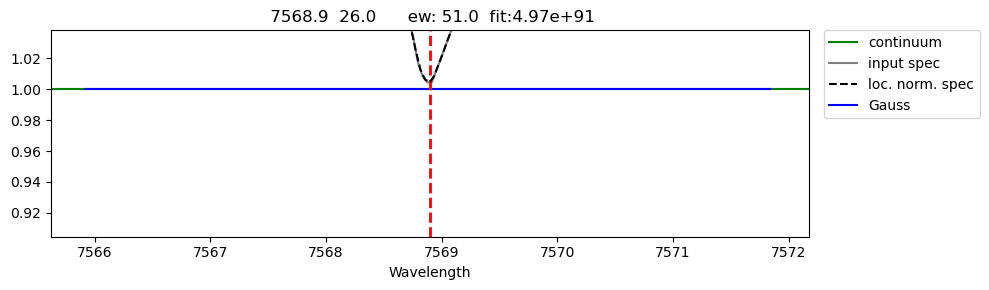

########################################
Writing to output file...

Moog entry:
     7568.9      26.0      4.28     -0.88                         51.01 4.974e+91 


#####
 8220.379 26.0
line 8220.379  was detected and it was classified as a strong line
I see 4 line(s) in this range
          Gauss : EW = 45.79 fq = 0.000000 o-c: 0.000508
using an EW from Gauss


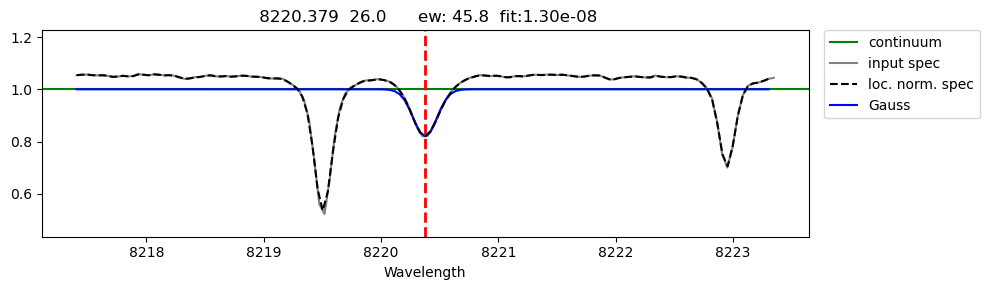

########################################
Writing to output file...

Moog entry:
   8220.379      26.0     4.317       0.3                         45.79 1.296e-08 


#####
 8688.624 26.0
line 8688.624  was detected and it was classified as a strong line
I see 5 line(s) in this range
          Gauss : EW = 97.71 fq = 0.000000 o-c: 0.000312
using an EW from Gauss


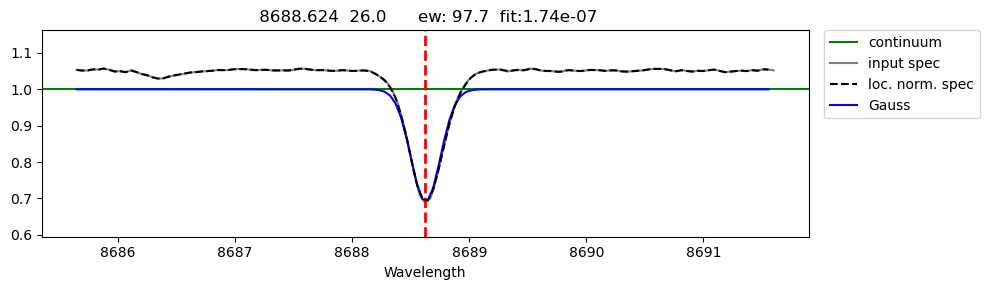

########################################
Writing to output file...

Moog entry:
   8688.624      26.0     2.174      -1.2                         97.71 1.741e-07 


#####
 4178.854 26.1
line 4178.854  was detected and it was classified as a strong line
I see 8 line(s) in this range
          Gauss : EW = 94.49 fq = 0.000000 o-c: 0.016737
using an EW from Gauss


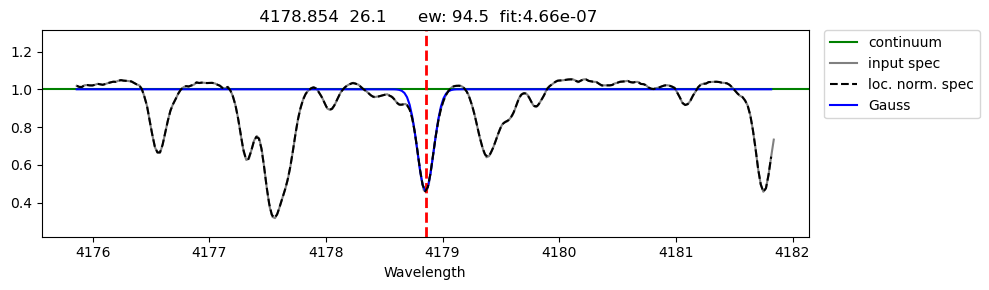

########################################
Writing to output file...

Moog entry:
   4178.854      26.1     2.583     -2.44                         94.49 4.655e-07 


#####
 4233.163 26.1
line 4233.163  was detected and it was classified as a strong line
I see 11 line(s) in this range
          Gauss : EW = 130.77 fq = 0.000000 o-c: 0.001718
using an EW from Gauss


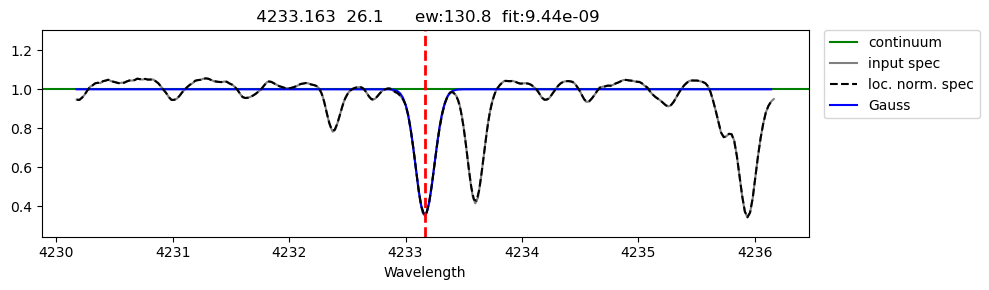

########################################
Writing to output file...

Moog entry:
   4233.163      26.1     2.583     -1.81                        130.77 9.443e-09 


#####
 4491.4 26.1
line 4491.4  was detected and it was classified as a strong line
I see 7 line(s) in this range
          Gauss : EW = 62.41 fq = 0.000000 o-c: 0.000562
using an EW from Gauss


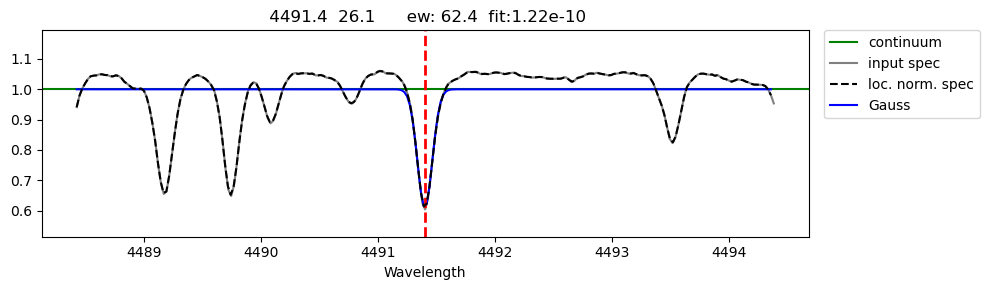

########################################
Writing to output file...

Moog entry:
     4491.4      26.1     2.856     -2.64                         62.41 1.224e-10 


#####
 4515.334 26.1
line 4515.334  was detected and it was classified as a strong line
I see 4 line(s) in this range
          Gauss : EW = 78.73 fq = 0.000000 o-c: 0.001687
using an EW from Gauss


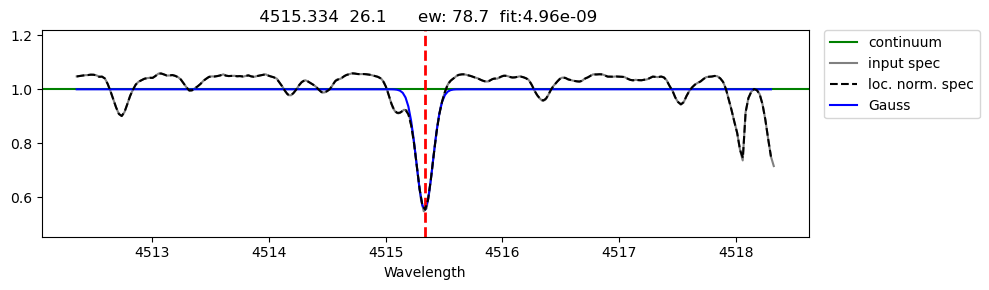

########################################
Writing to output file...

Moog entry:
   4515.334      26.1     2.844     -2.36                         78.73 4.963e-09 


#####
 4555.888 26.1
line 4555.888  was detected and it was classified as a strong line
I see 10 line(s) in this range
          Gauss : EW = 91.24 fq = 0.000022 o-c: 0.016224
using an EW from Gauss


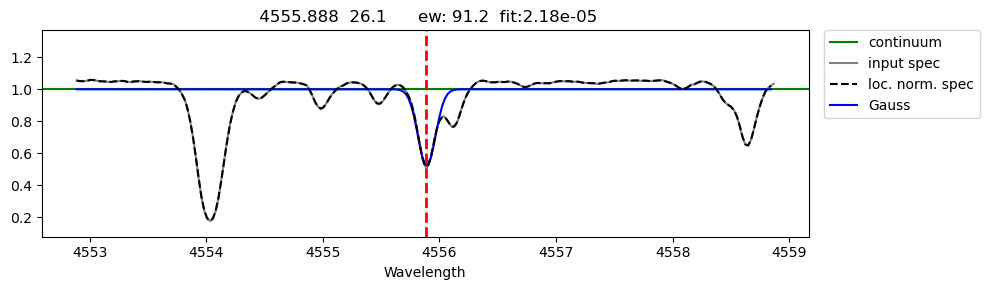

########################################
Writing to output file...

Moog entry:
   4555.888      26.1     2.828     -2.25                         91.24 2.177e-05 


#####
 4576.328 26.1
line 4576.328  was detected and it was classified as a strong line
I see 5 line(s) in this range
          Gauss : EW = 49.22 fq = 0.000000 o-c: 0.000346
using an EW from Gauss


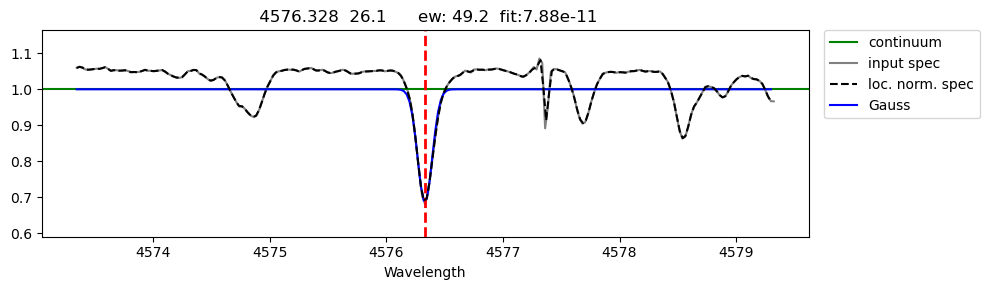

########################################
Writing to output file...

Moog entry:
   4576.328      26.1     2.844     -2.92                         49.22 7.879e-11 


#####
 4582.835 26.1
line 4582.835  was detected and it was classified as a strong line
I see 9 line(s) in this range
          Gauss : EW = 36.28 fq = 0.000000 o-c: 0.004888
using an EW from Gauss


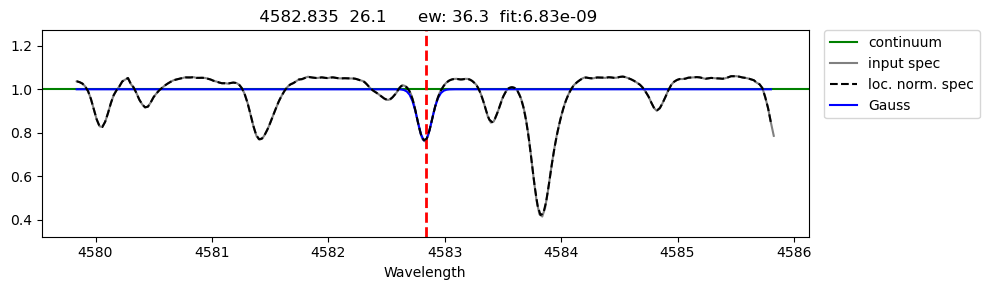

########################################
Writing to output file...

Moog entry:
   4582.835      26.1     2.844     -3.06                         36.28 6.830e-09 


#####
 4583.829 26.1
line 4583.829  was detected and it was classified as a strong line
I see 9 line(s) in this range
          Gauss : EW = 118.95 fq = 0.000000 o-c: 0.002449
using an EW from Gauss


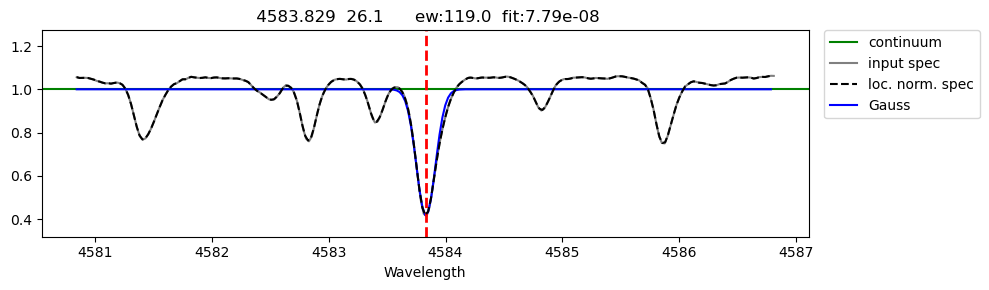

########################################
Writing to output file...

Moog entry:
   4583.829      26.1     2.807     -1.74                        118.95 7.793e-08 


#####
 4620.513 26.1
line 4620.513  was detected and it was classified as a strong line
I see 17 line(s) in this range
          Gauss : EW = 27.65 fq = 0.000000 o-c: 0.000067
using an EW from Gauss


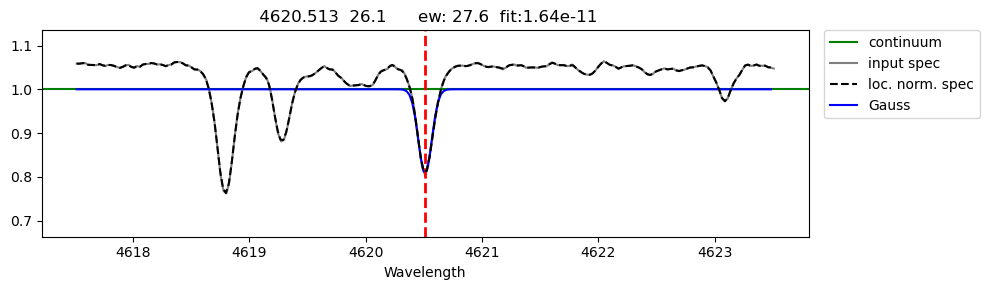

########################################
Writing to output file...

Moog entry:
   4620.513      26.1     2.828     -3.19                         27.65 1.639e-11 


#####
 4629.332 26.1
line 4629.332  was detected and it was classified as a strong line
I see 7 line(s) in this range
          Gauss : EW = 84.74 fq = 0.000000 o-c: 0.000528
using an EW from Gauss


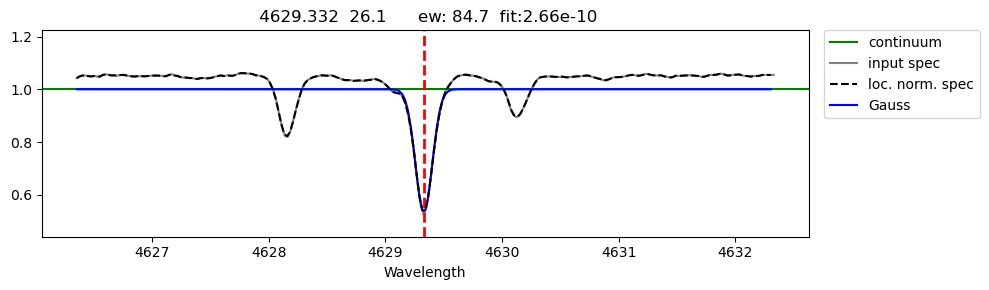

########################################
Writing to output file...

Moog entry:
   4629.332      26.1     2.807     -2.26                         84.74 2.659e-10 


#####
 4731.439 26.1
line 4731.439  was detected and it was classified as a strong line
I see 6 line(s) in this range
          Gauss : EW = 41.89 fq = 0.000000 o-c: 0.000010
using an EW from Gauss


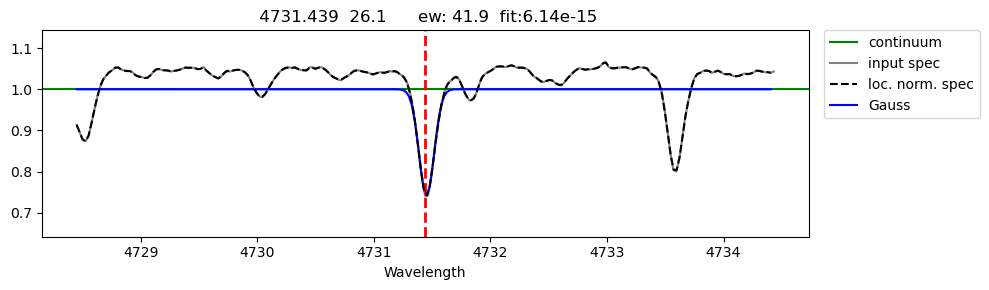

########################################
Writing to output file...

Moog entry:
   4731.439      26.1     2.891      -3.1                         41.89 6.141e-15 


#####
 5197.568 26.1
line 5197.568  was detected and it was classified as a strong line
I see 8 line(s) in this range
          Gauss : EW = 73.21 fq = 0.000000 o-c: 0.001158
using an EW from Gauss


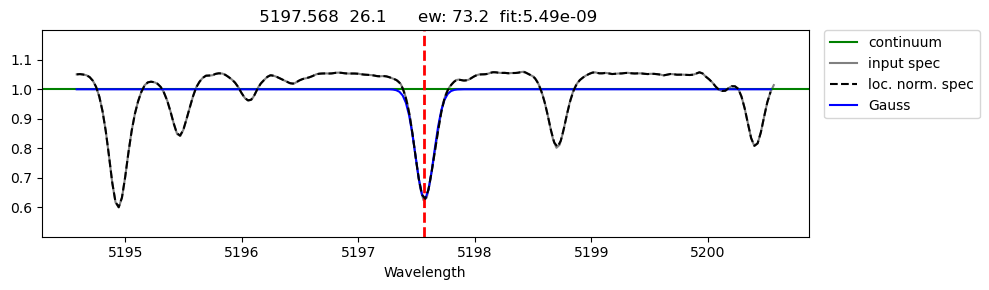

########################################
Writing to output file...

Moog entry:
   5197.568      26.1      3.23     -2.05                         73.21 5.491e-09 


#####
 5234.624 26.1
line 5234.624  was detected and it was classified as a strong line
I see 6 line(s) in this range
          Gauss : EW = 74.87 fq = 0.000000 o-c: 0.001082
using an EW from Gauss


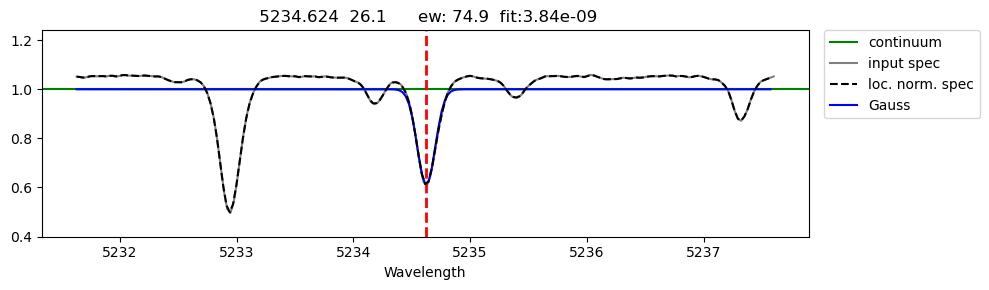

########################################
Writing to output file...

Moog entry:
   5234.624      26.1     3.221     -2.21                         74.87 3.841e-09 


#####
 5275.997 26.1
line 5275.997  was detected and it was classified as a strong line
I see 5 line(s) in this range
          Gauss : EW = 86.80 fq = 0.000000 o-c: 0.000197
using an EW from Gauss


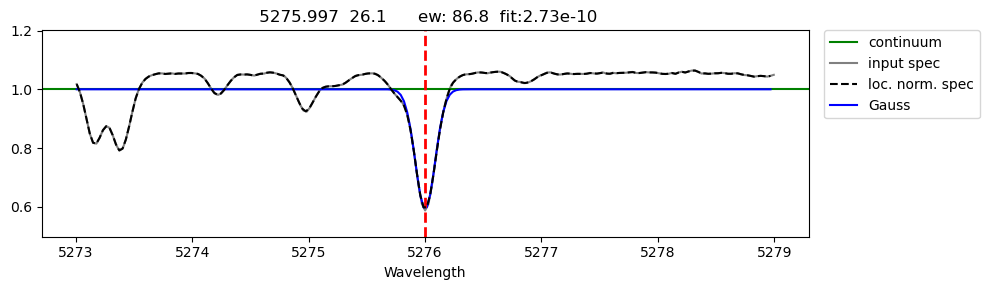

########################################
Writing to output file...

Moog entry:
   5275.997      26.1     3.199      -1.9                         86.80 2.733e-10 


#####
 5325.543 26.1
I see this line at 5325.543 , but it is weak
I see 3 line(s) in this range
          Gauss : EW = 16.79 fq = 0.000002 o-c: 0.009981
using an EW from Gauss
Line is too strong or too weak


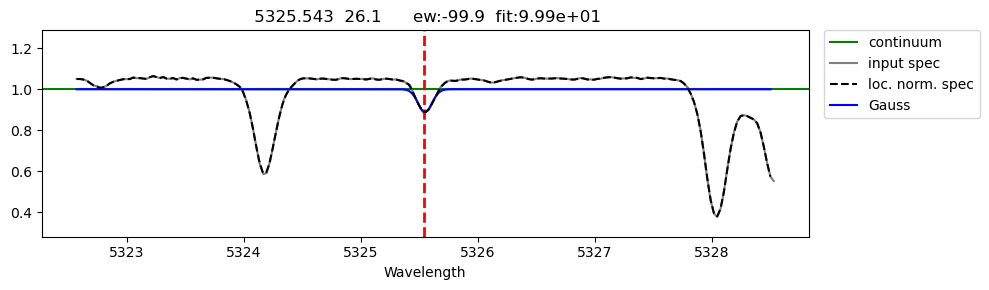

########################################
Writing to output file...

Moog entry:
   5325.543      26.1     3.221     -3.26                        -99.90 9.990e+01 


#####
 5534.839 26.1
line 5534.839  was detected and it was classified as a strong line
I see 18 line(s) in this range
          Gauss : EW = 38.44 fq = 0.138162 o-c: 0.014721
using an EW from Gauss


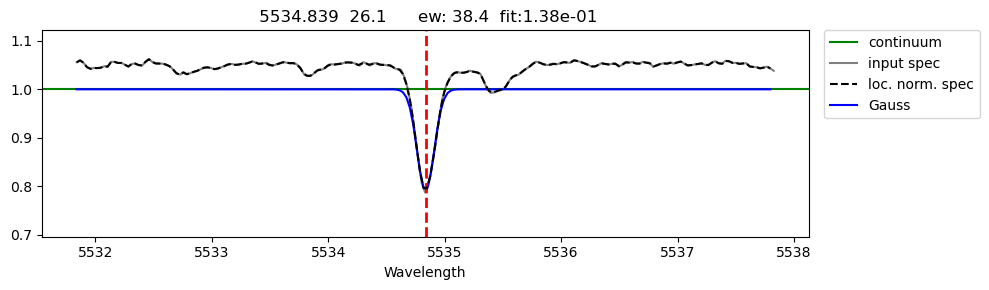

########################################
Writing to output file...

Moog entry:
   5534.839      26.1     3.245      -2.9                         38.44 1.382e-01 


#####
 6247.559 26.1
line 6247.559  was detected and it was classified as a strong line
I see 18 line(s) in this range
          Gauss : EW = 23.78 fq = 0.000000 o-c: 0.000000
using an EW from Gauss


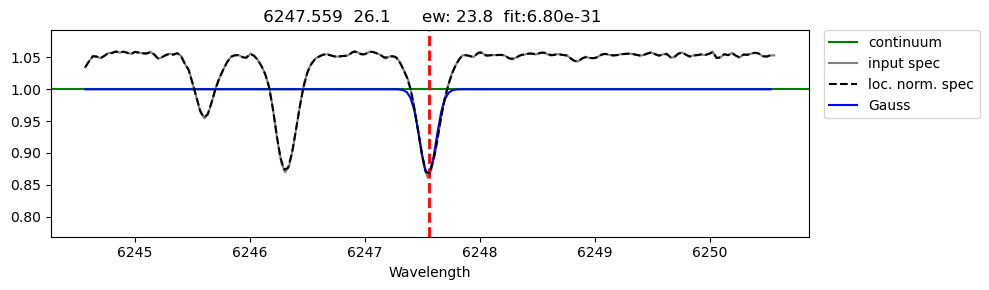

########################################
Writing to output file...

Moog entry:
   6247.559      26.1     3.892      -2.4                         23.78 6.805e-31 


#####
 6432.677 26.1
line 6432.677  was detected and it was classified as a strong line
I see 16 line(s) in this range
          Gauss : EW = 11.12 fq = 0.000000 o-c: 0.000000
using an EW from Gauss
Line is too strong or too weak


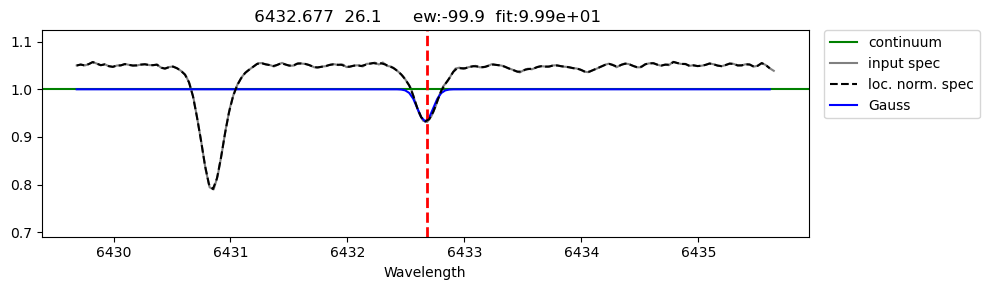

########################################
Writing to output file...

Moog entry:
   6432.677      26.1     2.891      -3.5                        -99.90 9.990e+01 


#####
 6456.381 26.1
line 6456.381  was detected and it was classified as a strong line
I see 18 line(s) in this range
          Gauss : EW = 35.76 fq = 0.000000 o-c: 0.000000
using an EW from Gauss


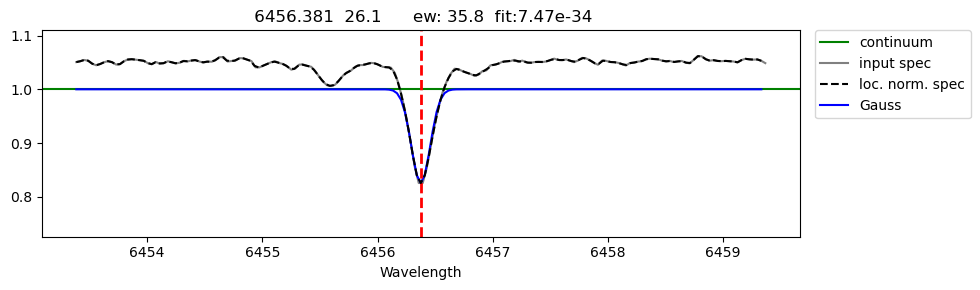

########################################
Writing to output file...

Moog entry:
   6456.381      26.1     3.903      -2.2                         35.76 7.473e-34 


#####
 6516.077 26.1
line 6516.077  was detected and it was classified as a strong line
I see 9 line(s) in this range
          Gauss : EW = 25.21 fq = 0.000000 o-c: 0.000000
using an EW from Gauss


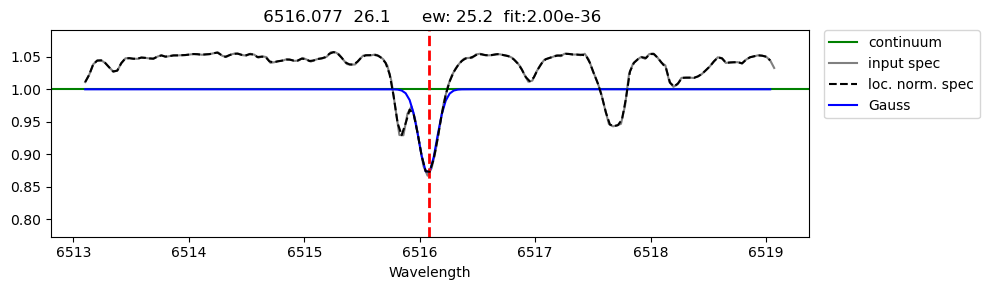

########################################
Writing to output file...

Moog entry:
   6516.077      26.1     2.891     -3.37                         25.21 2.005e-36 



In [40]:
# Call main function
run_pyew(config, line_list, flist)

### Optionally: Create linelist with only good lines for this star
(saves time for future rerunning)

In [41]:
pyew_out_file = f'{pyew_output_dir}/{output_name}'
line_list_file = f'{pyEW_dir}/PYEW_INPUT/Fe_linemake_v2.linelist'

###OPTION ONE: remove bad lines################################
ignored_lines = find_lines_ignored_for_moog_entry(pyew_out_file) # lines with -99.90 moog entry
bad_lines = ignored_lines + [3824.444,3820.425, 3878.018, 4005.242, 4021.866, 4032.627, 4045.812, 4156.799, 4199.095]
filtered_lines = filter_linelist(line_list_file, bad_lines, 'b')
################################################################

###OPTION TWO: retain only good lines###########################
  ##Manually input the wavelength:
#good_lines = []
  ##Or point this function to the file with your best lines for this object:
#file_path = f'{pyew_output_dir}/{star_id}/moog_Fe_good_lines_{star_id}.linelist_{star_id}_FINAL.out' #your file path

#good_lines = get_lines(file_path)
#filtered_lines = filter_linelist(line_list_file, good_lines, 'g') 
##################################################################


filtered_line_list_file = f'{pyEW_dir}/PYEW_INPUT/Fe_good_lines_{star_id}.linelist'
write_filtered_linelist(filtered_lines, filtered_line_list_file)

### Clean  pyEW output file (used as MOOG input): 
#### Option one: remove poorly fitted lines 
#### Option two: retain only good lines and remove the rest

In [42]:
pyew_out_file = f'{pyew_output_dir}/{output_name}'
fit_lines_dir = f'{pyew_output_dir}/fit_lines'

###OPTION ONE:
#remove_lines(pyew_out_file, fit_lines_dir, bad_lines) 

###OPTION TWO:
#keep_good_lines(pyew_out_file, fit_lines_dir, good_lines)

## Combine well-fitted individual line plots into a single .png image. You can find it in PYEW_OUTPUT/fit_lines.
#combined_filename = f'combined_fit_Fe_lines_{star_id}.png'
combined_filename = f'combined_fit_Fe_lines_{base_name}{suffix}.png'
combine_png_files(fit_lines_dir, combined_filename)

#### Fit the lines using different continuum renormalizations/scaling (i.e., different divisors) and select the best measurements. Store these measurements in the separate pyew_out_file

In [43]:
source_dir = pyew_output_dir# fit_lines_dir pyew_output_dir

destination_dir = os.path.join(source_dir, star_id)
os.makedirs(destination_dir, exist_ok=True)

for item in os.listdir(source_dir):
    source_item = os.path.join(source_dir, item)
    if os.path.isfile(source_item) and star_id in item:
        destination_file = os.path.join(destination_dir, item)
        shutil.move(source_item, destination_file)

print(f"All files containing '{star_id}' in their name in {source_dir} have been moved to the folder '{star_id}'.")

All files containing 'HD222925' in their name in /arc5/home/dariazaremba/PY_LOOPER/pyEW_modified/PYEW_OUTPUT have been moved to the folder 'HD222925'.


# 2. Run MOOG to get Fe abundances

For running MOOG we are using q<sup>2</sup> Python package by [Ramirez et al. 2014, A&A, 572, A48](https://www.aanda.org/articles/aa/full_html/2014/12/aa24244-14/aa24244-14.html)
.

In [47]:
import os
import csv
import matplotlib.pyplot as plt
import pandas as pd
os.chdir(moog_dir)


import q2
from data_processing_utils import *

### Create two csv files needed for $q^2$: one containing star data and the other containing lines data

In [50]:
###PROVIDE THE NAME OF THE FINAL pyew_out_file WITH FINAL EW MEASUREMENTS:
pyew_out_file = f'{pyew_output_dir}/{star_id}/moog_Fe_linemake.linelist_HD222925_normrv_FINAL.out'
#pyew_out_file = f'{pyew_output_dir}/{star_id}/{output_name}'


stars_data = [{'id': star_id, 'teff': Teff, 'logg': logg, 'feh': feh, 'vt': vt}]

write_stars_csv(stars_data)
write_lines_csv(pyew_out_file, star_id)

### Get model atmosphere for the star

In [53]:
data = q2.Data('stars.csv', 'lines.csv')
star = q2.Star(star_id) # creates the star object
star.get_data_from(data) # asigns the attributes to the star's object
star.get_model_atmosphere('marcs') # gets MARCS model atmosphere for the star
print(star)


md = q2.moog.Driver()
md.create_file() #Creates a simple MOOGSILENT abfind driver
q2.moog.create_model_in(star) #creates the model atmosphere file
q2.moog.create_lines_in(star); #creates the linelist file


ERROR:q2.star:Star data file not found.
ERROR:q2.star:Lines file not found.
ERROR:q2.star:Star 'HD222925' not found in data object.
ERROR:q2.star:To create model atmosphere, star must have all three fundamental parameters: Teff, logg, and [Fe/H].
ERROR:q2.moog:No model data to write to moog model_in file.


Star object named 'HD222925':
  Teff (K) = None, logg [cgs] = None, [Fe/H] = None, vt (km/s) = None
  Spectral lines = None (species: None)
  Model atmosphere: None


AttributeError: 'Star' object has no attribute 'linelist'

### Run MOOG to obtain FeI and FeII abundances from pyEWs

In [48]:
q2.moog.abfind(star, 26.0, 'fe1')

True

In [49]:
q2.moog.abfind(star, 26.1, 'fe2')

True

### Write the abundances to the MOOG_OUTPUT file

In [50]:
moog_out_path = f'{moog_dir}/MOOG_OUTPUT_{star_id}_{Teff}_{logg}_{feh}_{vt}'
os.makedirs(moog_out_path, exist_ok=True)

id_feI = 26.0
id_feII = 26.1

combined_output_file = 'moog_out_fe.csv'

with open(f'{moog_out_path}/{combined_output_file}', 'w', newline='') as csvfile:
    writer = csv.writer(csvfile)
    
    # Write Fe I data
    header_feI = ['id'] + list(star.fe1.keys()) 
    writer.writerow(header_feI)
    for i in range(len(star.fe1['ww'])):
        row = [id_feI] + [star.fe1[key][i] for key in star.fe1.keys()]
        writer.writerow(row)

    # Write Fe II data
    for i in range(len(star.fe2['ww'])):
        row = [id_feII] + [star.fe2[key][i] for key in star.fe2.keys()]
        writer.writerow(row)


### Make some diagnostic plots

<IPython.core.display.Javascript object>


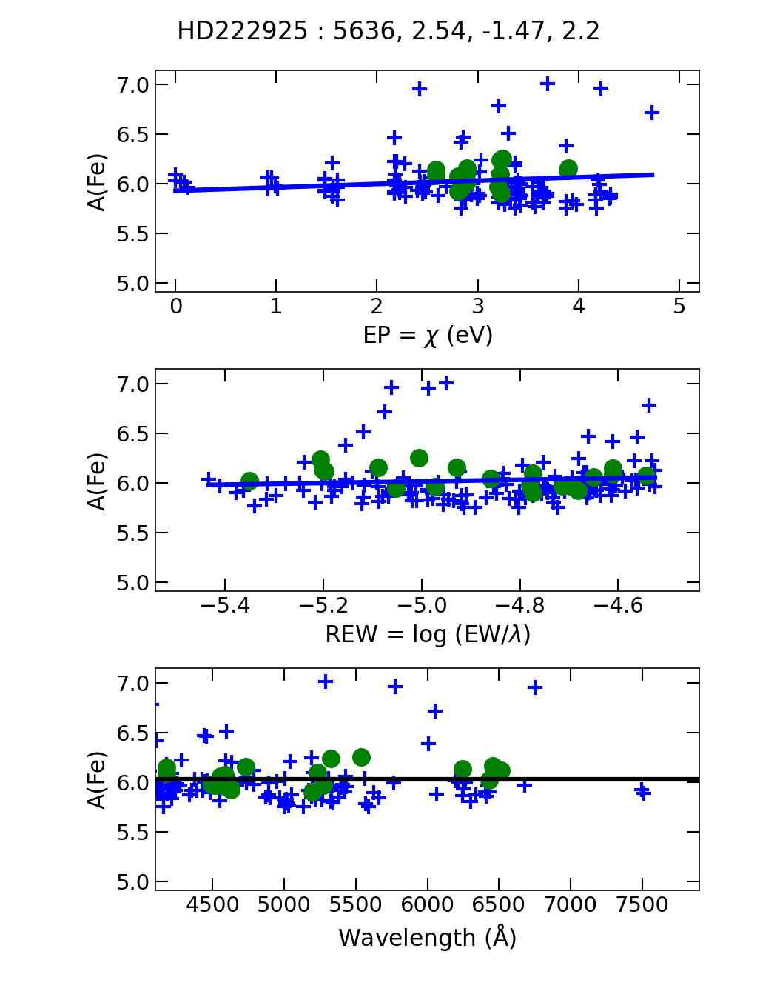

A(Fe I)  = 6.025 +/- 0.297
A(Fe II) = 6.062 +/- 0.102
A(FeI) vs. EP slope  = 0.0341 +/- 0.0252
A(FeI) vs. REW slope = 0.0819 +/- 0.1061


In [51]:
%matplotlib nbagg
q2.specpars.iron_stats(star, plot=f'{moog_out_path}/diagnostic_plots')
print("A(Fe I)  = {0:5.3f} +/- {1:5.3f}".\
      format(star.iron_stats['afe1'], star.iron_stats['err_afe1']))
print("A(Fe II) = {0:5.3f} +/- {1:5.3f}".\
      format(star.iron_stats['afe2'], star.iron_stats['err_afe2']))
print("A(FeI) vs. EP slope  = {0:.4f} +/- {1:.4f}".\
      format(star.iron_stats['slope_ep'], star.iron_stats['err_slope_ep']))
print("A(FeI) vs. REW slope = {0:.4f} +/- {1:.4f}".\
      format(star.iron_stats['slope_rew'], star.iron_stats['err_slope_rew']))

#### Fancy plot:
(useful for dealing with individual data point)

In [52]:
%matplotlib nbagg
q2.specpars.fancy_ironstats_plot(star)

Loading BokehJS ...

## Apply additional filtering, if needed

In [53]:
moog_df = pd.read_csv(f'{moog_out_path}/{combined_output_file}')

#In case you did not filter out the lines based on EW in the first part, or if you want to narrow down the EW range even further.
lower_ew_threshold = 20.0  #None
upper_ew_threshold = 140.0 #None
ep_threshold = 1.4 #None

filtered_moog_df = filter_moog_output(moog_df, lower_ew_threshold, upper_ew_threshold, ep_threshold)
filtered_moog_df.to_csv(f'{moog_out_path}/moog_out_fe_filtered.csv', index=False) 

print(f'Initial number of lines: {len(moog_df)},\n'
      f'Number of lines after filtering: {len(filtered_moog_df)}')

Initial number of lines: 162,
Number of lines after filtering: 152


In [85]:
#Optionally: remove outliers with abs(delavg) >=delavg_threshold
delavg_threshold = 0.5
moog_out_file = f'{moog_out_path}/moog_out_fe_filtered.csv'
output_file = f'{moog_out_path}/moog_out_fe_filtered.csv'

filtered_moog_df = remove_outliers(delavg_threshold, moog_out_file, output_file)
filtered_moog_df.to_csv(output_file, index=False) 

After removing outliers, there are 138 lines remaining.


In [86]:
#Update lines.csv file
lines_df = pd.read_csv('lines.csv')
lines_df['wavelength'] = pd.to_numeric(lines_df['wavelength'], errors='coerce')

filtered_lines_df = lines_df[lines_df['wavelength'].isin(filtered_moog_df['ww'])]
filtered_lines_df.to_csv('lines.csv', index=False)

## Update stellar parameters

* Adjust **Teff** to flatten the A(Fe) vs. EP slope.
* Adjust **vt** to flatten the A(Fe) vs. REW slope.

In [87]:
print(f'Current stellar parameters:\nTeff = {Teff}\nlogg = {logg}\nfeh = {feh}\nvt = {vt}')

Current stellar parameters:
Teff = 5636
logg = 2.54
feh = -1.47
vt = 2.2


In [24]:
Teff = 5640
#logg = 
#feh = 
vt = 2.3

In [88]:
stars_data = [{'id': star_id, 'teff': Teff, 'logg': logg, 'feh': feh, 'vt': vt}]

write_stars_csv(stars_data)

In [89]:
data = q2.Data('stars.csv', 'lines.csv')
star = q2.Star(star_id) # creates the star object
star.get_data_from(data) # asigns the attributes to the star's object
star.get_model_atmosphere('marcs') # gets MARCS model atmosphere for the star
print(star)


md = q2.moog.Driver()
md.create_file() #Creates a simple MOOGSILENT abfind driver
q2.moog.create_model_in(star) #creates the model atmosphere file
q2.moog.create_lines_in(star); #creates the linelist file


Star object named 'HD222925':
  Teff (K) = 5636, logg [cgs] = 2.54, [Fe/H] = -1.47, vt (km/s) = 2.2
  Spectral lines = 138 (species: 26.0,26.1)
  Model atmosphere: marcs


In [90]:
q2.moog.abfind(star, 26.0, 'fe1')

True

In [91]:
q2.moog.abfind(star, 26.1, 'fe2')

True

<IPython.core.display.Javascript object>


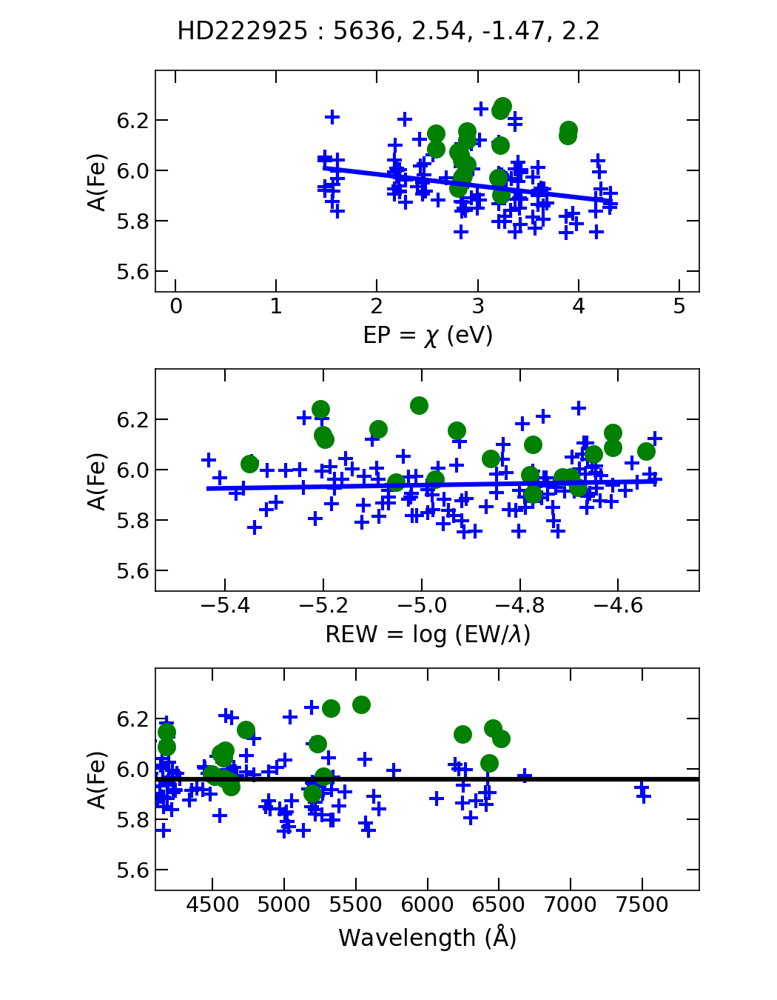

A(Fe I)  = 5.940 +/- 0.102
A(Fe II) = 6.062 +/- 0.102
A(FeI) vs. EP slope  = -0.0462 +/- 0.0119
A(FeI) vs. REW slope = 0.0311 +/- 0.0408


In [92]:
%matplotlib nbagg
q2.specpars.iron_stats(star, plot=f'{moog_out_path}/diagnostic_plots_filtered_new_par')
print("A(Fe I)  = {0:5.3f} +/- {1:5.3f}".\
    format(star.iron_stats['afe1'], star.iron_stats['err_afe1']))


print("A(Fe II) = {0:5.3f} +/- {1:5.3f}".\
    format(star.iron_stats['afe2'], star.iron_stats['err_afe2']))

print("A(FeI) vs. EP slope  = {0:.4f} +/- {1:.4f}".\
    format(star.iron_stats['slope_ep'], star.iron_stats['err_slope_ep']))

print("A(FeI) vs. REW slope = {0:.4f} +/- {1:.4f}".\
    format(star.iron_stats['slope_rew'], star.iron_stats['err_slope_rew']))

### Create new MOOG_OUTPUT directory with adjusted parameters

<IPython.core.display.Javascript object>


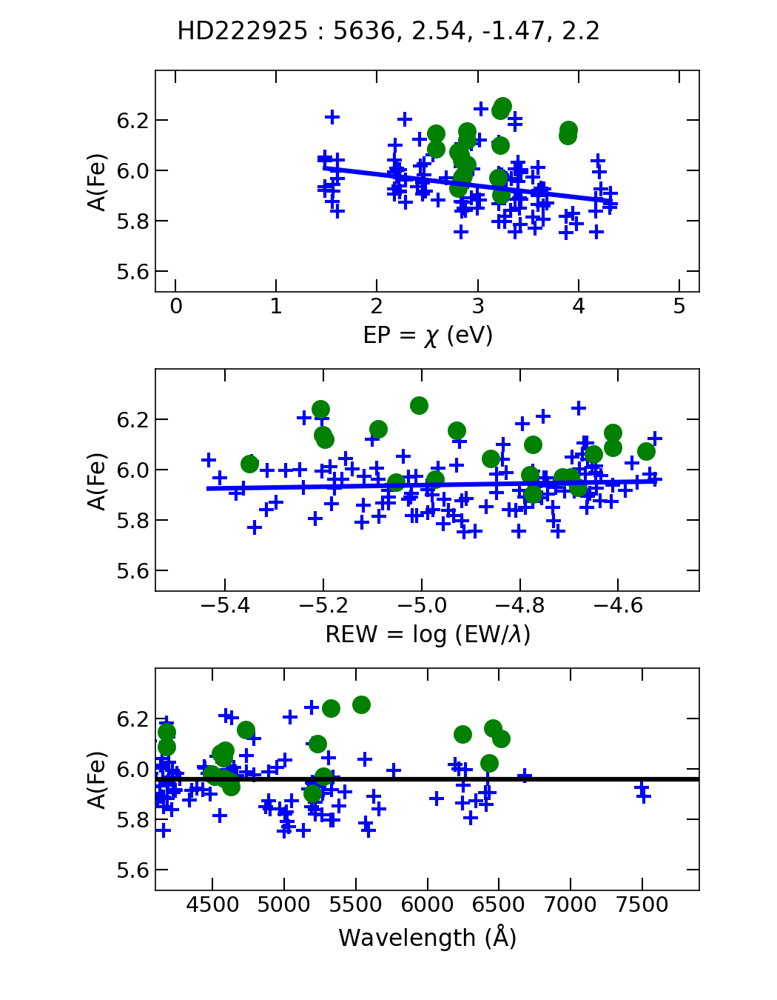

In [93]:
moog_out_path_upd = f'{moog_dir}/MOOG_OUTPUT_{star_id}_{Teff}_{logg}_{feh}_{vt}'
os.makedirs(moog_out_path_upd, exist_ok=True)

id_feI = 26.0
id_feII = 26.1

combined_output_file = 'moog_out_fe.csv'

with open(f'{moog_out_path_upd}/{combined_output_file}', 'w', newline='') as csvfile:
    writer = csv.writer(csvfile)
    
    # Write Fe I data
    header_feI = ['id'] + list(star.fe1.keys()) 
    writer.writerow(header_feI)
    for i in range(len(star.fe1['ww'])):
        row = [id_feI] + [star.fe1[key][i] for key in star.fe1.keys()]
        writer.writerow(row)

    # Write Fe II data
    for i in range(len(star.fe2['ww'])):
        row = [id_feII] + [star.fe2[key][i] for key in star.fe2.keys()]
        writer.writerow(row)

q2.specpars.iron_stats(star, plot=f'{moog_out_path_upd}/diagnostic_plots')

In [94]:
delavg_threshold = 0.4
moog_out_file = f'{moog_out_path_upd}/moog_out_fe.csv'
output_file = f'{moog_out_path_upd}/moog_out_fe_filtered.csv'

filtered_moog_df = remove_outliers(delavg_threshold, moog_out_file, output_file)
filtered_moog_df.to_csv(output_file, index=False) 

lines_df = pd.read_csv('lines.csv')
lines_df['wavelength'] = pd.to_numeric(lines_df['wavelength'], errors='coerce')

filtered_lines_df = lines_df[lines_df['wavelength'].isin(filtered_moog_df['ww'])]
filtered_lines_df.to_csv('lines.csv', index=False)

data = q2.Data('stars.csv', 'lines.csv')
star = q2.Star(star_id) # creates the star object
star.get_data_from(data) # asigns the attributes to the star's object
star.get_model_atmosphere('marcs') # gets MARCS model atmosphere for the star
print(star)


md = q2.moog.Driver()
md.create_file() #Creates a simple MOOGSILENT abfind driver
q2.moog.create_model_in(star) #creates the model atmosphere file
q2.moog.create_lines_in(star); #creates the linelist file

After removing outliers, there are 138 lines remaining.
Star object named 'HD222925':
  Teff (K) = 5636, logg [cgs] = 2.54, [Fe/H] = -1.47, vt (km/s) = 2.2
  Spectral lines = 138 (species: 26.0,26.1)
  Model atmosphere: marcs


In [95]:
q2.moog.abfind(star, 26.0, 'fe1')

True

In [96]:
q2.moog.abfind(star, 26.1, 'fe2')

True

<IPython.core.display.Javascript object>


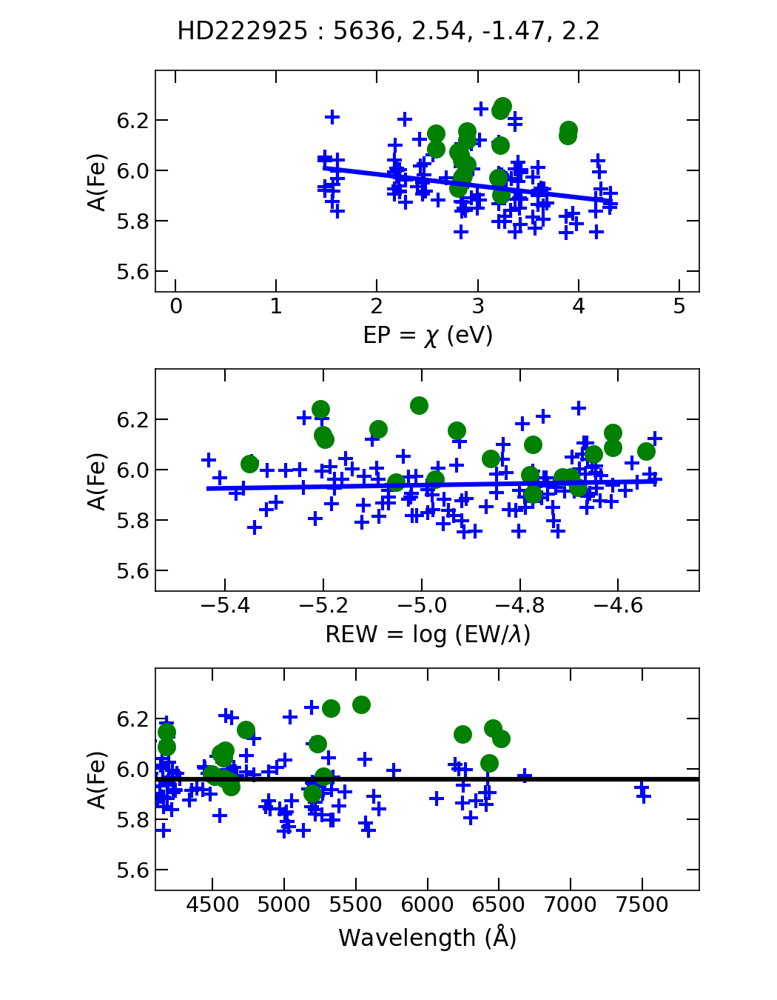

A(Fe I)  = 5.940 +/- 0.102
A(Fe II) = 6.062 +/- 0.102
A(FeI) vs. EP slope  = -0.0462 +/- 0.0119
A(FeI) vs. REW slope = 0.0311 +/- 0.0408


In [97]:
%matplotlib nbagg
q2.specpars.iron_stats(star, plot=f'{moog_out_path_upd}/diagnostic_plots_filtered')
print("A(Fe I)  = {0:5.3f} +/- {1:5.3f}".\
    format(star.iron_stats['afe1'], star.iron_stats['err_afe1']))


print("A(Fe II) = {0:5.3f} +/- {1:5.3f}".\
    format(star.iron_stats['afe2'], star.iron_stats['err_afe2']))

print("A(FeI) vs. EP slope  = {0:.4f} +/- {1:.4f}".\
    format(star.iron_stats['slope_ep'], star.iron_stats['err_slope_ep']))

print("A(FeI) vs. REW slope = {0:.4f} +/- {1:.4f}".\
    format(star.iron_stats['slope_rew'], star.iron_stats['err_slope_rew']))

In [48]:
# %matplotlib nbagg
# q2.specpars.fancy_ironstats_plot(star)

### Calculate ucertainties

**The function below calculates uncertainties in stellar parameters and iron abundances as follows**:

1) Stellar parameters are updated using adjustments (**dteff**, **dlogg**, **dvt**). These calculations are performed for both incremental increases and decreases in the parameters (Teff + dteff, Teff - dteff etc.) to get central difference.

2) Iron statistics (`iron.stats`) is recalculated based on the updated params. **ep_slope**, **ep_slope_err**, **rew_slope**, **rew_slope_err**, **(A(FeI) + nlte) - A(FeII)** and **[(A(FeI) + nlte) - A(FeII)]_err** are computed within each iron statistics output.

3) The changes in the mentioned `iron.stats` outputs are averaged for each parameter and propagated to get average errors for each stellar parameter (**teff_err**, **logg_err**, **vt_err**).

4) The parameters are adjusted by the calculated errors (Teff + teff_err, Teff - teff_err etc.).

5) `iron.stats` is recalculated based on these adjusted parameters. The average difference in iron abundances is calculated by dividing by 2.

6) The overall error is calculated by combining these average differences with the standard error in iron statistics  in quadrature (average differences in iron abundances due to changes in Teff, logg, and vt and the statistical errors inherent in the iron statistics themselves).

In [30]:
dteff = 20
dvt = 0.02
dlogg = 0.02
nlte = 0.25 #average nlte correction for A(FeI)

q2.errors.error_one(star, 'marcs', dteff, dvt, dlogg, nlte)
print("err_Teff = {0:2.0f} K, err_logg = {1:4.2f}, err_A(Fe) = {2:4.2f}, err_vt = {3:4.2f}".\
      format(star.sp_err['teff'], star.sp_err['logg'], star.sp_err['afe'], star.sp_err['vt']))

err_Teff = 118 K, err_logg = 0.22, err_A(Fe) = 0.09, err_vt = 0.10


### Save the solution for the star. We will use this file for measuring  abundances of other elements and for error propagation

<span style="color:blue;">Note: If there are changes to the stellar parameters later, such as after optimizing the logg value further in the code, the solution file should be updated accordingly. The 'MOOG_OUTPUT' folder name should also reflect the final stellar parameters</span> 

In [31]:
data = [
    {
        'id': star_id,
        'teff': Teff,
        'logg': logg,
        'feh_model': feh,
        'vt': vt,
        'feh': star.iron_stats['afe'] ,
        'err_feh': star.iron_stats['err_afe'],
        'feh1': star.iron_stats['afe1'] - 7.50, #Asplund+2009
        'err_feh1': star.iron_stats['err_afe1'],
        'nfe1': star.iron_stats['nfe1'],
        'feh2': star.iron_stats['afe2'] - 7.50, #Asplund+2009
        'err_feh2': star.iron_stats['err_afe2'],
        'nfe2': star.iron_stats['nfe2'],
        'slope_ep': star.iron_stats['slope_ep'],
        'err_slope_ep': star.iron_stats['err_slope_ep'],
        'slope_rew':star.iron_stats['slope_rew'],
        'err_slope_rew': star.iron_stats['err_slope_rew'],
        'err_teff': star.sp_err['teff'],
        'err_logg': star.sp_err['logg'],
        'err_feh_': star.sp_err['afe'],
        'err_vt': star.sp_err['vt']
    },

]

write_solution_csv(star_id, data)

### Optional: Run test for stellar parameters

Before, we were using the q2.specpars module to calculate iron_stats for a fixed set of parameters. Now we can use it to solve for better parameters ("better" here means **consistent with 1D-LTE excitation/ionization equilibrium**).

Starting from the input Teff, logg, and vt, q<sup>2</sup> will try to find those values that minimize the slopes of iron abundance versus line EP and REW as well as match the average FeI and FeII abundances. This is an iterative procedure. We can set the initial steps for the changes to be applied to those parameters (step_teff, step_logg, etc.) using the sp SolvePars object. Also, it is a good idea to set a maximum number of iterations (niter) in case q<sup>2</sup> is not able to converge quickly (or at all). At this point we can also set the model atmosphere grid we want to use. In this example we are using MARCS models again.

Note that we are using a PlotPars object called "pp" to make our output figure look a bit nicer than the default. In this example, we are forcing the y-axis of the figures to extend from -0.25 dex to +0.25 from the average iron abundance measured.

nlte parameter is an approximate average nlte correction for FeI lines ised for (FeI + nlte) = FeII ionization equilibrium.

it Teff logg [Fe/H]  vt           [Fe/H]
-- ---- ---- ------ ----      --------------
 0 5636 2.54 -1.500 2.20 --->  5.986+/-0.134
 1 5628 2.63 -1.464 2.28 --->  5.964+/-0.138
 2 5620 2.72 -1.486 2.20 --->  5.985+/-0.145
 3 5612 2.63 -1.465 2.28 --->  5.953+/-0.140
 4 5604 2.72 -1.497 2.20 --->  5.974+/-0.147
 5 5596 2.63 -1.476 2.28 --->  5.941+/-0.141
 6 5588 2.72 -1.509 2.20 --->  5.962+/-0.149
 7 5580 2.63 -1.488 2.28 --->  5.929+/-0.143
 8 5572 2.54 -1.521 2.20 --->  5.939+/-0.139
 9 5564 2.63 -1.511 2.28 --->  5.917+/-0.145
10 5556 2.54 -1.533 2.20 --->  5.927+/-0.140
11 5548 2.63 -1.523 2.28 --->  5.905+/-0.147
12 5540 2.54 -1.545 2.20 --->  5.915+/-0.142
13 5532 2.63 -1.535 2.28 --->  5.892+/-0.149
14 5524 2.54 -1.558 2.20 --->  5.902+/-0.144
15 5516 2.45 -1.548 2.28 --->  5.871+/-0.139
16 5508 2.54 -1.579 2.20 --->  5.889+/-0.145
17 5500 2.45 -1.561 2.12 --->  5.903+/-0.143
18 5492 2.54 -1.547 2.20 --->  5.879+/-0.148
19 5484 2.45 -1.571 2.12 --->  5.891+/-0.145
20 5476 2.36 -

<IPython.core.display.Javascript object>


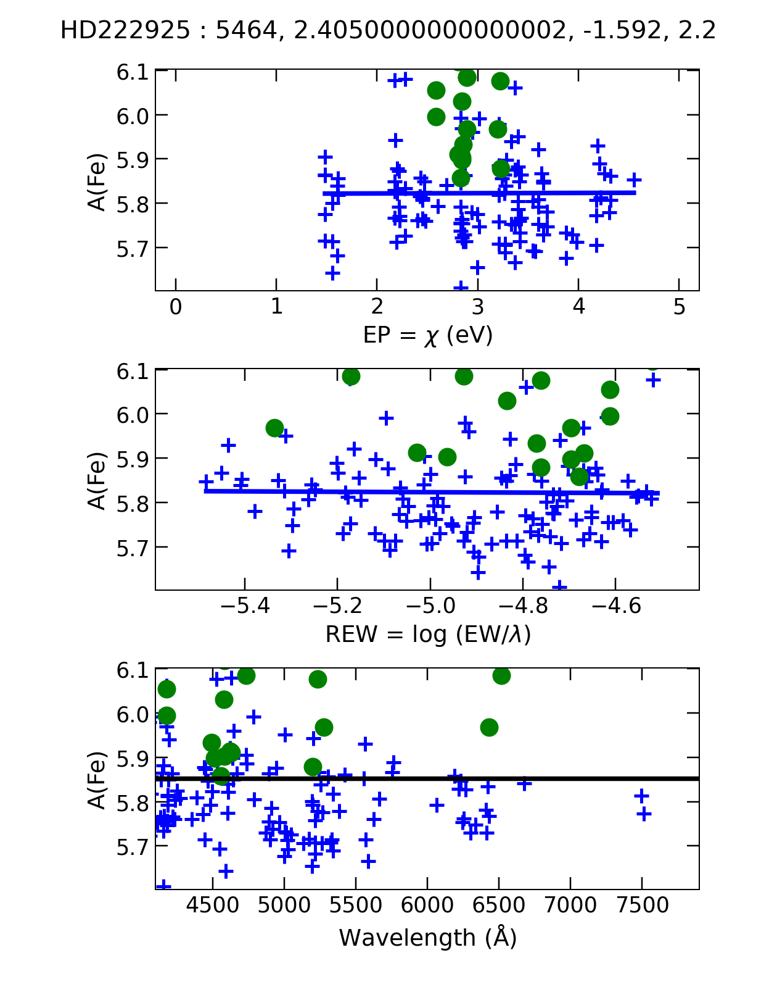

34 5464 2.41 -1.592 2.20 --->  5.852+/-0.144
-- Converged at iteration 34 of 35
35 5465 2.39 -1.598 2.19 --->  5.855+/-0.143
-- Did not achieve final convergence.
------------------------------------------------------
    A(Fe)     ||      A(Fe I)      |     A(Fe II)   
 5.855  0.143 ||  5.826  0.128 125 |  6.026  0.113  21
------------------------------------------------------


In [25]:
%matplotlib nbagg
sp = q2.specpars.SolvePars()
sp.step_teff = 8
sp.step_logg = 0.09
sp.step_vt = 0.08
sp.niter = 35
sp.grid = 'marcs'

nlte = 0.2

pp = q2.specpars.PlotPars()
pp.afe = [-1000, 0.25] # when ymin is set to -1000, q2 makes the y-axis centered around the derived mean iron abundance and extends it to +/-ymax

q2.specpars.solve_one(star, sp, nlte, PlotPars=pp)


In [27]:
dteff = 20
dvt = 0.02
dlogg = 0.02

q2.errors.error_one(star, sp.grid, dteff, dvt, dlogg, nlte, SolvePars=sp)
print("err_Teff = {0:2.0f} K, err_logg = {1:4.2f}, err_A(Fe) = {2:4.2f}, err_vt = {3:4.2f}".\
      format(star.sp_err['teff'], star.sp_err['logg'], star.sp_err['afe'], star.sp_err['vt']))

err_Teff = 89 K, err_logg = 0.26, err_A(Fe) = 0.07, err_vt = 0.06


### Note:these parameters are provided for informational purposes only; they are not recordered or used elsewhere in the code

# 3. Apply NLTE corrections

### <span style="color:red;">NOTE:</span> The MPIA database allows a maximum of <span style="color:red;">99 lines</span> to be processed at once. If your `moog_out_fe_filtered.csv` linelist exceeds this limit, make sure to split it accordingly.


In [43]:
from NLTE import apply_nlte

In [44]:
filtered_moog_df = pd.read_csv(f'{moog_out_path_upd}/moog_out_fe_filtered.csv', delim_whitespace=False, engine='python')
star_info = [Teff, logg,feh, vt] 
nlte_results = apply_nlte(filtered_moog_df, database='mpia', star_info=star_info, model_atmos='marcs')

No NLTE departures for this line26.01 5307.36
No NLTE departures for this line26.01 5332.9
No NLTE departures for this line26.01 8688.624
No NLTE departures for this line26.01 8220.379
No NLTE departures for this line26.01 6750.152
No NLTE departures for this line26.01 6430.846
No NLTE departures for this line26.01 6421.35
No NLTE departures for this line26.01 6246.32
No NLTE departures for this line26.01 6219.28
No NLTE departures for this line26.02 6432.677
No NLTE departures for this line26.02 5534.839
No NLTE departures for this line26.02 5325.543
No NLTE departures for this line26.02 5275.997
No NLTE departures for this line26.02 5234.624
No NLTE departures for this line26.02 4731.439
No NLTE departures for this line26.02 4620.513
No NLTE departures for this line26.02 4178.854
No NLTE departures for this line26.02 4178.854
No NLTE departures for this line26.02 6456.381
No NLTE departures for this line26.02 6516.077


In [45]:
nlte_results['line'] = nlte_results['line'].astype(moog_df['ww'].dtype)
df_merged = pd.merge(filtered_moog_df, nlte_results, left_on='ww', right_on='line', how='left')

df_merged.drop(columns=['line', 'elem', 'difab'], inplace=True)

df_merged.to_csv(f'{moog_out_path_upd}/MOOG_OUT_Fe_NLTE_final.csv', index=False)

In [46]:
#Now, let's read the final csv file containing NLTE corrections and see how these corrections are distributed.
#Note that for all NaN and 999.0 we set delta to 0.0

df_nlte = pd.read_csv(f'{moog_out_path_upd}/MOOG_OUT_Fe_NLTE_final.csv')
df_nlte['nlte_delta'] = df_nlte['nlte_delta'].astype(float)
df_nlte['nlte_delta'].fillna(0.0, inplace=True)
df_nlte['nlte_delta'].replace(999.0, 0.0, inplace=True)



df_nlte

,id,ww,ep,ew,rew,ab,nlte_delta
0,26.01,3742.617,2.938,73.1,-4.709,5.912,0.238
1,26.01,3808.729,2.557,72.1,-4.723,5.862,0.258
2,26.01,3949.953,2.174,82.7,-4.679,5.741,0.268
3,26.01,3977.741,2.196,88.1,-4.655,5.725,0.266
4,26.01,4058.217,3.209,44.4,-4.961,6.037,0.216
...,...,...,...,...,...,...,...
138,26.02,5534.839,3.245,53.8,-5.012,6.224,0.000
139,26.02,6247.559,3.892,38.2,-5.214,6.107,-0.004
140,26.02,6432.677,2.891,26.7,-5.382,5.974,0.000
141,26.02,6456.381,3.903,52.1,-5.093,6.134,0.000


<IPython.core.display.Javascript object>


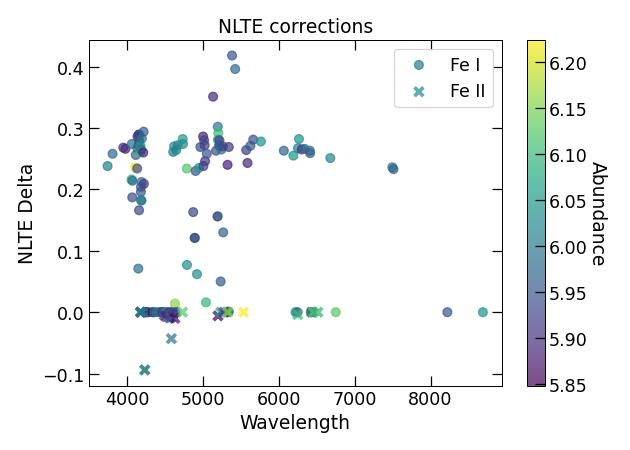

In [47]:
%matplotlib nbagg
df_feI = df_nlte[df_nlte['id'] == 26.01]
df_feII = df_nlte[df_nlte['id'] == 26.02]

plt.figure(figsize=(7, 5))

plt.scatter(df_feI['ww'].astype(float), df_feI['nlte_delta'].astype(float), c=df_feI['ab'], cmap='viridis', s=50, alpha=0.7, marker='o', label='Fe I')
plt.scatter(df_feII['ww'].astype(float), df_feII['nlte_delta'].astype(float), c=df_feII['ab'], cmap='viridis', s=50, alpha=0.7, marker='x', label='Fe II')

cbar = plt.colorbar()
cbar.set_label('Abundance', rotation=270, labelpad=15)

plt.title('NLTE corrections', fontsize=15)
plt.xlabel('Wavelength')
plt.ylabel('NLTE Delta')
plt.legend()

plt.tight_layout()
plt.show()


# Make diagnostic plots for LTE and NLTE abundances

Note: The standard deviation displayed on the plots reflects the linear fit. The standard deviation relative to the mean is printed out below the plots

<IPython.core.display.Javascript object>


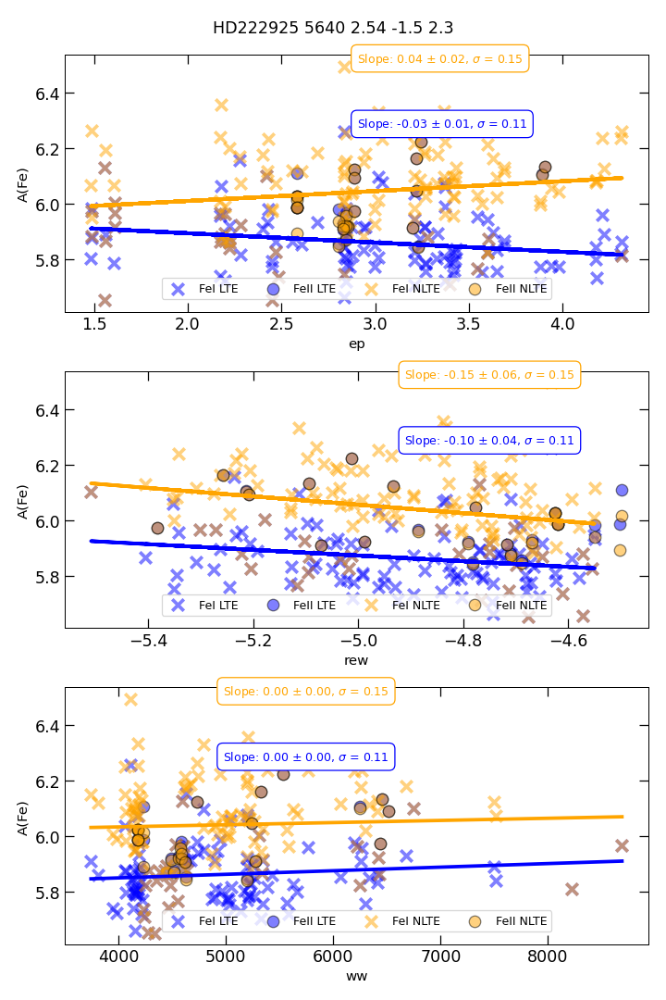

mean A(FeI)_LTE: 5.86, std = 0.11
mean A(FeI)_NLTE: 6.04, std = 0.15
mean A(FeII)_LTE: 6.00,  std = 0.10
mean A(FeII)_NLTE: 5.99,  std = 0.10


In [48]:
%matplotlib nbagg
fig, axes = plt.subplots(3, 1, figsize=(8, 12))

for ax, x_data, y_data, x_label in zip(axes, [df_feI['ep'], df_feI['rew'], df_feI['ww']], [df_feI['ab'], df_feI['ab'], df_feI['ab']], ['ep', 'rew', 'ww']):
    plot_with_linear_fit(ax, x_data, y_data, marker='x', color='blue', label='FeI LTE')
    ax.scatter(df_feII[x_label], df_feII['ab'], marker='o', color='blue', edgecolor='k', label='FeII LTE', alpha=0.5)
    plot_with_linear_fit(ax, x_data, y_data + df_feI['nlte_delta'], marker='x', color='orange', label='FeI NLTE')
    ax.scatter(df_feII[x_label], df_feII['ab'] + df_feII['nlte_delta'], marker='o', color='orange', edgecolor='k', label='FeII NLTE', alpha=0.5)
    ax.set_xlabel(x_label, fontsize=12)
    ax.set_ylabel('A(Fe)', fontsize=12)
    ax.legend(fontsize=10, loc='lower center', bbox_to_anchor=(0.5, 0.05), borderaxespad=0., ncol=4)

    
fig.suptitle(f'{star_id} {Teff} {logg} {feh} {vt}', fontsize=14)
plt.tight_layout()
plt.savefig(f'{moog_out_path_upd}/diagnostic_plots_nlte')
plt.show()



print(f"mean A(FeI)_LTE: {np.mean(df_feI['ab']):.2f}, std = {np.std(df_feI['ab']):.2f}")
print(f"mean A(FeI)_NLTE: {np.mean(df_feI['ab'] + df_feI['nlte_delta']):.2f}, std = {np.std(df_feI['ab'] + df_feI['nlte_delta']):.2f}")
print(f"mean A(FeII)_LTE: {np.mean(df_feII['ab']):.2f},  std = {np.std(df_feII['ab']):.2f}")
print(f"mean A(FeII)_NLTE: {np.mean(df_feII['ab'] + df_feII['nlte_delta']):.2f},  std = {np.std(df_feII['ab'] + df_feII['nlte_delta']):.2f}")

In [49]:
delta_fe_nlte = abs(np.mean(df_feI['ab'] + df_feI['nlte_delta']) - np.mean(df_feII['ab'] + df_feII['nlte_delta']))

## Solve for better logg

This part needs handling with 99 lines limit! Work in progress

In [50]:
from logg_optimization import solve_for_logg
from scipy.interpolate import interp1d

After removing outliers, there are 141 lines remaining.
No NLTE departures for this line26.01 5307.36
No NLTE departures for this line26.01 5332.9
No NLTE departures for this line26.01 8688.624
No NLTE departures for this line26.01 8220.379
No NLTE departures for this line26.01 6750.152
No NLTE departures for this line26.01 6430.846
No NLTE departures for this line26.01 6421.35
No NLTE departures for this line26.01 6246.32
No NLTE departures for this line26.01 6219.28
No NLTE departures for this line26.02 6432.677
No NLTE departures for this line26.02 5325.543
No NLTE departures for this line26.02 5275.997
No NLTE departures for this line26.02 5234.624
No NLTE departures for this line26.02 4731.439
No NLTE departures for this line26.02 4620.513
No NLTE departures for this line26.02 4178.854
No NLTE departures for this line26.02 4178.854
No NLTE departures for this line26.02 6456.381
No NLTE departures for this line26.02 6516.077


<IPython.core.display.Javascript object>


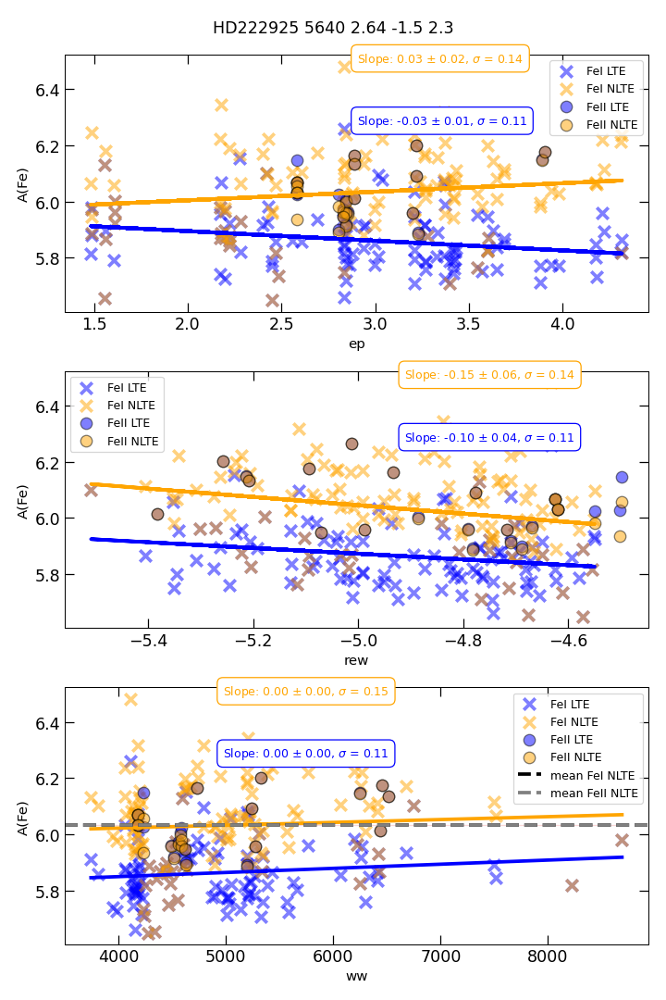

mean A(FeI)_LTE: 5.86
mean A(FeI)_NLTE: 6.03
mean A(FeII)_LTE: 6.05
mean A(FeII)_NLTE: 6.03
--------------------------
Elapsed time for running this cell: 51.76 seconds


In [51]:
%matplotlib nbagg
new_logg = logg + 0.1
pyew_output_dir = f'{pyEW_dir}/PYEW_OUTPUT'

save_output = True # Do you want to keep the MOOG_OUTPUT directory for the parameters with new logg?

delta_fe_nlte_new_logg = solve_for_logg(star_id, Teff, new_logg, feh, vt, lower_ew_threshold, upper_ew_threshold, ep_threshold, delavg_threshold, moog_dir, save_output)

Slope: -0.42


<IPython.core.display.Javascript object>


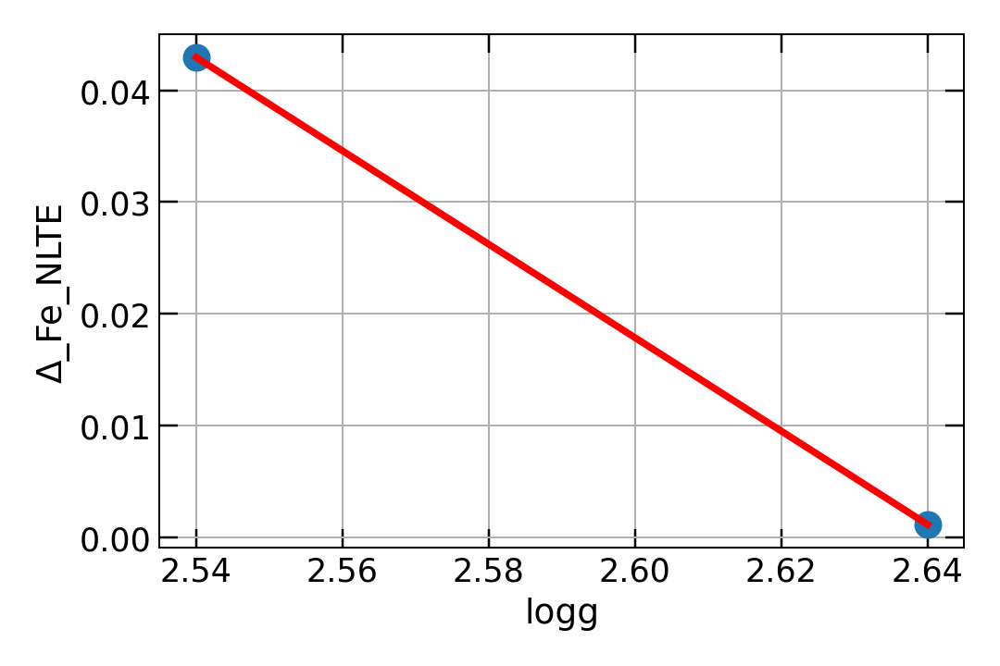

In [74]:
logg_values = np.array([logg, new_logg])
delta_fe_nlte_values = np.array([delta_fe_nlte, delta_fe_nlte_new_logg])


interpolated_function = interp1d(logg_values, delta_fe_nlte_values, kind='linear')

logg_range = np.linspace(min(logg_values), max(logg_values), 100)
delta_fe_nlte_interpolated = interpolated_function(logg_range)

slope = (delta_fe_nlte_new_logg - delta_fe_nlte) / (new_logg - logg)
print("Slope: {:.2f}".format(slope))

plt.figure(figsize=(6, 4))
plt.plot(logg_values, delta_fe_nlte_values, 'o')
plt.plot(logg_range, delta_fe_nlte_interpolated, color='red')
plt.xlabel('logg')
plt.ylabel('Δ_Fe_NLTE')

#plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


## Run MC simulation for uncertainties

Get uncertainties by running num_iterations of MC simulations with changing stellar parameters withing 1 sigma. The result is mean FeI and FeII abundances with errors  **for LTE abundances**

In [7]:
from MC import run_MC

initial_params = {'teff': 5636, 'logg': 2.54, 'feh': -1.5, 'vt': 2.2} # what are your best parameters?
num_iterations = 100 
teff_err = 100
logg_err = 0.3
feh_err = 0.3
vt_err = 0.3
 
MC_results = run_MC(star_id, initial_params, num_iterations, teff_err, logg_err, feh_err, vt_err)

Elapsed time for 100 iterations: 2 minutes 11.94 seconds


In [8]:
A_fe1_values = [result['fe1_abundance'] for result in MC_results]
mean_fe1 = np.mean(A_fe1_values)
std_fe1 = np.std(A_fe1_values)

A_fe2_values = [result['fe2_abundance'] for result in MC_results]
mean_fe2 = np.mean(A_fe2_values)
std_fe2 = np.std(A_fe2_values)

print(f"MC simulations result:")
print(f"----------------------")
print(f"A(FeI): {mean_fe1:.2f} ± {std_fe1:.2f}")
print(f"A(FeII): {mean_fe2:.2f} ± {std_fe2:.2f}")



MC simulations result:
----------------------
A(FeI): 5.94 ± 0.13
A(FeII): 6.06 ± 0.16
